# TCR analysis of DPT... using the VDJ object Kelvin has generated.


## Loading data

Load up all pacakges

In [1]:
import os
import scanpy as sc
import pandas as pd
import dandelion as ddl
from tqdm import tqdm

# show the current directory
os.getcwd()


'/Users/uqssoon/Documents/Projects/Jaz-project/notebooks'

In [2]:
# software versions

sc.logging.print_header()

/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/umap/distances.

scanpy==1.9.3 anndata==0.9.2 umap==0.5.3 numpy==1.24.4 scipy==1.11.1 pandas==1.5.3 scikit-learn==1.3.0 statsmodels==0.14.0 python-igraph==0.10.6 pynndescent==0.5.10


/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/umap/umap_.py:660: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.


In [3]:
ddl.logging.print_header()

dandelion==0.3.3.dev41 pandas==1.5.3 numpy==1.24.4 matplotlib==3.7.2 networkx==3.1 scipy==1.11.1


#### This is all pre-processing done by Kelvin. DO NOT RUN THIS. 

I'm accessing the data through the HPC so the data lives at `/QRISdata/Q5688/GONZ-0001/TCR/` and `/QRISdata/Q5688/GONZ-0001_run2/TCR/`. I've assigned the locations to two variables via a dictionary.

In [4]:
# RAWFOLDER1 = "/QRISdata/Q5688/GONZ-0001/TCR"
# RAWFOLDER2 = "/QRISdata/Q5688/GONZ-0001_run2/TCR"
##  also specify the names of the folders (sans _GEX for simplicity)
# sample_dict = {
#    "CD4_L01": RAWFOLDER2,
#    "CD4_P01": RAWFOLDER1,
#    "CD4_WY": RAWFOLDER2,
#    "CD8_L01": RAWFOLDER1,
#    "CD8_P01": RAWFOLDER1,
#    "CD8_WY": RAWFOLDER2,
#    "DP_L01": RAWFOLDER1,
#    "DP_P01": RAWFOLDER1,
#    "DP_WY": RAWFOLDER1,
#    "V_CD4": RAWFOLDER1,
#    "V_CD8": RAWFOLDER2,
#    "V_DP": RAWFOLDER1,
# }



## And then read in files... using for-loop - read files, add them to a list, concatenate them, save. 

# from pathlib import Path

# vdj_list = []  # create an empty list first
# for sample in tqdm(sample_dict.keys()):
    # we will use Path to construct the path to the 10x file
    # you can also just use
    # file_path = "/QRISdata/Q5688/GONZ-0001/TCR/" + sample + "_TCR/outs/filtered_contig_annotations.csv"
    # exactly the same
#    file_path = (
#        Path(sample_dict[sample])
#        / (sample + "_TCR")
#        / "outs"
#        / "filtered_contig_annotations.csv"
#    )
#    tmp = ddl.read_10x_vdj(file_path)
#    tmp.data.cell_id = [sample + "_" + n for n in tmp.data.cell_id]
#    tmp.data.sequence_id = [sample + "_" + n for n in tmp.data.sequence_id]
#    tmp.update_metadata()
    # ok now concatenate
#    vdj_list.append(tmp)


#### Actually concatenate

# vdj = ddl.concat(vdj_list)
# vdj

### making output directory
# out_path = Path("/QRISdata/Q5688") / "kelvin" / "h5ad"
# out_path.mkdir(parents=True, exist_ok=True)
# vdj.write_h5ddl(out_path / "adata_tcr_raw.h5ddl")


#### Let's read in

In [4]:
# first do GEX object 

adata = sc.read_h5ad("/Users/uqssoon/Documents/Projects/Jaz-project/Output_MS/objects/adata_processed_v2_BBKNN_celltypist_MS_300823.h5ad")

In [5]:
adata

AnnData object with n_obs × n_vars = 71564 × 2285
    obs: 'sample', 'sort_type', 'donor', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'scrublet_score', 'n_genes', 'gmm_pct_count_clusters_keep', 'is_doublet', 'filter_rna', 'batch', 'CD4/CD8_geneset', 'leiden', 'celltypist_majority_voting', 'celltypist_annotation'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'celltypist_annotation_colors', 'celltypist_majority_voting_colors', 'donor_colors', 'filter_rna_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'sample_colors', 'sort_type_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [6]:
#### I had problems loading the ddl object as it was misisng the tables module. 
# https://stackoverflow.com/questions/73029883/could-not-find-hdf5-installation-for-pytables-on-m1-mac 

## I used the: 
#pip install cython
#brew install hdf5
#brew install c-blosc
#export HDF5_DIR=/opt/homebrew/opt/hdf5 
#export BLOSC_DIR=/opt/homebrew/opt/c-blosc     on the home environment 

# And then in Jaz2023_env I did:
#pip install git+https://github.com/PyTables/PyTables

In [6]:
vdj = ddl.read_h5ddl("/Users/uqssoon/Documents/Projects/Jaz-project/Output_MS/objects/adata_tcr_raw.h5ddl")


In [7]:
vdj

Dandelion class object with n_obs = 101224 and n_contigs = 169228
    data: 'cell_id', 'sequence_id', 'sequence', 'sequence_aa', 'productive', 'complete_vdj', 'vj_in_frame', 'junction', 'junction_aa', 'locus', 'v_call', 'j_call', 'c_call', 'd_call', 'consensus_count', 'duplicate_count', 'cdr3_start', 'cdr3_end', 'fwr1_start', 'fwr1_end', 'fwr1', 'fwr1_aa', 'cdr1_start', 'cdr1_end', 'cdr1', 'cdr1_aa', 'fwr2_start', 'fwr2_end', 'fwr2', 'fwr2_aa', 'cdr2_start', 'cdr2_end', 'cdr2', 'cdr2_aa', 'fwr3_start', 'fwr3_end', 'fwr3', 'fwr3_aa', 'fwr4_start', 'fwr4_end', 'fwr4', 'fwr4_aa', 'clone_id', 'raw_consensus_id_10x', 'exact_subclonotype_id_10x', 'high_confidence_10x', 'filtered_10x', 'is_cell_10x', 'is_asm_cell_10x', 'rearrangement_status'
    metadata: 'clone_id', 'clone_id_by_size', 'locus_VDJ', 'locus_VJ', 'productive_VDJ', 'productive_VJ', 'v_call_VDJ', 'd_call_VDJ', 'j_call_VDJ', 'v_call_VJ', 'j_call_VJ', 'c_call_VDJ', 'c_call_VJ', 'junction_VDJ', 'junction_VJ', 'junction_aa_VDJ', 'jun

In [9]:
vdj.data

,cell_id,sequence_id,sequence,sequence_aa,productive,complete_vdj,vj_in_frame,junction,junction_aa,locus,...,fwr4,fwr4_aa,clone_id,raw_consensus_id_10x,exact_subclonotype_id_10x,high_confidence_10x,filtered_10x,is_cell_10x,is_asm_cell_10x,rearrangement_status
sequence_id,,,,,,,,,,,,,,,,,,,,,
CD4_L01_AAACCTGAGAACTGTA-1_contig_1-0,CD4_L01_AAACCTGAGAACTGTA-1,CD4_L01_AAACCTGAGAACTGTA-1_contig_1-0,TATATGGGAGAACTCACTGGGTTCTTCCCCAGGAGGACCAAGCCCT...,MGPGLLCWVLLCLLGAGPVDAGVTQSPTHLIKTRGQHVTLRCSPIS...,True,True,,TGTGCCAGCAGCCTTCACGGGGCCTTATTGGGGACCCAGTACTTC,CASSLHGALLGTQYF,TRB,...,GGGCCAGGCACGCGGCTCCTGGTGCTCG,GPGTRLLVL,clonotype4848,clonotype4848_consensus_1,1.0,True,True,NaN,True,standard
CD4_L01_AAACCTGAGAACTGTA-1_contig_2-0,CD4_L01_AAACCTGAGAACTGTA-1,CD4_L01_AAACCTGAGAACTGTA-1_contig_2-0,AAAGCAGATTCTTTTTATGATTTTTAAAGTAGAAATATCCATTCCA...,MKSLRVLLVILWLQLSWVWSQQKEVEQNSGPLSVPEGAIASLNCTY...,True,True,,TGTGCCATAAATAGGGATAACCAGGGAGGAAAGCTTATCTTC,CAINRDNQGGKLIF,TRA,...,GGACAGGGAACGGAGTTATCTGTGAAACCCA,GQGTELSVKP,clonotype4848,clonotype4848_consensus_2,1.0,True,True,NaN,True,standard
CD4_L01_AAACCTGAGAACTGTA-1_contig_3-0,CD4_L01_AAACCTGAGAACTGTA-1,CD4_L01_AAACCTGAGAACTGTA-1_contig_3-0,TTGGGGGAGAGGGGTGGGTACTGGAGAAGACCAGCCCCTTCGCCAA...,,False,False,,,,TRB,...,,,,,NaN,True,True,NaN,True,unknown
CD4_L01_AAACCTGAGAGCTATA-1_contig_1-0,CD4_L01_AAACCTGAGAGCTATA-1,CD4_L01_AAACCTGAGAGCTATA-1_contig_1-0,CCCACATGAAGTGTCTACCTTCTGCAGACTCCAATGGCTCAGGAAC...,MWGVFLLYVSMKMGGTTGQNIDQPTEMTATEGAIVQINCTYQTSGF...,True,True,,TGTGCTGTGAGTTCCCTCAAAGCTGCAGGCAACAAGCTAACTTTT,CAVSSLKAAGNKLTF,TRA,...,,,,,NaN,False,True,NaN,False,standard
CD4_L01_AAACCTGAGATGAGAG-1_contig_1-0,CD4_L01_AAACCTGAGATGAGAG-1,CD4_L01_AAACCTGAGATGAGAG-1_contig_1-0,GGAGTGATCCTGATCTGGTAAAGCTCCCATCCTGCCCTGACCCTGC...,MGTRLLFWVAFCLLGAYHTGAGVSQSPSNKVTEKGKDVELRCDPIS...,True,True,,TGTGCCAGCAGCCGGGGGAAGGGACACATTCAGTACTTC,CASSRGKGHIQYF,TRB,...,,,,,NaN,False,True,NaN,False,standard
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
V_DP_TTTGTCAGTCTACCTC-1_contig_1-11,V_DP_TTTGTCAGTCTACCTC-1,V_DP_TTTGTCAGTCTACCTC-1_contig_1-11,TGGGGACTCTGCAGGGGAGCGCTGTCAGCATGACACGTGTTAGCTT...,MTRVSLLWAVVVSTCLESGMAQTVTQSQPEMSVQEAETVTLSCTYD...,True,True,,TGTGCTTTCATGAAGCGGCCCCTCTATGGTCAGAATTTTGTCTTT,CAFMKRPLYGQNFVF,TRA,...,,,,,NaN,False,True,NaN,False,standard
V_DP_TTTGTCAGTTCGTGAT-1_contig_1-11,V_DP_TTTGTCAGTTCGTGAT-1,V_DP_TTTGTCAGTTCGTGAT-1_contig_1-11,AGTCAGAGGCCCCATCTCAGACCCGAGGCTAGCATGGGCTGCAGGC...,MGCRLLCCAVLCLLGAVPMETGVTQTPRHLVMGMTNKKSLKCEQHL...,True,True,,TGTGCCAGCAGCCAAGAAGGGTTCGGACAGTATCACACCGGGGAGC...,CASSQEGFGQYHTGELFF,TRB,...,GGAGAAGGCTCTAGGCTGACCGTACTGG,GEGSRLTVL,clonotype5,clonotype5_consensus_1,1.0,True,True,NaN,True,standard
V_DP_TTTGTCAGTTCGTGAT-1_contig_2-11,V_DP_TTTGTCAGTTCGTGAT-1,V_DP_TTTGTCAGTTCGTGAT-1_contig_2-11,TTTCTTAGTTGGGATTCTCCATATTTCAGATATAAGATTTCAGTTC...,METLLGLLILWLQLQWVSSKQEVTQIPAALSVPEGENLVLNCSFTD...,True,True,,TGTGCTGCGGACTTTGGAAATGAGAAATTAACCTTT,CAADFGNEKLTF,TRA,...,GGGACTGGAACAAGACTCACCATCATACCCA,GTGTRLTIIP,clonotype5,clonotype5_consensus_2,1.0,True,True,NaN,True,standard


In [10]:
vdj.metadata

,clone_id,clone_id_by_size,locus_VDJ,locus_VJ,productive_VDJ,productive_VJ,v_call_VDJ,d_call_VDJ,j_call_VDJ,v_call_VJ,...,j_call_abT_VDJ_main,v_call_abT_VJ_main,j_call_abT_VJ_main,v_call_gdT_VJ_main,isotype,isotype_status,locus_status,chain_status,rearrangement_status_VDJ,rearrangement_status_VJ
CD4_L01_AAACCTGAGAACTGTA-1,clonotype4848,4803,TRB|TRB,TRA,True|False,True,TRBV5-5,None,TRBJ2-5|TRBJ1-2,TRAV12-2,...,TRBJ2-5,TRAV12-2,TRAJ23,None,None|None,Multi,Extra VDJ + TRA,Extra pair,Multi,standard
CD4_L01_AAACCTGAGAGCTATA-1,None,None,None,TRA,None,True,None,None,None,TRAV1-2,...,None,TRAV1-2,TRAJ17,None,None,None,Orphan TRA,Orphan VJ,None,standard
CD4_L01_AAACCTGAGATGAGAG-1,None,None,TRB,None,True,None,TRBV7-2,None,TRBJ2-4,None,...,TRBJ2-4,None,None,None,None,None,Orphan TRB,Orphan VDJ,standard,None
CD4_L01_AAACCTGAGGAGCGAG-1,clonotype5251,5617,None,TRA,None,True,None,None,None,TRAV8-3,...,None,TRAV8-3,TRAJ16,None,None,None,Orphan TRA,Orphan VJ,None,standard
CD4_L01_AAACCTGAGGCAGTCA-1,clonotype1103,1210,TRB,TRA,True,True,TRBV6-1,None,TRBJ2-1,TRAV38-2/DV8,...,TRBJ2-1,TRAV38-2/DV8,TRAJ47,None,None,None,TRB + TRA,Single pair,standard,standard
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
V_DP_TTTGTCAGTCCTCCAT-1,None,None,TRB,TRA,True,False,TRBV6-6,None,TRBJ2-1,TRAV8-3,...,TRBJ2-1,TRAV8-3,TRAJ43,None,None,None,TRB + TRA,Single pair,standard,standard
V_DP_TTTGTCAGTCTACCTC-1,None,None,None,TRA,None,True,None,None,None,TRAV38-1,...,None,TRAV38-1,TRAJ26,None,None,None,Orphan TRA,Orphan VJ,None,standard
V_DP_TTTGTCAGTTCGTGAT-1,clonotype5,5,TRB,TRA,True,True,TRBV4-2,None,TRBJ2-2,TRAV21,...,TRBJ2-2,TRAV21,TRAJ48,None,None,None,TRB + TRA,Single pair,standard,standard
V_DP_TTTGTCATCAGCTTAG-1,clonotype589,479,TRB,None,True,None,TRBV5-1,None,TRBJ2-5,None,...,TRBJ2-5,None,None,None,None,None,Orphan TRB,Orphan VDJ,standard,None


In [11]:
# This filters the contigs and synchronises relevant information between the objects. Once linked up like this, any new information can be copied over from the Dandelion object via ddl.tl.transfer(). There will be an example later in the notebook.

# here I am also making new objects = vdjx and adatax

vdjx, adatax = ddl.pp.filter_contigs(vdj, adata)

Preparing data: 140115it [00:07, 18238.71it/s]
Scanning for poor quality/ambiguous contigs: 100%|██████████| 94745/94745 [01:09<00:00, 1367.50it/s]


Under the hood, the Dandelion object is essentially two data frames. .data holds the AIRR-compliant contig space table, while .metadata is an .obs equivalent that parses the contig information to a cell level and can be easily integrated with a Scanpy object.

In [12]:
vdjx
# this new DDL object holds the filtered DDL object.

Dandelion class object with n_obs = 48526 and n_contigs = 76003
    data: 'cell_id', 'sequence_id', 'sequence', 'sequence_aa', 'productive', 'complete_vdj', 'vj_in_frame', 'junction', 'junction_aa', 'locus', 'v_call', 'j_call', 'c_call', 'd_call', 'consensus_count', 'duplicate_count', 'cdr3_start', 'cdr3_end', 'fwr1_start', 'fwr1_end', 'fwr1', 'fwr1_aa', 'cdr1_start', 'cdr1_end', 'cdr1', 'cdr1_aa', 'fwr2_start', 'fwr2_end', 'fwr2', 'fwr2_aa', 'cdr2_start', 'cdr2_end', 'cdr2', 'cdr2_aa', 'fwr3_start', 'fwr3_end', 'fwr3', 'fwr3_aa', 'fwr4_start', 'fwr4_end', 'fwr4', 'fwr4_aa', 'clone_id', 'raw_consensus_id_10x', 'exact_subclonotype_id_10x', 'high_confidence_10x', 'filtered_10x', 'is_cell_10x', 'is_asm_cell_10x', 'rearrangement_status'
    metadata: 'clone_id', 'clone_id_by_size', 'locus_VDJ', 'locus_VJ', 'productive_VDJ', 'productive_VJ', 'v_call_VDJ', 'd_call_VDJ', 'j_call_VDJ', 'v_call_VJ', 'j_call_VJ', 'c_call_VDJ', 'c_call_VJ', 'junction_VDJ', 'junction_VJ', 'junction_aa_VDJ', 'junct

In [13]:
vdjx.data

,cell_id,sequence_id,sequence,sequence_aa,productive,complete_vdj,vj_in_frame,junction,junction_aa,locus,...,fwr4,fwr4_aa,clone_id,raw_consensus_id_10x,exact_subclonotype_id_10x,high_confidence_10x,filtered_10x,is_cell_10x,is_asm_cell_10x,rearrangement_status
sequence_id,,,,,,,,,,,,,,,,,,,,,
CD4_L01_AAACCTGAGGCAGTCA-1_contig_2-0,CD4_L01_AAACCTGAGGCAGTCA-1,CD4_L01_AAACCTGAGGCAGTCA-1_contig_2-0,GTTCCCCTATCACCGATGCACAGACCCAGAAGACCCCTCCATCCTG...,MSIGLLCCVAFSLLWASPVNAGVTQTPKFQVLKTGQSMTLQCAQDM...,True,True,,TGTGCCAGCAGTGAAATAAGGCCGCGGGAGTTCTTC,CASSEIRPREFF,TRB,...,GGGCCAGGGACACGGCTCACCGTGCTAG,GPGTRLTVL,clonotype1103,clonotype1103_consensus_1,1.0,True,True,NaN,True,standard
CD4_L01_AAACCTGAGGCAGTCA-1_contig_1-0,CD4_L01_AAACCTGAGGCAGTCA-1,CD4_L01_AAACCTGAGGCAGTCA-1_contig_1-0,AGAAGAGGAGGCTTCTCACCCTGCAGCAGGGACCTGTGAGCATGGC...,MACPGFLWALVISTCLEFSMAQTVTQSQPEMSVQEAETVTLSCTYD...,True,True,,TGTGCTTATCAGGAATATGGAAACAAGCTGGTCTTT,CAYQEYGNKLVF,TRA,...,GGCGCAGGAACCATTCTGAGAGTCAAGTCCT,GAGTILRVKS,clonotype1103,clonotype1103_consensus_2,1.0,True,True,NaN,True,standard
CD4_L01_AAACCTGAGTCAAGCG-1_contig_1-0,CD4_L01_AAACCTGAGTCAAGCG-1,CD4_L01_AAACCTGAGTCAAGCG-1_contig_1-0,CTGGAAGACCACCTGGGCTGTCATTGAGCTCTGGTGCCAGGAGGAA...,MDKILGASFLVLWLQLCWVSGQQKEKSDQQQVKQSPQSLIVQKGGI...,True,True,,TGTGCAGCAAGCGGACAGGCAGGAACTGCTCTGATCTTT,CAASGQAGTALIF,TRA,...,GGGAAGGGAACCACCTTATCAGTGAGTTCCA,GKGTTLSVSS,clonotype1244,clonotype1244_consensus_2,1.0,True,True,NaN,True,standard
CD4_L01_AAACCTGAGTCAAGCG-1_contig_2-0,CD4_L01_AAACCTGAGTCAAGCG-1,CD4_L01_AAACCTGAGTCAAGCG-1_contig_2-0,GTCATCCCTCCTCGCTGGTGAATGGAGGCAGTGGTCACAACTCTCC...,MLLLLLLLGPGSGLGAVVSQHPSRVICKSGTSVKIECRSLDFQATT...,True,True,,TGCAGTGCCATTGACACCGGACAGGACTACGAGCAGTACTTC,CSAIDTGQDYEQYF,TRB,...,GGGCCGGGCACCAGGCTCACGGTCACAG,GPGTRLTVT,clonotype1244,clonotype1244_consensus_1,1.0,True,True,NaN,True,standard
CD4_L01_AAACCTGAGTCCTCCT-1_contig_2-0,CD4_L01_AAACCTGAGTCCTCCT-1,CD4_L01_AAACCTGAGTCCTCCT-1_contig_2-0,ACAACTCTCCCCAGAGAAGGTGGTGTGAGGCCATCACGGAAGATGC...,MLLLLLLLGPGSGLGAVVSQHPSRVICKSGTSVKIECRSLDFQATT...,True,True,,TGCAGTGCCTTCGTGGAATATAATGGCTACACCTTC,CSAFVEYNGYTF,TRB,...,GGTTCGGGGACCAGGTTAACCGTTGTAG,GSGTRLTVV,clonotype248,clonotype248_consensus_1,1.0,True,True,NaN,True,standard
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
V_DP_TTTGGTTTCCCATTTA-1_contig_2-11,V_DP_TTTGGTTTCCCATTTA-1,V_DP_TTTGGTTTCCCATTTA-1_contig_2-11,TGGGAGGACAGATTCTTTTTATGATTCCTAAAGTGGAAGAAATAAA...,MISLRVLLVILWLQLSWVWSQRKEVEQDPGPFNVPEGATVAFNCTY...,True,True,,TGTGTGGTTCCTTTTTCTGGTGGCTACAATAAGCTGATTTTT,CVVPFSGGYNKLIF,TRA,...,GGAGCAGGGACCAGGCTGGCTGTACACCCAT,GAGTRLAVHP,clonotype659,clonotype659_consensus_2,1.0,True,True,NaN,True,standard
V_DP_TTTGGTTTCTTGTCAT-1_contig_2-11,V_DP_TTTGGTTTCTTGTCAT-1,V_DP_TTTGGTTTCTTGTCAT-1_contig_2-11,GTCCTGTCTCCTCATCTGCAAAATTAGGAAGCCTGTCTTGATTATC...,MSNQVLCCVVLCFLGANTVDGGITQSPKYLFRKEGQNVTLSCEQNL...,True,True,,TGTGCCAGTAGTTTCAGGATGACCGGGGAGCTGTTTTTT,CASSFRMTGELFF,TRB,...,GGAGAAGGCTCTAGGCTGACCGTACTGG,GEGSRLTVL,clonotype61,clonotype61_consensus_1,1.0,True,True,NaN,True,standard
V_DP_TTTGGTTTCTTGTCAT-1_contig_1-11,V_DP_TTTGGTTTCTTGTCAT-1,V_DP_TTTGGTTTCTTGTCAT-1_contig_1-11,GGGACTCTAAGCCCAAGAGAGTTTCTTGAAGCAAAAAAAAAAAAAA...,MLLEHLLIILWMQLTWVSGQQLNQSPQSMFIQEGEDVSMNCTSSSI...,True,True,,TGTGCTGGGCAGCTAACGGGAGCCCAGAAGCTGGTATTT,CAGQLTGAQKLVF,TRA,...,GGCCAAGGAACCAGGCTGACTATCAACCCAA,GQGTRLTINP,clonotype61,clonotype61_consensus_2,1.0,True,True,NaN,True,standard


In [14]:
vdjx.metadata

,clone_id,clone_id_by_size,locus_VDJ,locus_VJ,productive_VDJ,productive_VJ,v_call_VDJ,d_call_VDJ,j_call_VDJ,v_call_VJ,...,c_call_VJ_main,v_call_abT_VDJ_main,d_call_abT_VDJ_main,j_call_abT_VDJ_main,v_call_abT_VJ_main,j_call_abT_VJ_main,locus_status,chain_status,rearrangement_status_VDJ,rearrangement_status_VJ
CD4_L01_AAACCTGAGGCAGTCA-1,clonotype1103,374,TRB,TRA,True,True,TRBV6-1,None,TRBJ2-1,TRAV38-2/DV8,...,TRAC,TRBV6-1,None,TRBJ2-1,TRAV38-2/DV8,TRAJ47,TRB + TRA,Single pair,standard,standard
CD4_L01_AAACCTGAGTCAAGCG-1,clonotype1244,1568,TRB,TRA,True,True,TRBV20-1,None,TRBJ2-7,TRAV23/DV6,...,TRAC,TRBV20-1,None,TRBJ2-7,TRAV23/DV6,TRAJ15,TRB + TRA,Single pair,standard,standard
CD4_L01_AAACCTGAGTCCTCCT-1,clonotype248,628,TRB,TRA,True,True,TRBV20-1,None,TRBJ1-2,TRAV9-2,...,TRAC,TRBV20-1,None,TRBJ1-2,TRAV9-2,TRAJ35,TRB + TRA,Single pair,standard,standard
CD4_L01_AAACCTGCAAGACGTG-1,clonotype5597,3150,TRB,None,True,None,TRBV4-2,TRBD1,TRBJ1-5,None,...,None,TRBV4-2,TRBD1,TRBJ1-5,None,None,Orphan TRB,Orphan VDJ,standard,None
CD4_L01_AAACCTGCACAAGTAA-1,clonotype3024,3080,TRB,TRA,True,True,TRBV3-1,None,TRBJ2-7,TRAV8-1,...,TRAC,TRBV3-1,None,TRBJ2-7,TRAV8-1,TRAJ8,TRB + TRA,Single pair,standard,standard
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
V_DP_TTTGGTTAGCCAACAG-1,None,None,TRB,None,True,None,TRBV7-9,None,TRBJ2-2,None,...,None,TRBV7-9,None,TRBJ2-2,None,None,Orphan TRB,Orphan VDJ,standard,None
V_DP_TTTGGTTTCCCATTTA-1,clonotype659,1912,TRB,TRA,True,True,TRBV12-4,None,TRBJ1-1,TRAV12-1,...,TRAC,TRBV12-4,None,TRBJ1-1,TRAV12-1,TRAJ4,TRB + TRA,Single pair,standard,standard
V_DP_TTTGGTTTCTTGTCAT-1,clonotype61,61,TRB,TRA,True,True,TRBV19,None,TRBJ2-2,TRAV35,...,TRAC,TRBV19,None,TRBJ2-2,TRAV35,TRAJ54,TRB + TRA,Single pair,standard,standard
V_DP_TTTGTCACAAGTAGTA-1,clonotype3,2,TRB,None,True,None,TRBV19,TRBD1,TRBJ2-3,None,...,None,TRBV19,TRBD1,TRBJ2-3,None,None,Orphan TRB,Orphan VDJ,standard,None


In [15]:
adatax
## now my adata.obs also contain all the VDJ data found in vdj.metada

AnnData object with n_obs × n_vars = 71564 × 2285
    obs: 'sample', 'sort_type', 'donor', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'scrublet_score', 'n_genes', 'gmm_pct_count_clusters_keep', 'is_doublet', 'filter_rna', 'batch', 'CD4/CD8_geneset', 'leiden', 'celltypist_majority_voting', 'celltypist_annotation', 'has_contig', 'filter_contig_quality', 'filter_contig_VDJ', 'filter_contig_VJ', 'contig_QC_pass', 'filter_contig', 'clone_id', 'clone_id_by_size', 'locus_VDJ', 'locus_VJ', 'productive_VDJ', 'productive_VJ', 'v_call_VDJ', 'd_call_VDJ', 'j_call_VDJ', 'v_call_VJ', 'j_call_VJ', 'c_call_VDJ', 'c_call_VJ', 'junction_VDJ', 'junction_VJ', 'junction_aa_VDJ', 'junction_aa_VJ', 'v_call_abT_VDJ', 'd_call_abT_VDJ', 'j_call_abT_VDJ', 'v_call_abT_VJ', 'j_call_abT_VJ', 'c_call_abT_VDJ', 'c_call_abT_VJ', 'productive_abT_VDJ', 'productive_abT_VJ', 'duplicate_count_abT_VDJ', 'duplicate_count_abT_VJ', 'v_call_VDJ_main', 'v_call_VJ_main', 'd_call_VDJ_main', 'j_call_VD

In [16]:
adatax.obs

,sample,sort_type,donor,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,scrublet_score,n_genes,gmm_pct_count_clusters_keep,...,c_call_VJ_main,v_call_abT_VDJ_main,d_call_abT_VDJ_main,j_call_abT_VDJ_main,v_call_abT_VJ_main,j_call_abT_VJ_main,locus_status,chain_status,rearrangement_status_VDJ,rearrangement_status_VJ
CD4_L01_AAACCTGAGAGCTATA-1,CD4_L01,CD4,L01,722,1726.0,14.0,0.811124,0.456193,722,True,...,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig
CD4_L01_AAACCTGAGGAGCGAG-1,CD4_L01,CD4,L01,562,1443.0,15.0,1.039501,0.156962,562,True,...,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig
CD4_L01_AAACCTGAGGCAGTCA-1,CD4_L01,CD4,L01,507,1141.0,4.0,0.350570,0.216129,507,True,...,TRAC,TRBV6-1,None,TRBJ2-1,TRAV38-2/DV8,TRAJ47,TRB + TRA,Single pair,standard,standard
CD4_L01_AAACCTGAGTCAAGCG-1,CD4_L01,CD4,L01,602,1410.0,16.0,1.134752,0.408219,602,True,...,TRAC,TRBV20-1,None,TRBJ2-7,TRAV23/DV6,TRAJ15,TRB + TRA,Single pair,standard,standard
CD4_L01_AAACCTGAGTCCTCCT-1,CD4_L01,CD4,L01,433,1064.0,7.0,0.657895,0.188953,433,True,...,TRAC,TRBV20-1,None,TRBJ1-2,TRAV9-2,TRAJ35,TRB + TRA,Single pair,standard,standard
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
V_DP_TTTGTCACATATGGTC-1,V_DP,DP,V,566,1257.0,0.0,0.000000,0.316456,566,True,...,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig
V_DP_TTTGTCACATGGTAGG-1,V_DP,DP,V,341,775.0,0.0,0.000000,0.351801,341,True,...,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig
V_DP_TTTGTCATCCTTGCCA-1,V_DP,DP,V,439,1000.0,0.0,0.000000,0.211679,439,True,...,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig
V_DP_TTTGTCATCGCCATAA-1,V_DP,DP,V,540,1165.0,0.0,0.000000,0.220339,540,True,...,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig


The thing you’re most likely to find yourself doing manually with the Dandelion object is modifying cell names to match your GEX naming convention. The cell names can be found in <.data.cell_id>, change those however you see fit and then call <.update_metadata()> to regenerate the per-cell <.obs> equivalent.

In [16]:
#vdj.data.cell_id = [result of modification procedure on existing vdj.data.cell_id]
#vdj.update_metadata()

/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


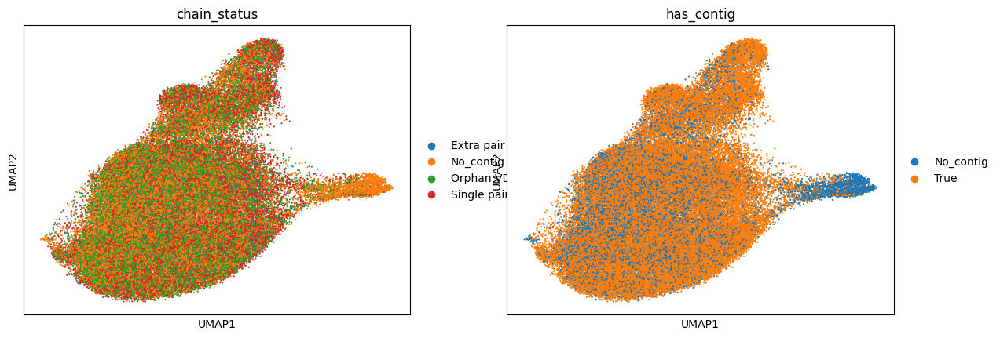

In [17]:
# For now, let’s take a look at the chain status (as gotten from the Dandelion object).

sc.pl.umap(adatax, color=["chain_status", "has_contig"], size = 10)

A core element of VDJ analysis is clonotype calling, roughly equivalent to clustering cells in GEX processing. Dandelion requires the clones it calls to have identical V and J genes, along with no more than 15% mismatches in the CDR3 sequences (common practice in BCR analysis).

For TCR clonotype calling, you can perform common practice nucleotide sequence identity by passing identity=1 and key="junction" to the function.

In [18]:
ddl.tl.find_clones(vdjx, identity = 1, key = 'junction')

Finding clones based on abT cell VDJ chains : 100%|██████████| 572/572 [00:02<00:00, 216.72it/s]
Refining clone assignment based on VJ chain pairing : 100%|██████████| 48526/48526 [00:00<00:00, 722416.12it/s]


We can compute a graph based on Levenshtein distance of the complete contig sequence. A NetworkX representation of it is now saved in vdj.graph.

The 10x-provided AIRR file is missing columns like sequence_alignment and sequence_alignment_aa so we will use the next best thing, which is sequence or sequence_aa. Note that these columns are not-gapped.

Specify key = 'sequence_aa' to toggle this behavior. Can also try junction or junction_aa if just want to visualise the CDR3 linkage.

In [19]:
#ddl.tl.generate_network(vdjx, key = 'sequence_aa')
## # if this step crashes, it may be because you need more memory... need to it on HPC? 

Since we now know what our clonotype calls are, we can quantify clonal expansion. It’s possible to cap this at a desired maximum clonotype size.

In [20]:
ddl.tl.clone_size(vdjx)
# this makes an independent column with the provided max_size in its name
# ddl.tl.clone_size (vdjx, max_size = 3)

Now that our Dandelion object has analysis information inside it, we can copy it over to the Scanpy object to have access to it there. The graph gets turned into the Scanpy standard forms of .obsp['vdj_distances'] and .obsp['vdj_connectivites'] for potential downstream use.

In [21]:
vdjx.update_plus()  
# The .metadata slot in Dandelion class automatically initializes whenever the .data slot is filled. However, it only returns a standard number of columns that are pre-specified. To retrieve other columns from the .data slot, we can update the metadata with ddl.update_metadata and specify the options retrieve and retrieve_mode.
# There is a new sub-function - update_plus() that will try and retrieve frequently used columns such as np1_length, np2_length
vdjx

Dandelion class object with n_obs = 48526 and n_contigs = 76003
    data: 'cell_id', 'sequence_id', 'sequence', 'sequence_aa', 'productive', 'complete_vdj', 'vj_in_frame', 'junction', 'junction_aa', 'locus', 'v_call', 'j_call', 'c_call', 'd_call', 'consensus_count', 'duplicate_count', 'cdr3_start', 'cdr3_end', 'fwr1_start', 'fwr1_end', 'fwr1', 'fwr1_aa', 'cdr1_start', 'cdr1_end', 'cdr1', 'cdr1_aa', 'fwr2_start', 'fwr2_end', 'fwr2', 'fwr2_aa', 'cdr2_start', 'cdr2_end', 'cdr2', 'cdr2_aa', 'fwr3_start', 'fwr3_end', 'fwr3', 'fwr3_aa', 'fwr4_start', 'fwr4_end', 'fwr4', 'fwr4_aa', 'clone_id', 'raw_consensus_id_10x', 'exact_subclonotype_id_10x', 'high_confidence_10x', 'filtered_10x', 'is_cell_10x', 'is_asm_cell_10x', 'rearrangement_status'
    metadata: 'clone_id', 'clone_id_by_size', 'locus_VDJ', 'locus_VJ', 'productive_VDJ', 'productive_VJ', 'v_call_VDJ', 'd_call_VDJ', 'j_call_VDJ', 'v_call_VJ', 'j_call_VJ', 'c_call_VDJ', 'c_call_VJ', 'junction_VDJ', 'junction_VJ', 'junction_aa_VDJ', 'junct

In [22]:
vdjx.metadata

,clone_id,clone_id_by_size,locus_VDJ,locus_VJ,productive_VDJ,productive_VJ,v_call_VDJ,d_call_VDJ,j_call_VDJ,v_call_VJ,...,v_call_abT_VDJ_main,d_call_abT_VDJ_main,j_call_abT_VDJ_main,v_call_abT_VJ_main,j_call_abT_VJ_main,locus_status,chain_status,rearrangement_status_VDJ,rearrangement_status_VJ,clone_id_size
CD4_L01_AAACCTGAGGCAGTCA-1,abT_407_2_9_1483_2_2,4003,TRB,TRA,True,True,TRBV6-1,None,TRBJ2-1,TRAV38-2/DV8,...,TRBV6-1,None,TRBJ2-1,TRAV38-2/DV8,TRAJ47,TRB + TRA,Single pair,standard,standard,1.0
CD4_L01_AAACCTGAGTCAAGCG-1,abT_427_4_173_1038_3_1,36211,TRB,TRA,True,True,TRBV20-1,None,TRBJ2-7,TRAV23/DV6,...,TRBV20-1,None,TRBJ2-7,TRAV23/DV6,TRAJ15,TRB + TRA,Single pair,standard,standard,1.0
CD4_L01_AAACCTGAGTCCTCCT-1,abT_347_2_34_191_4_1,28865,TRB,TRA,True,True,TRBV20-1,None,TRBJ1-2,TRAV9-2,...,TRBV20-1,None,TRBJ1-2,TRAV9-2,TRAJ35,TRB + TRA,Single pair,standard,standard,1.0
CD4_L01_AAACCTGCAAGACGTG-1,abT_367_4_4,28866,TRB,None,True,None,TRBV4-2,TRBD1,TRBJ1-5,None,...,TRBV4-2,TRBD1,TRBJ1-5,None,None,Orphan TRB,Orphan VDJ,standard,None,1.0
CD4_L01_AAACCTGCACAAGTAA-1,abT_113_4_34_145_1_1,28867,TRB,TRA,True,True,TRBV3-1,None,TRBJ2-7,TRAV8-1,...,TRBV3-1,None,TRBJ2-7,TRAV8-1,TRAJ8,TRB + TRA,Single pair,standard,standard,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
V_DP_TTTGGTTAGCCAACAG-1,abT_19_7_8,122,TRB,None,True,None,TRBV7-9,None,TRBJ2-2,None,...,TRBV7-9,None,TRBJ2-2,None,None,Orphan TRB,Orphan VDJ,standard,None,12.0
V_DP_TTTGGTTTCCCATTTA-1,abT_184_2_11_1133_3_6,14969,TRB,TRA,True,True,TRBV12-4,None,TRBJ1-1,TRAV12-1,...,TRBV12-4,None,TRBJ1-1,TRAV12-1,TRAJ4,TRB + TRA,Single pair,standard,standard,1.0
V_DP_TTTGGTTTCTTGTCAT-1,abT_35_3_25_1115_3_2,42821,TRB,TRA,True,True,TRBV19,None,TRBJ2-2,TRAV35,...,TRBV19,None,TRBJ2-2,TRAV35,TRAJ54,TRB + TRA,Single pair,standard,standard,1.0
V_DP_TTTGTCACAAGTAGTA-1,abT_190_3_20,6,TRB,None,True,None,TRBV19,TRBD1,TRBJ2-3,None,...,TRBV19,TRBD1,TRBJ2-3,None,None,Orphan TRB,Orphan VDJ,standard,None,57.0


In [23]:
# do the actual transfer
ddl.tl.transfer(adatax, vdjx, overwrite = True)

In [24]:
# check..
adatax

AnnData object with n_obs × n_vars = 71564 × 2285
    obs: 'sample', 'sort_type', 'donor', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'scrublet_score', 'n_genes', 'gmm_pct_count_clusters_keep', 'is_doublet', 'filter_rna', 'batch', 'CD4/CD8_geneset', 'leiden', 'celltypist_majority_voting', 'celltypist_annotation', 'has_contig', 'filter_contig_quality', 'filter_contig_VDJ', 'filter_contig_VJ', 'contig_QC_pass', 'filter_contig', 'clone_id', 'clone_id_by_size', 'locus_VDJ', 'locus_VJ', 'productive_VDJ', 'productive_VJ', 'v_call_VDJ', 'd_call_VDJ', 'j_call_VDJ', 'v_call_VJ', 'j_call_VJ', 'c_call_VDJ', 'c_call_VJ', 'junction_VDJ', 'junction_VJ', 'junction_aa_VDJ', 'junction_aa_VJ', 'v_call_abT_VDJ', 'd_call_abT_VDJ', 'j_call_abT_VDJ', 'v_call_abT_VJ', 'j_call_abT_VJ', 'c_call_abT_VDJ', 'c_call_abT_VJ', 'productive_abT_VDJ', 'productive_abT_VJ', 'duplicate_count_abT_VDJ', 'duplicate_count_abT_VJ', 'v_call_VDJ_main', 'v_call_VJ_main', 'd_call_VDJ_main', 'j_call_VD

In [25]:
vdjx

Dandelion class object with n_obs = 48526 and n_contigs = 76003
    data: 'cell_id', 'sequence_id', 'sequence', 'sequence_aa', 'productive', 'complete_vdj', 'vj_in_frame', 'junction', 'junction_aa', 'locus', 'v_call', 'j_call', 'c_call', 'd_call', 'consensus_count', 'duplicate_count', 'cdr3_start', 'cdr3_end', 'fwr1_start', 'fwr1_end', 'fwr1', 'fwr1_aa', 'cdr1_start', 'cdr1_end', 'cdr1', 'cdr1_aa', 'fwr2_start', 'fwr2_end', 'fwr2', 'fwr2_aa', 'cdr2_start', 'cdr2_end', 'cdr2', 'cdr2_aa', 'fwr3_start', 'fwr3_end', 'fwr3', 'fwr3_aa', 'fwr4_start', 'fwr4_end', 'fwr4', 'fwr4_aa', 'clone_id', 'raw_consensus_id_10x', 'exact_subclonotype_id_10x', 'high_confidence_10x', 'filtered_10x', 'is_cell_10x', 'is_asm_cell_10x', 'rearrangement_status'
    metadata: 'clone_id', 'clone_id_by_size', 'locus_VDJ', 'locus_VJ', 'productive_VDJ', 'productive_VJ', 'v_call_VDJ', 'd_call_VDJ', 'j_call_VDJ', 'v_call_VJ', 'j_call_VJ', 'c_call_VDJ', 'c_call_VJ', 'junction_VDJ', 'junction_VJ', 'junction_aa_VDJ', 'junct

In [26]:
adatax.obs['clone_id']

CD4_L01_AAACCTGAGAGCTATA-1                 No_contig
CD4_L01_AAACCTGAGGAGCGAG-1                 No_contig
CD4_L01_AAACCTGAGGCAGTCA-1      abT_407_2_9_1483_2_2
CD4_L01_AAACCTGAGTCAAGCG-1    abT_427_4_173_1038_3_1
CD4_L01_AAACCTGAGTCCTCCT-1      abT_347_2_34_191_4_1
                                       ...          
V_DP_TTTGTCACATATGGTC-1                    No_contig
V_DP_TTTGTCACATGGTAGG-1                    No_contig
V_DP_TTTGTCATCCTTGCCA-1                    No_contig
V_DP_TTTGTCATCGCCATAA-1                    No_contig
V_DP_TTTGTCATCTTGTTTG-1                    No_contig
Name: clone_id, Length: 71564, dtype: object

## Saving this raw object

In [26]:
#vdjx.write_h5ddl("adata_tcr_checked_MS_120923.h5ddl")
#adatax.write_h5ad("adata_processed_v2_tcr_MS_120923.h5ad")

vdjx.write_h5ddl("adata_tcr_checked_MS_250923.h5ddl")
adatax.write_h5ad("adata_processed_v2_tcr_MS_250923.h5ad")

KeyboardInterrupt: 

### checking out some analysis

In [27]:
adatax = sc.read_h5ad("/Users/uqssoon/Documents/Projects/Jaz-project/Output_MS/objects/adata_processed_v2_tcr_MS_250923.h5ad")

In [28]:
### Note: cannot run this as we have no network generated just yet 
# ddl.pl.clone_network(adatax, color="clone_id_size")

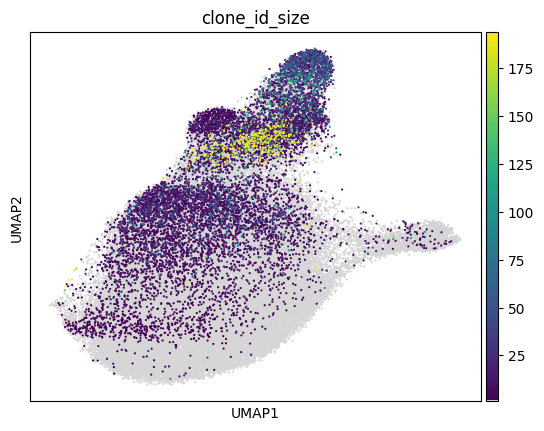

In [28]:
import tools

sc.pl.umap(adatax, color= ['clone_id_size'], color_map = tools.cmp(), size = 10)

In [29]:
ddl.tl.clone_size (vdjx)

In [30]:
# To remove any of the clone size 0 which are orphan chains, we can run this: 
ddl.tl.clone_size (vdjx, max_size = 3)
vdjx.update_plus()  
ddl.tl.transfer(adatax, vdjx, overwrite= True)

/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


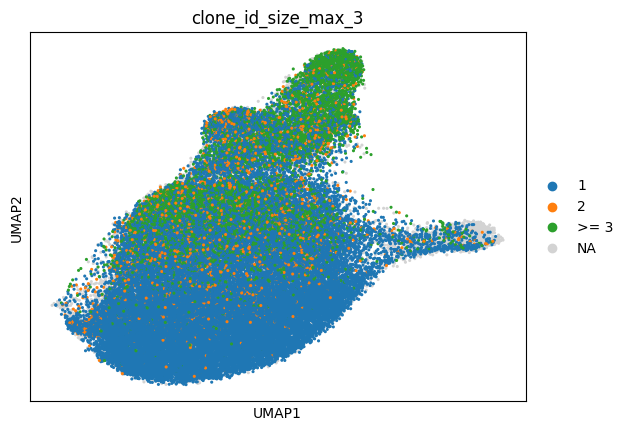

In [31]:
sc.pl.umap(adatax, color="clone_id_size_max_3", size = 20)

In [32]:
#### If you have done up scanpy's plotting defaults, you can reset it before going forward further.

import matplotlib.pyplot as plt

plt.rcParams.update(plt.rcParamsDefault)
%matplotlib inline


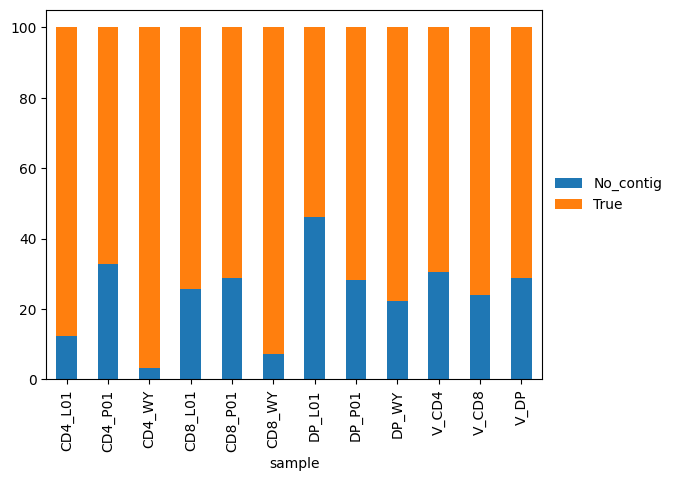

In [33]:
pd.crosstab(
    adatax.obs["sample"],
    adatax.obs["has_contig"],
).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True)
plt.legend(bbox_to_anchor=(1, 0.5), loc="center left", frameon=False)


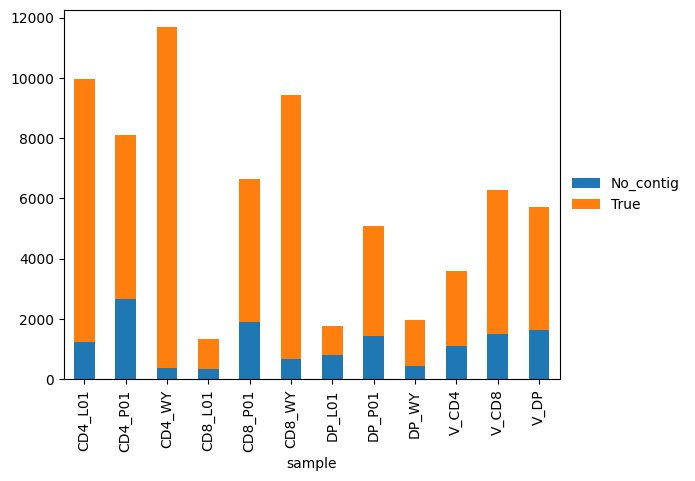

In [34]:
pd.crosstab(
    adatax.obs["sample"],
    adatax.obs["has_contig"],
).plot.bar(stacked=True)
plt.legend(bbox_to_anchor=(1, 0.5), loc="center left", frameon=False)

<Axes: xlabel='True'>

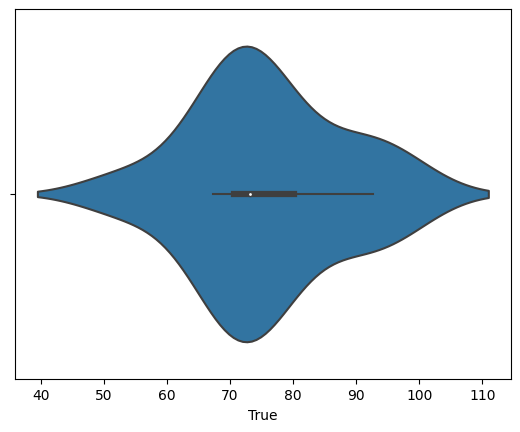

In [35]:
import seaborn as sns

df = pd.crosstab(
    adatax.obs["sample"],
    adatax.obs["has_contig"],
).apply(lambda r: r / r.sum() * 100, axis=1)

sns.violinplot(data=df, x="True")

In [36]:
vdjx.metadata

,clone_id,clone_id_by_size,locus_VDJ,locus_VJ,productive_VDJ,productive_VJ,v_call_VDJ,d_call_VDJ,j_call_VDJ,v_call_VJ,...,d_call_abT_VDJ_main,j_call_abT_VDJ_main,v_call_abT_VJ_main,j_call_abT_VJ_main,locus_status,chain_status,rearrangement_status_VDJ,rearrangement_status_VJ,clone_id_size,clone_id_size_max_3
CD4_L01_AAACCTGAGGCAGTCA-1,abT_407_2_9_1483_2_2,4003,TRB,TRA,True,True,TRBV6-1,None,TRBJ2-1,TRAV38-2/DV8,...,None,TRBJ2-1,TRAV38-2/DV8,TRAJ47,TRB + TRA,Single pair,standard,standard,1.0,1
CD4_L01_AAACCTGAGTCAAGCG-1,abT_427_4_173_1038_3_1,36211,TRB,TRA,True,True,TRBV20-1,None,TRBJ2-7,TRAV23/DV6,...,None,TRBJ2-7,TRAV23/DV6,TRAJ15,TRB + TRA,Single pair,standard,standard,1.0,1
CD4_L01_AAACCTGAGTCCTCCT-1,abT_347_2_34_191_4_1,28865,TRB,TRA,True,True,TRBV20-1,None,TRBJ1-2,TRAV9-2,...,None,TRBJ1-2,TRAV9-2,TRAJ35,TRB + TRA,Single pair,standard,standard,1.0,1
CD4_L01_AAACCTGCAAGACGTG-1,abT_367_4_4,28866,TRB,None,True,None,TRBV4-2,TRBD1,TRBJ1-5,None,...,TRBD1,TRBJ1-5,None,None,Orphan TRB,Orphan VDJ,standard,None,1.0,1
CD4_L01_AAACCTGCACAAGTAA-1,abT_113_4_34_145_1_1,28867,TRB,TRA,True,True,TRBV3-1,None,TRBJ2-7,TRAV8-1,...,None,TRBJ2-7,TRAV8-1,TRAJ8,TRB + TRA,Single pair,standard,standard,1.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
V_DP_TTTGGTTAGCCAACAG-1,abT_19_7_8,122,TRB,None,True,None,TRBV7-9,None,TRBJ2-2,None,...,None,TRBJ2-2,None,None,Orphan TRB,Orphan VDJ,standard,None,12.0,>= 3
V_DP_TTTGGTTTCCCATTTA-1,abT_184_2_11_1133_3_6,14969,TRB,TRA,True,True,TRBV12-4,None,TRBJ1-1,TRAV12-1,...,None,TRBJ1-1,TRAV12-1,TRAJ4,TRB + TRA,Single pair,standard,standard,1.0,1
V_DP_TTTGGTTTCTTGTCAT-1,abT_35_3_25_1115_3_2,42821,TRB,TRA,True,True,TRBV19,None,TRBJ2-2,TRAV35,...,None,TRBJ2-2,TRAV35,TRAJ54,TRB + TRA,Single pair,standard,standard,1.0,1
V_DP_TTTGTCACAAGTAGTA-1,abT_190_3_20,6,TRB,None,True,None,TRBV19,TRBD1,TRBJ2-3,None,...,TRBD1,TRBJ2-3,None,None,Orphan TRB,Orphan VDJ,standard,None,57.0,>= 3


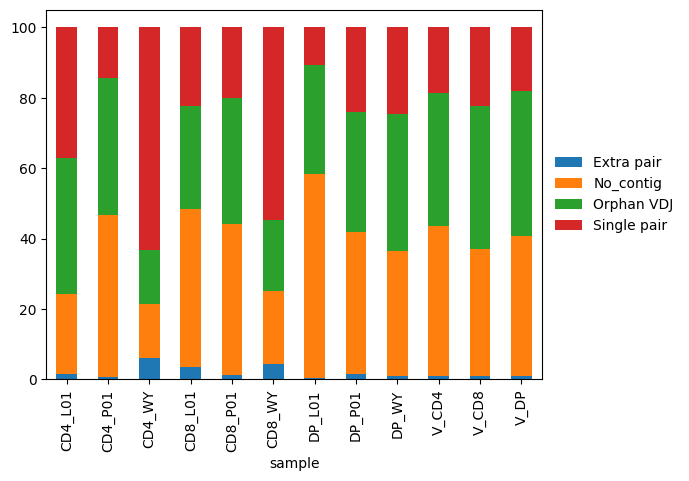

In [37]:
pd.crosstab(
    adatax.obs["sample"],
    adatax.obs["chain_status"],
).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True)
plt.legend(bbox_to_anchor=(1, 0.5), loc="center left", frameon=False)

Another common VDJ analysis request is to examine the distribution of shared clonotypes between cells of different metadata groups. Dandelion can do this as a circos plot.

In [38]:
#ddl.tl.clone_overlap(
#    adatax, groupby="celltypist_annotation", colorby="celltypist_annotation", weighted_overlap=True
#)

ddl.tl.clone_overlap(
    adatax, groupby="celltypist_annotation", weighted_overlap=True
)

In [39]:
adatax.uns['clone_overlap']

,DP,MAIT cells,Regulatory T cells,Tcm/Naive cytotoxic T cells,Tcm/Naive helper T cells,Tem/Effector helper T cells,Tem/Temra cytotoxic T cells,Tem/Trm cytotoxic T cells
abT_100_10_1,0,0,0,0,1,0,0,0
abT_100_11_1,0,0,0,0,0,0,0,1
abT_100_1_1,0,0,0,0,1,0,0,0
abT_100_1_2_853_6_2,0,0,0,0,1,0,0,0
abT_100_1_3_376_4_4,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...
abT_9_5_4_1084_1_7,0,0,0,0,1,0,0,0
abT_9_5_5,2,0,0,0,0,0,0,0
abT_9_5_6_467_3_7,0,0,0,1,0,0,0,0
abT_9_6_1,1,0,0,0,0,0,0,0


In [40]:
adatax.obs.clone_id

CD4_L01_AAACCTGAGAGCTATA-1                 No_contig
CD4_L01_AAACCTGAGGAGCGAG-1                 No_contig
CD4_L01_AAACCTGAGGCAGTCA-1      abT_407_2_9_1483_2_2
CD4_L01_AAACCTGAGTCAAGCG-1    abT_427_4_173_1038_3_1
CD4_L01_AAACCTGAGTCCTCCT-1      abT_347_2_34_191_4_1
                                       ...          
V_DP_TTTGTCACATATGGTC-1                    No_contig
V_DP_TTTGTCACATGGTAGG-1                    No_contig
V_DP_TTTGTCATCCTTGCCA-1                    No_contig
V_DP_TTTGTCATCGCCATAA-1                    No_contig
V_DP_TTTGTCATCTTGTTTG-1                    No_contig
Name: clone_id, Length: 71564, dtype: category
Categories (41491, object): ['No_contig', 'abT_1_1_1_1153_1_1', 'abT_1_1_2_1489_4_4', 'abT_1_2_1_1283_4_1', ..., 'abT_572_4_5', 'abT_572_5_1', 'abT_572_5_2', 'abT_572_6_1_1010_2_1']

In [41]:
pd.crosstab(adatax.obs['celltypist_annotation'], adatax.obs['clone_id'])

clone_id,No_contig,abT_1_1_1_1153_1_1,abT_1_1_2_1489_4_4,abT_1_2_1_1283_4_1,abT_1_2_2_1956_1_1,abT_1_2_3_969_4_13,abT_1_2_4,abT_1_2_5_131_1_2,abT_1_3_1,abT_1_3_2_1089_2_8,...,abT_572_2_7_625_3_16,abT_572_3_1_1913_2_3,abT_572_4_1,abT_572_4_2,abT_572_4_3,abT_572_4_4_1509_2_1,abT_572_4_5,abT_572_5_1,abT_572_5_2,abT_572_6_1_1010_2_1
celltypist_annotation,,,,,,,,,,,,,,,,,,,,,
DP,6053,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
MAIT cells,777,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Regulatory T cells,114,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tcm/Naive cytotoxic T cells,2326,0,1,0,0,1,0,1,0,0,...,0,0,1,0,0,1,0,0,0,0
Tcm/Naive helper T cells,11363,1,0,1,0,0,1,0,0,1,...,1,1,0,1,1,0,1,0,1,1
Tem/Effector helper T cells,318,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
Tem/Temra cytotoxic T cells,776,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
Tem/Trm cytotoxic T cells,1311,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [42]:
vdjx.metadata

,clone_id,clone_id_by_size,locus_VDJ,locus_VJ,productive_VDJ,productive_VJ,v_call_VDJ,d_call_VDJ,j_call_VDJ,v_call_VJ,...,d_call_abT_VDJ_main,j_call_abT_VDJ_main,v_call_abT_VJ_main,j_call_abT_VJ_main,locus_status,chain_status,rearrangement_status_VDJ,rearrangement_status_VJ,clone_id_size,clone_id_size_max_3
CD4_L01_AAACCTGAGGCAGTCA-1,abT_407_2_9_1483_2_2,4003,TRB,TRA,True,True,TRBV6-1,None,TRBJ2-1,TRAV38-2/DV8,...,None,TRBJ2-1,TRAV38-2/DV8,TRAJ47,TRB + TRA,Single pair,standard,standard,1.0,1
CD4_L01_AAACCTGAGTCAAGCG-1,abT_427_4_173_1038_3_1,36211,TRB,TRA,True,True,TRBV20-1,None,TRBJ2-7,TRAV23/DV6,...,None,TRBJ2-7,TRAV23/DV6,TRAJ15,TRB + TRA,Single pair,standard,standard,1.0,1
CD4_L01_AAACCTGAGTCCTCCT-1,abT_347_2_34_191_4_1,28865,TRB,TRA,True,True,TRBV20-1,None,TRBJ1-2,TRAV9-2,...,None,TRBJ1-2,TRAV9-2,TRAJ35,TRB + TRA,Single pair,standard,standard,1.0,1
CD4_L01_AAACCTGCAAGACGTG-1,abT_367_4_4,28866,TRB,None,True,None,TRBV4-2,TRBD1,TRBJ1-5,None,...,TRBD1,TRBJ1-5,None,None,Orphan TRB,Orphan VDJ,standard,None,1.0,1
CD4_L01_AAACCTGCACAAGTAA-1,abT_113_4_34_145_1_1,28867,TRB,TRA,True,True,TRBV3-1,None,TRBJ2-7,TRAV8-1,...,None,TRBJ2-7,TRAV8-1,TRAJ8,TRB + TRA,Single pair,standard,standard,1.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
V_DP_TTTGGTTAGCCAACAG-1,abT_19_7_8,122,TRB,None,True,None,TRBV7-9,None,TRBJ2-2,None,...,None,TRBJ2-2,None,None,Orphan TRB,Orphan VDJ,standard,None,12.0,>= 3
V_DP_TTTGGTTTCCCATTTA-1,abT_184_2_11_1133_3_6,14969,TRB,TRA,True,True,TRBV12-4,None,TRBJ1-1,TRAV12-1,...,None,TRBJ1-1,TRAV12-1,TRAJ4,TRB + TRA,Single pair,standard,standard,1.0,1
V_DP_TTTGGTTTCTTGTCAT-1,abT_35_3_25_1115_3_2,42821,TRB,TRA,True,True,TRBV19,None,TRBJ2-2,TRAV35,...,None,TRBJ2-2,TRAV35,TRAJ54,TRB + TRA,Single pair,standard,standard,1.0,1
V_DP_TTTGTCACAAGTAGTA-1,abT_190_3_20,6,TRB,None,True,None,TRBV19,TRBD1,TRBJ2-3,None,...,TRBD1,TRBJ2-3,None,None,Orphan TRB,Orphan VDJ,standard,None,57.0,>= 3


In [43]:
pd.crosstab(vdjx.metadata['clone_id_size_max_3'], vdjx.metadata['clone_id'])

clone_id,abT_100_10_1,abT_100_11_1,abT_100_1_1,abT_100_1_2_853_6_2,abT_100_1_3_376_4_4,abT_100_2_1_211_2_1,abT_100_2_2,abT_100_2_3,abT_100_2_4_638_1_1,abT_100_2_5_1837_4_3,...,abT_9_4_8_189_4_3,abT_9_4_9_645_3_2,abT_9_5_1,abT_9_5_2,abT_9_5_3,abT_9_5_4_1084_1_7,abT_9_5_5,abT_9_5_6_467_3_7,abT_9_6_1,abT_9_6_2_1693_1_1
clone_id_size_max_3,,,,,,,,,,,,,,,,,,,,,
1,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,0,1,1,1
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,2,0,0,0
>= 3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [44]:
pd.crosstab(adatax.obs['chain_status'], adatax.obs['celltypist_annotation'])

celltypist_annotation,DP,MAIT cells,Regulatory T cells,Tcm/Naive cytotoxic T cells,Tcm/Naive helper T cells,Tem/Effector helper T cells,Tem/Temra cytotoxic T cells,Tem/Trm cytotoxic T cells
chain_status,,,,,,,,
Extra pair,153,76,24,233,923,41,98,140
No_contig,6053,777,114,2326,11363,318,776,1311
Orphan VDJ,5377,656,186,2887,11503,349,578,1226
Single pair,2933,956,376,3504,13167,490,1030,1620


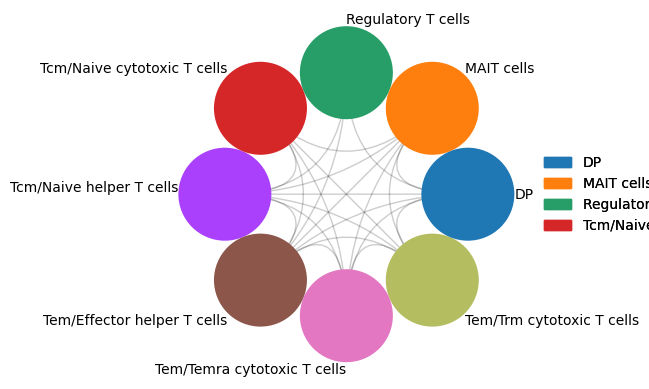

In [45]:
ddl.pl.clone_overlap(
    adatax, groupby="celltypist_annotation", colorby="celltypist_annotation", weighted_overlap=False
)
# something is wrong here... 

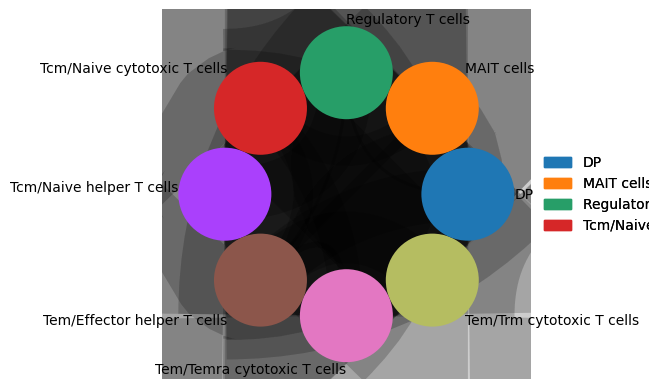

In [46]:
ddl.pl.clone_overlap(
    adatax, groupby="celltypist_annotation", colorby="celltypist_annotation", weighted_overlap=True
)

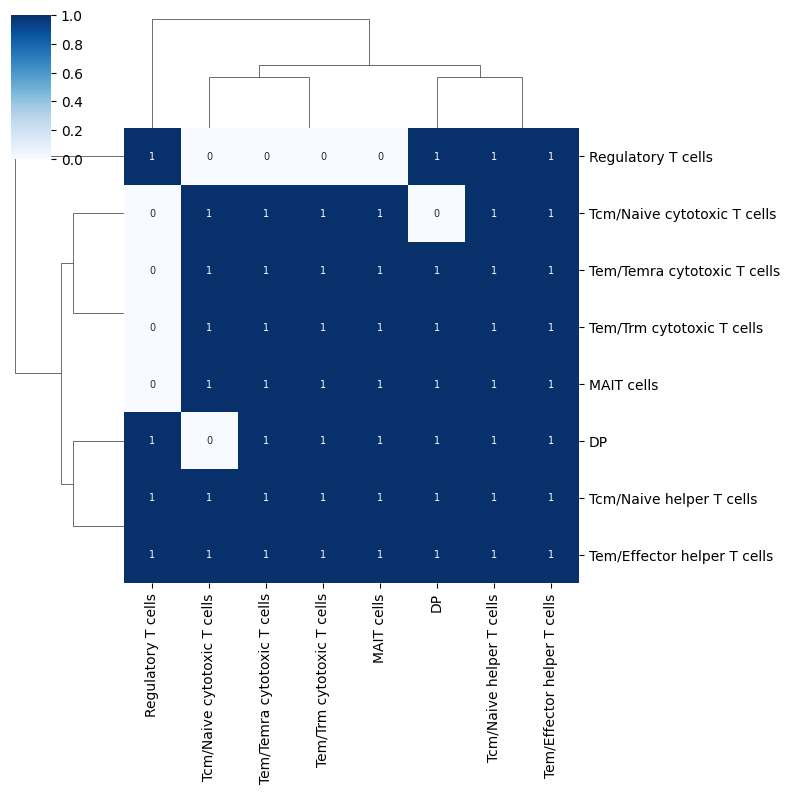

In [47]:
ddl.tl.clone_overlap(
    adatax, groupby="celltypist_annotation", weighted_overlap=False
)


ddl.pl.clone_overlap(
    adatax,
    groupby="celltypist_annotation",
    colorby="celltypist_annotation",
    weighted_overlap=False,
    as_heatmap=True,
    # seaborn clustermap kwargs
    cmap="Blues",
    annot=True,
    figsize=(8, 8),
    annot_kws={"size": 7},
)

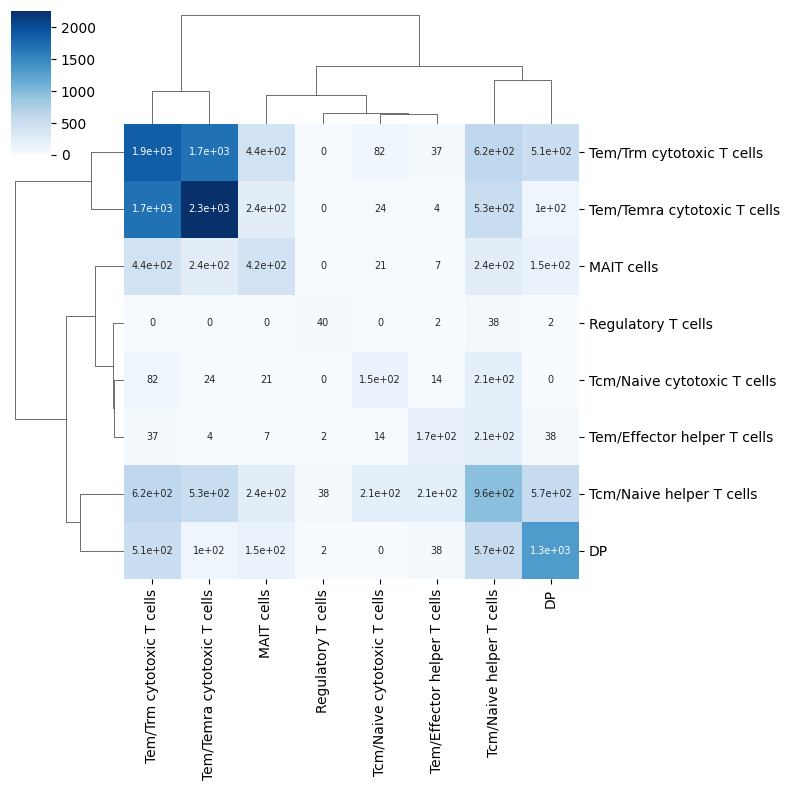

In [48]:
ddl.tl.clone_overlap(
    adatax, groupby="celltypist_annotation", weighted_overlap=True
)


ddl.pl.clone_overlap(
    adatax,
    groupby="celltypist_annotation",
    colorby="celltypist_annotation",
    weighted_overlap=True,
    as_heatmap=True,
    # seaborn clustermap kwargs
    cmap="Blues",
    annot=True,
    figsize=(8, 8),
    annot_kws={"size": 7},
)

In [49]:
adatax.obs['clone_id'].value_counts()

No_contig                23038
abT_266_3_5                194
abT_266_3_5_1261_1_4       156
abT_278_3_4_1722_4_2       118
abT_515_2_43               101
                         ...  
abT_187_6_11_644_5_1         1
abT_187_6_12                 1
abT_187_6_13_1391_2_1        1
abT_187_6_15_830_1_5         1
abT_572_6_1_1010_2_1         1
Name: clone_id, Length: 41491, dtype: int64

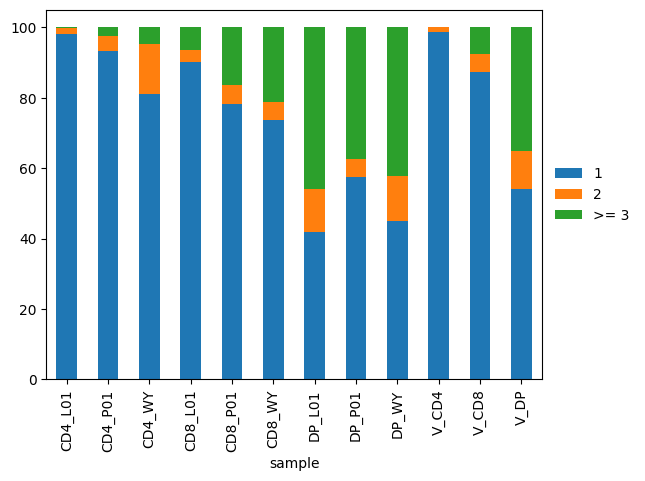

In [50]:
pd.crosstab(
    adatax.obs["sample"],
    adatax.obs["clone_id_size_max_3"],
).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True)
plt.legend(bbox_to_anchor=(1, 0.5), loc="center left", frameon=False)


If most are singletons, where do we get this perfect sharing???

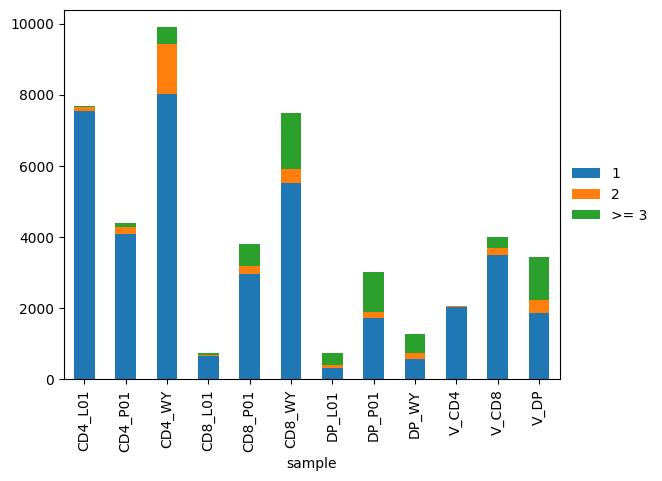

In [51]:
pd.crosstab(
    adatax.obs["sample"],
    adatax.obs["clone_id_size_max_3"],
).plot.bar(stacked=True)
plt.legend(bbox_to_anchor=(1, 0.5), loc="center left", frameon=False)

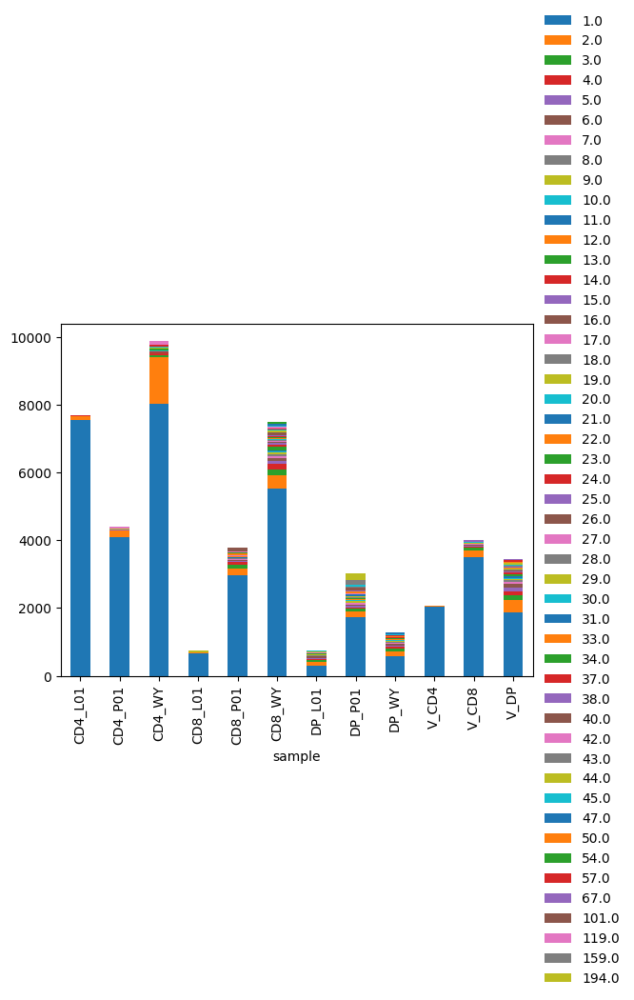

In [52]:
pd.crosstab(
    adatax.obs["sample"],
    adatax.obs["clone_id_size"],
).plot.bar(stacked=True)
plt.legend(bbox_to_anchor=(1, 0.5), loc="center left", frameon=False)

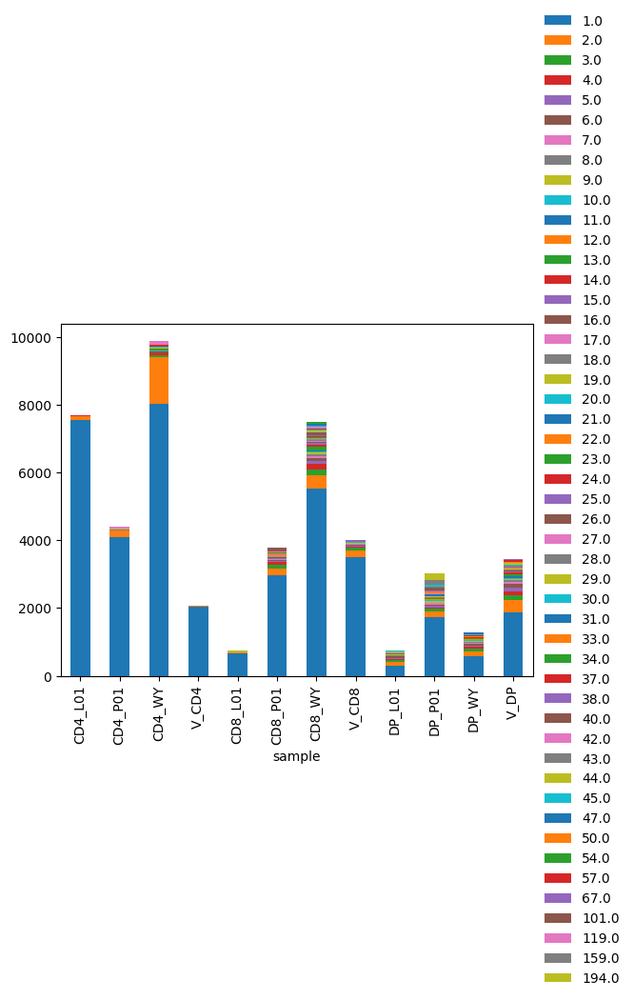

In [53]:
adatax2 = adatax.copy()
adatax2.obs["sample"] = adatax2.obs["sample"].cat.reorder_categories(["CD4_L01", "CD4_P01", "CD4_WY", "V_CD4","CD8_L01", "CD8_P01", "CD8_WY", "V_CD8","DP_L01", "DP_P01", "DP_WY", "V_DP",])
pd.crosstab(
    adatax2.obs["sample"],
    adatax2.obs["clone_id_size"],
).plot.bar(stacked=True)
plt.legend(bbox_to_anchor=(1, 0.5), loc="center left", frameon=False)

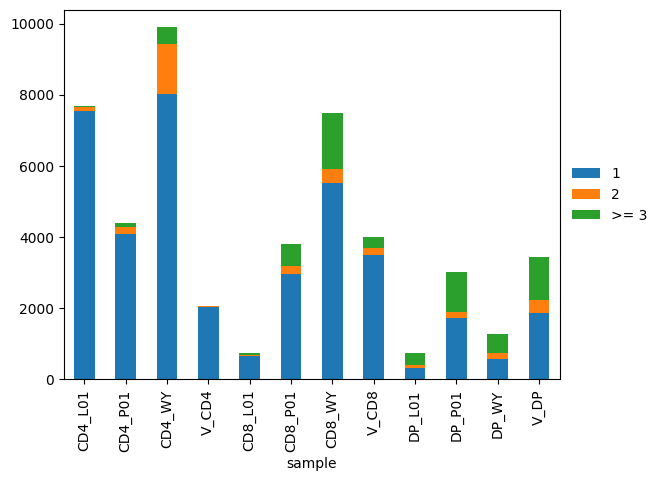

In [54]:
pd.crosstab(
    adatax2.obs["sample"],
    adatax2.obs["clone_id_size_max_3"],
).plot.bar(stacked=True)
plt.legend(bbox_to_anchor=(1, 0.5), loc="center left", frameon=False)

In [55]:
## too much sharing... 
# try to subset by donor and rerun find clone size etc... 

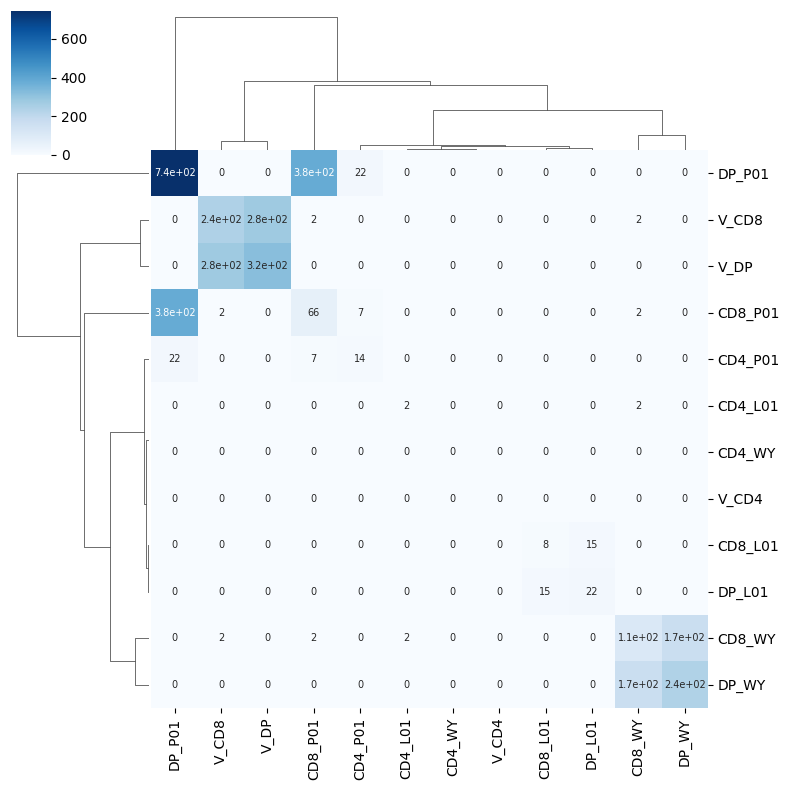

In [56]:
#### Try looking at clonal overlap between samples.. 
# for tl.clone_overlap + pl.clone_overlap, if you use weighted -both need to be weighted!
adatax2.obs["sample"] = adatax2.obs["sample"].cat.reorder_categories(["CD4_L01", "CD4_P01", "CD4_WY", "V_CD4","CD8_L01", "CD8_P01", "CD8_WY", "V_CD8","DP_L01", "DP_P01", "DP_WY", "V_DP",])
ddl.tl.clone_overlap(
    adatax2, groupby="sample", weighted_overlap=True
)

ddl.pl.clone_overlap(
    adatax2,
    groupby="sample",
    #colorby="celltypist_annotation",
    weighted_overlap=True,
    as_heatmap=True,
    # seaborn clustermap kwargs
    cmap="Blues",
    annot=True,
    figsize=(8, 8),
    annot_kws={"size": 7},
)

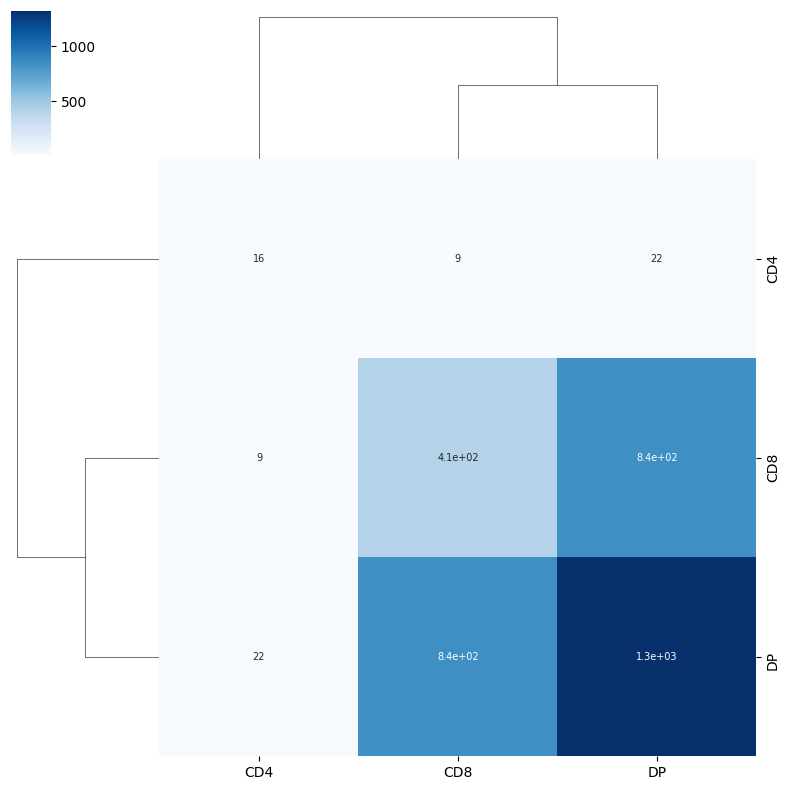

In [57]:
## CELLTYPE 
ddl.tl.clone_overlap(
    adatax2, groupby="sort_type", weighted_overlap=True
)

ddl.pl.clone_overlap(
    adatax2,
    groupby="sort_type",
    #colorby="celltypist_annotation",
    weighted_overlap=True,
    as_heatmap=True,
    # seaborn clustermap kwargs
    cmap="Blues",
    annot=True,
    figsize=(8, 8),
    annot_kws={"size": 7},
)

#### Get L01 to try

In [58]:
adatax_L01 = adatax[adatax.obs['donor'] == "L01"]
adatax_L01.obs


,sample,sort_type,donor,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,scrublet_score,n_genes,gmm_pct_count_clusters_keep,...,d_call_abT_VDJ_main,j_call_abT_VDJ_main,v_call_abT_VJ_main,j_call_abT_VJ_main,locus_status,chain_status,rearrangement_status_VDJ,rearrangement_status_VJ,clone_id_size,clone_id_size_max_3
CD4_L01_AAACCTGAGAGCTATA-1,CD4_L01,CD4,L01,722,1726.0,14.0,0.811124,0.456193,722,True,...,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,NaN,NaN
CD4_L01_AAACCTGAGGAGCGAG-1,CD4_L01,CD4,L01,562,1443.0,15.0,1.039501,0.156962,562,True,...,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,NaN,NaN
CD4_L01_AAACCTGAGGCAGTCA-1,CD4_L01,CD4,L01,507,1141.0,4.0,0.350570,0.216129,507,True,...,None,TRBJ2-1,TRAV38-2/DV8,TRAJ47,TRB + TRA,Single pair,standard,standard,1.0,1
CD4_L01_AAACCTGAGTCAAGCG-1,CD4_L01,CD4,L01,602,1410.0,16.0,1.134752,0.408219,602,True,...,None,TRBJ2-7,TRAV23/DV6,TRAJ15,TRB + TRA,Single pair,standard,standard,1.0,1
CD4_L01_AAACCTGAGTCCTCCT-1,CD4_L01,CD4,L01,433,1064.0,7.0,0.657895,0.188953,433,True,...,None,TRBJ1-2,TRAV9-2,TRAJ35,TRB + TRA,Single pair,standard,standard,1.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
DP_L01_TTTGGTTCATTTCACT-1,DP_L01,DP,L01,211,388.0,5.0,1.288660,0.197674,211,True,...,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,NaN,NaN
DP_L01_TTTGGTTTCAACACGT-1,DP_L01,DP,L01,216,286.0,3.0,1.048951,0.084416,216,True,...,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,NaN,NaN
DP_L01_TTTGTCAAGGAGTCTG-1,DP_L01,DP,L01,259,364.0,5.0,1.373626,0.149606,259,True,...,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,NaN,NaN
DP_L01_TTTGTCATCACGATGT-1,DP_L01,DP,L01,214,317.0,1.0,0.315457,0.167808,214,True,...,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,NaN,NaN


In [59]:
ddl.tl.clone_overlap(
    adatax_L01, groupby="celltypist_annotation", weighted_overlap=True
)


/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/dandelion/tools/_tools.py:1658: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.


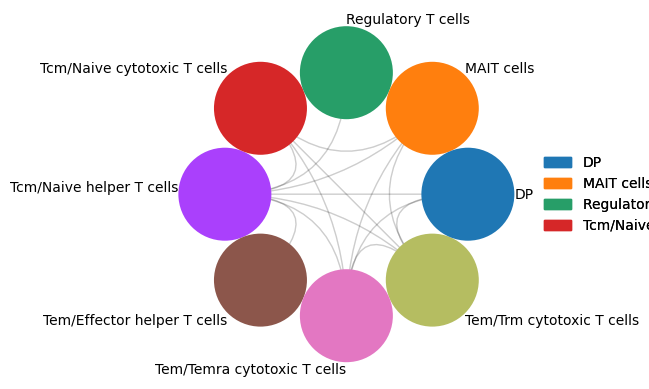

In [67]:
ddl.pl.clone_overlap(
    adatax_L01, groupby="celltypist_annotation", weighted_overlap=False
)

/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/dandelion/tools/_tools.py:1658: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.


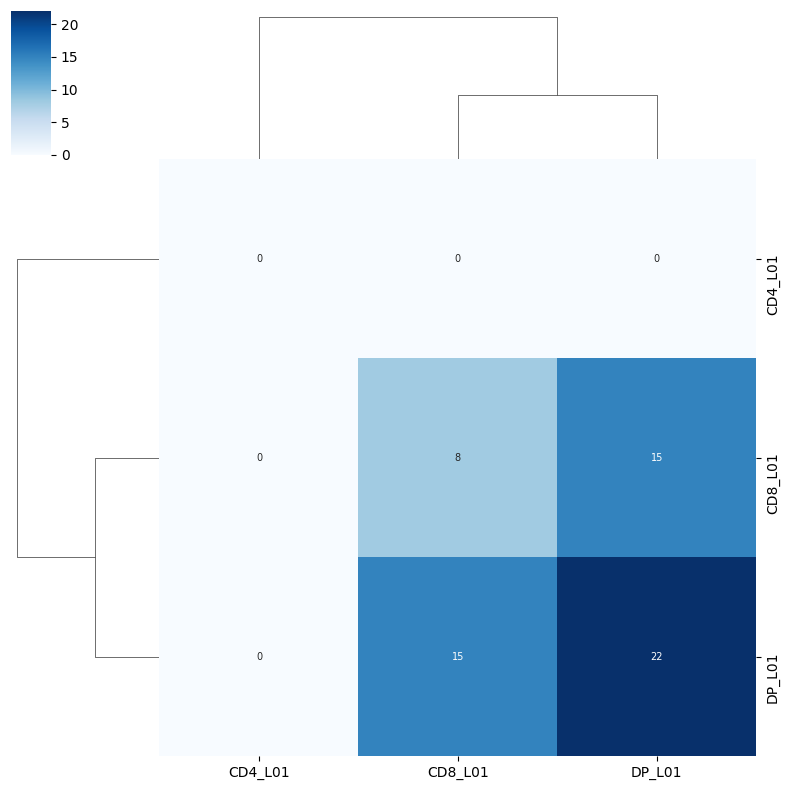

In [59]:
ddl.tl.clone_overlap(
    adatax_L01, groupby="sample", weighted_overlap=True
)
ddl.pl.clone_overlap(
    adatax_L01,
    groupby="sample",
    #colorby="celltypist_annotation",
    weighted_overlap=True,
    as_heatmap=True,
    # seaborn clustermap kwargs
    cmap="Blues",
    annot=True,
    figsize=(8, 8),
    annot_kws={"size": 7},
)

In [60]:
adatax_P01 = adatax[adatax.obs['donor'] == "P01"]
adatax_P01.obs

,sample,sort_type,donor,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,scrublet_score,n_genes,gmm_pct_count_clusters_keep,...,d_call_abT_VDJ_main,j_call_abT_VDJ_main,v_call_abT_VJ_main,j_call_abT_VJ_main,locus_status,chain_status,rearrangement_status_VDJ,rearrangement_status_VJ,clone_id_size,clone_id_size_max_3
CD4_P01_AAACCTGAGAGACTTA-1,CD4_P01,CD4,P01,315,623.0,2.0,0.321027,0.141884,315,True,...,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,NaN,NaN
CD4_P01_AAACCTGAGAGCTGGT-1,CD4_P01,CD4,P01,393,747.0,6.0,0.803213,0.248696,393,True,...,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,NaN,NaN
CD4_P01_AAACCTGAGAGTCTGG-1,CD4_P01,CD4,P01,287,596.0,0.0,0.000000,0.106742,287,True,...,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,NaN,NaN
CD4_P01_AAACCTGAGCCTCGTG-1,CD4_P01,CD4,P01,337,570.0,0.0,0.000000,0.076570,337,True,...,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,NaN,NaN
CD4_P01_AAACCTGAGGGTTCCC-1,CD4_P01,CD4,P01,280,540.0,0.0,0.000000,0.231527,280,True,...,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
DP_P01_TTTGTCAGTCCAACTA-1,DP_P01,DP,P01,474,962.0,12.0,1.247401,0.211679,474,True,...,TRBD1,TRBJ2-1,None,None,Orphan TRB,Orphan VDJ,standard,None,9.0,>= 3
DP_P01_TTTGTCAGTTTGTGTG-1,DP_P01,DP,P01,544,885.0,6.0,0.677966,0.333333,544,True,...,None,TRBJ1-4,None,None,Orphan TRB,Orphan VDJ,standard,None,1.0,1
DP_P01_TTTGTCATCAACGGGA-1,DP_P01,DP,P01,600,1121.0,15.0,1.338091,0.203540,600,True,...,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,NaN,NaN
DP_P01_TTTGTCATCTACGAGT-1,DP_P01,DP,P01,412,710.0,18.0,2.535211,0.058637,412,True,...,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,NaN,NaN


/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/dandelion/tools/_tools.py:1658: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.


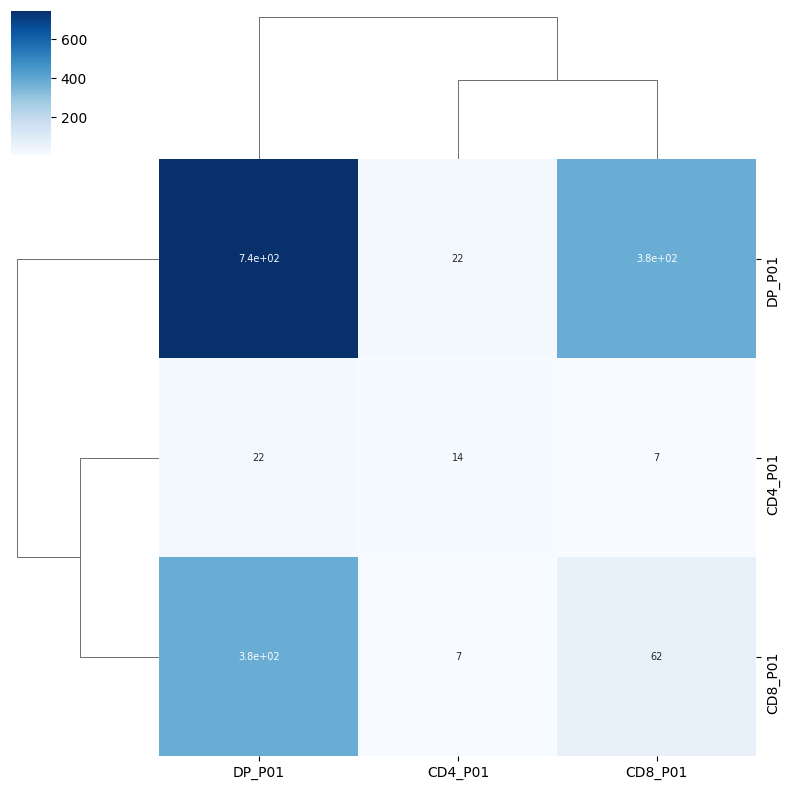

In [61]:
ddl.tl.clone_overlap(
    adatax_P01, groupby="sample", weighted_overlap=True
)
ddl.pl.clone_overlap(
    adatax_P01,
    groupby="sample",
    #colorby="celltypist_annotation",
    weighted_overlap=True,
    as_heatmap=True,
    # seaborn clustermap kwargs
    cmap="Blues",
    annot=True,
    figsize=(8, 8),
    annot_kws={"size": 7},
)

#### What about WY? 

In [62]:
adatax_WY = adatax[adatax.obs['donor'] == "WY"]
adatax_WY.obs

,sample,sort_type,donor,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,scrublet_score,n_genes,gmm_pct_count_clusters_keep,...,d_call_abT_VDJ_main,j_call_abT_VDJ_main,v_call_abT_VJ_main,j_call_abT_VJ_main,locus_status,chain_status,rearrangement_status_VDJ,rearrangement_status_VJ,clone_id_size,clone_id_size_max_3
CD4_WY_AAACCTGAGAATGTTG-1,CD4_WY,CD4,WY,2397,7956.0,108.0,1.357466,0.360190,2397,True,...,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,NaN,NaN
CD4_WY_AAACCTGAGGGTATCG-1,CD4_WY,CD4,WY,946,2320.0,27.0,1.163793,0.158672,946,True,...,None,TRBJ2-1,TRAV21,TRAJ49,TRB + TRA,Single pair,standard,standard,2.0,2
CD4_WY_AAACCTGAGGTGATAT-1,CD4_WY,CD4,WY,1500,3912.0,42.0,1.073620,0.154217,1500,True,...,None,TRBJ2-3,TRAV12-3,TRAJ17,TRB + TRA,Single pair,standard,standard,1.0,1
CD4_WY_AAACCTGAGGTTACCT-1,CD4_WY,CD4,WY,1077,2760.0,47.0,1.702899,0.231527,1077,True,...,None,TRBJ1-2,None,None,Orphan TRB,Orphan VDJ,standard,None,1.0,1
CD4_WY_AAACCTGAGGTTCCTA-1,CD4_WY,CD4,WY,1124,3057.0,27.0,0.883219,0.178523,1124,True,...,None,TRBJ2-6,TRAV29/DV5,TRAJ28,TRB + TRA,Single pair,standard,standard,1.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
DP_WY_TTTGGTTCACGGTTTA-1,DP_WY,DP,WY,469,866.0,5.0,0.577367,0.305785,469,True,...,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,No_contig,NaN,NaN
DP_WY_TTTGGTTGTAGCCTAT-1,DP_WY,DP,WY,522,1075.0,21.0,1.953488,0.197674,522,True,...,None,TRBJ2-4,None,None,Orphan TRB,Orphan VDJ,standard,None,2.0,2
DP_WY_TTTGTCAAGTGGACGT-1,DP_WY,DP,WY,593,1025.0,24.0,2.341463,0.167808,593,True,...,None,TRBJ2-1,None,None,Orphan TRB,Orphan VDJ,standard,None,1.0,1
DP_WY_TTTGTCAGTTACGGAG-1,DP_WY,DP,WY,307,522.0,2.0,0.383142,0.149606,307,True,...,None,TRBJ2-7,TRAV8-6,TRAJ45,TRB + TRA,Single pair,standard,standard,1.0,1


/Users/uqssoon/anaconda3/envs/Jaz2023_env/lib/python3.11/site-packages/dandelion/tools/_tools.py:1658: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.


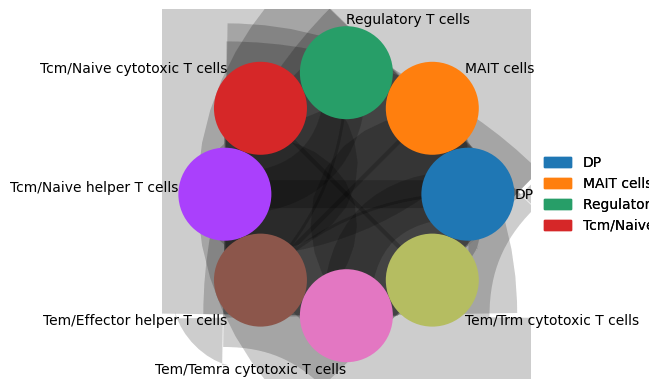

In [63]:
ddl.tl.clone_overlap(
    adatax_WY, groupby="celltypist_annotation", weighted_overlap=True
)
ddl.pl.clone_overlap(
    adatax_WY, groupby="celltypist_annotation", weighted_overlap=True
)

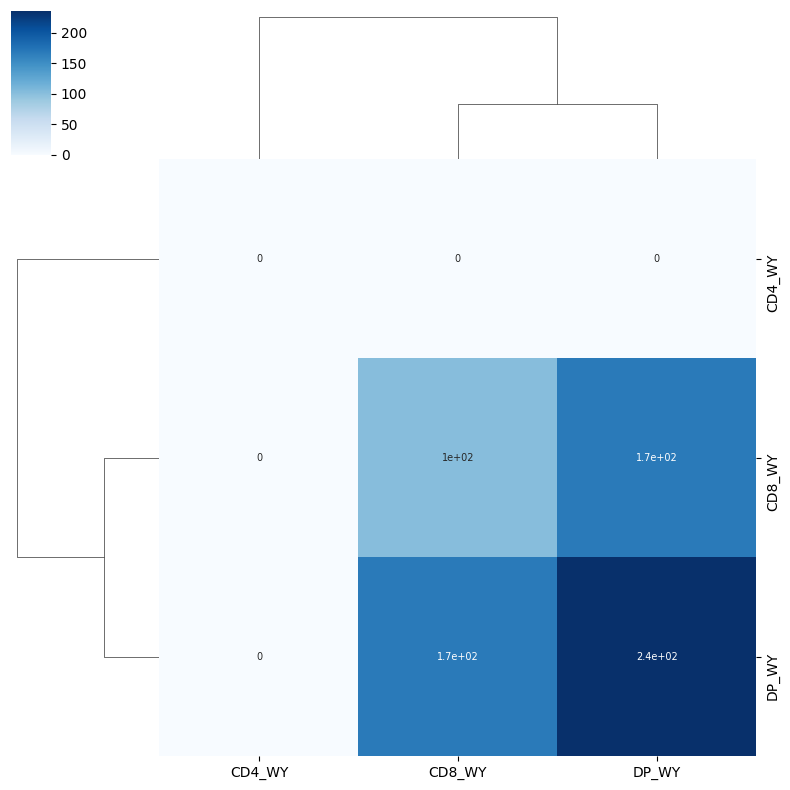

In [64]:
ddl.tl.clone_overlap(
    adatax_WY, groupby="sample", weighted_overlap=True
)
ddl.pl.clone_overlap(
    adatax_WY,
    groupby="sample",
    #colorby="celltypist_annotation",
    weighted_overlap=True,
    as_heatmap=True,
    # seaborn clustermap kwargs
    cmap="Blues",
    annot=True,
    figsize=(8, 8),
    annot_kws={"size": 7},
)

# VDJ PSEUDOBULK

In [65]:
import dandelion as ddl
import pandas as pd
import scanpy as sc
import numpy as np
import warnings
import os

warnings.filterwarnings("ignore")

In [66]:
import milopy.core as milo
import palantir

#required because of Palantir
%matplotlib inline

sc.settings.set_figure_params(dpi=80)

findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Lato'] not found. Falling back to DejaVu Sans.


Prior to performing the pseudobulking, it is recommended to run ddl.tl.setup_vdj_pseudobulk(). This will subset the object to just cells with at least a pair of chains, and prepare appropriately named and formatted columns for the pseudobulking function to use as defaults.

In [67]:
adatax = ddl.tl.setup_vdj_pseudobulk(adatax)

We’re going to be using Milopy to create pseudobulks. Construct a neighbour graph with many neighbours, following Milopy protocol, and then sample representative neighbourhoods from the object. This saves a cell-by-pseudobulk matrix into adata.obsm["nhoods"]. Use this graph to generate a UMAP as well.

In [68]:
adatax

AnnData object with n_obs × n_vars = 25764 × 2285
    obs: 'sample', 'sort_type', 'donor', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'scrublet_score', 'n_genes', 'gmm_pct_count_clusters_keep', 'is_doublet', 'filter_rna', 'batch', 'CD4/CD8_geneset', 'leiden', 'celltypist_majority_voting', 'celltypist_annotation', 'has_contig', 'filter_contig_quality', 'filter_contig_VDJ', 'filter_contig_VJ', 'contig_QC_pass', 'filter_contig', 'clone_id', 'clone_id_by_size', 'locus_VDJ', 'locus_VJ', 'productive_VDJ', 'productive_VJ', 'v_call_VDJ', 'd_call_VDJ', 'j_call_VDJ', 'v_call_VJ', 'j_call_VJ', 'c_call_VDJ', 'c_call_VJ', 'junction_VDJ', 'junction_VJ', 'junction_aa_VDJ', 'junction_aa_VJ', 'v_call_abT_VDJ', 'd_call_abT_VDJ', 'j_call_abT_VDJ', 'v_call_abT_VJ', 'j_call_abT_VJ', 'c_call_abT_VDJ', 'c_call_abT_VJ', 'productive_abT_VDJ', 'productive_abT_VJ', 'duplicate_count_abT_VDJ', 'duplicate_count_abT_VJ', 'v_call_VDJ_main', 'v_call_VJ_main', 'd_call_VDJ_main', 'j_call_VD

In [69]:
sc.pp.neighbors(adatax, use_rep="X_umap", n_neighbors=50)
milo.make_nhoods(adatax)
sc.tl.umap(adatax)

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


Now we are armed with everything we need to construct the VJ feature space. Pseudobulks can be defined either via passing a list of .obs metadata columns, the unique values of the combination of which will serve as individual pseudobulks (via obs_to_bulk), or via an explicit cell-by-pseudobulk matrix (via pbs). Milopy created one of those for us, so we can use that as input.

In [70]:
adatax

AnnData object with n_obs × n_vars = 25764 × 2285
    obs: 'sample', 'sort_type', 'donor', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'scrublet_score', 'n_genes', 'gmm_pct_count_clusters_keep', 'is_doublet', 'filter_rna', 'batch', 'CD4/CD8_geneset', 'leiden', 'celltypist_majority_voting', 'celltypist_annotation', 'has_contig', 'filter_contig_quality', 'filter_contig_VDJ', 'filter_contig_VJ', 'contig_QC_pass', 'filter_contig', 'clone_id', 'clone_id_by_size', 'locus_VDJ', 'locus_VJ', 'productive_VDJ', 'productive_VJ', 'v_call_VDJ', 'd_call_VDJ', 'j_call_VDJ', 'v_call_VJ', 'j_call_VJ', 'c_call_VDJ', 'c_call_VJ', 'junction_VDJ', 'junction_VJ', 'junction_aa_VDJ', 'junction_aa_VJ', 'v_call_abT_VDJ', 'd_call_abT_VDJ', 'j_call_abT_VDJ', 'v_call_abT_VJ', 'j_call_abT_VJ', 'c_call_abT_VDJ', 'c_call_abT_VJ', 'productive_abT_VDJ', 'productive_abT_VJ', 'duplicate_count_abT_VDJ', 'duplicate_count_abT_VJ', 'v_call_VDJ_main', 'v_call_VJ_main', 'd_call_VDJ_main', 'j_call_VD

The cell type annotation lives in .obs["anno_lvl_2_final_clean"]. Let’s tell the function that we want to take the most common value per pseudobulk with us to the new VJ feature space object.

In [71]:
pb_adatax = ddl.tl.vdj_pseudobulk(
    adatax, pbs=adatax.obsm["nhoods"], obs_to_take="celltypist_annotation"
)

The new object has pseudobulks as observations, and the unique encountered VJ genes as the features. We can see the per-pseudobulk annotation, and .obsm["pbs"]. In our case it’s just a copy of the pbs argument, but if we were to go for obs_to_bulk this would be a cells by pseudobulks matrix capturing the assignment of the original cells.

In [72]:
pb_adatax

AnnData object with n_obs × n_vars = 2441 × 157
    obs: 'celltypist_annotation', 'celltypist_annotation_fraction', 'cell_count'
    obsm: 'pbs'

Now that we have our VJ feature space pseudobulk object, we can do things with it. Let’s run a PCA on it. The development trajectory is very nicely captured in the first two PC dimensions.

In [73]:
sc.tl.pca(pb_adatax)


findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: 

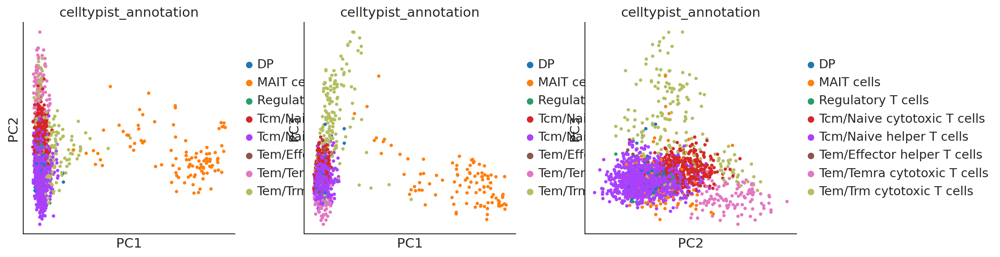

In [74]:
sc.pl.pca(pb_adatax, color="celltypist_annotation", dimensions= [(0,1), (0,2), (1,2)])

findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: 

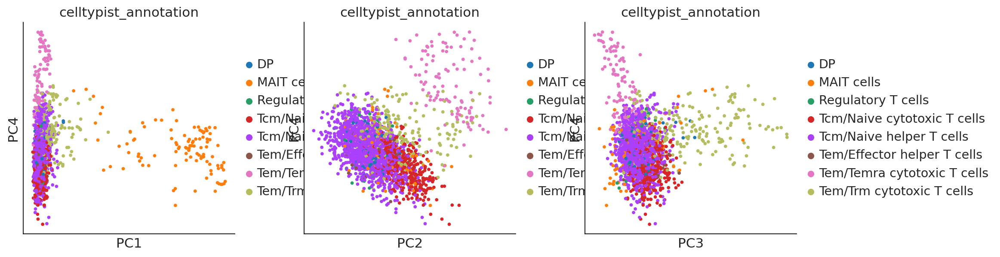

In [75]:
sc.pl.pca(pb_adatax, color="celltypist_annotation", dimensions= [(0,3), (1,3), (2,3)])

Maybe PC2/4?? 

findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: 

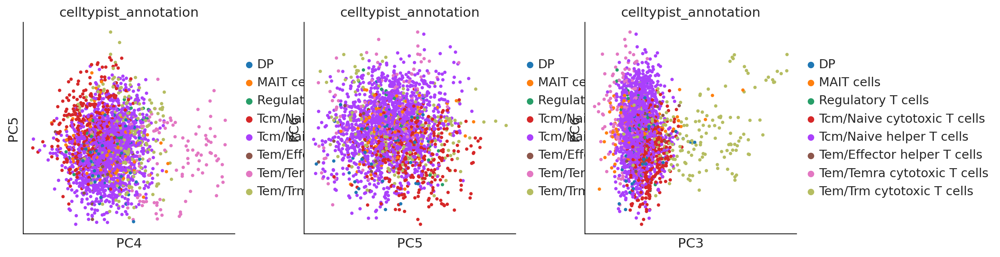

In [76]:
sc.pl.pca(pb_adatax, color="celltypist_annotation", dimensions= [(3,4), (4,5), (2,5)])

Let’s make a UMAP of the pseudobulks.

findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: 

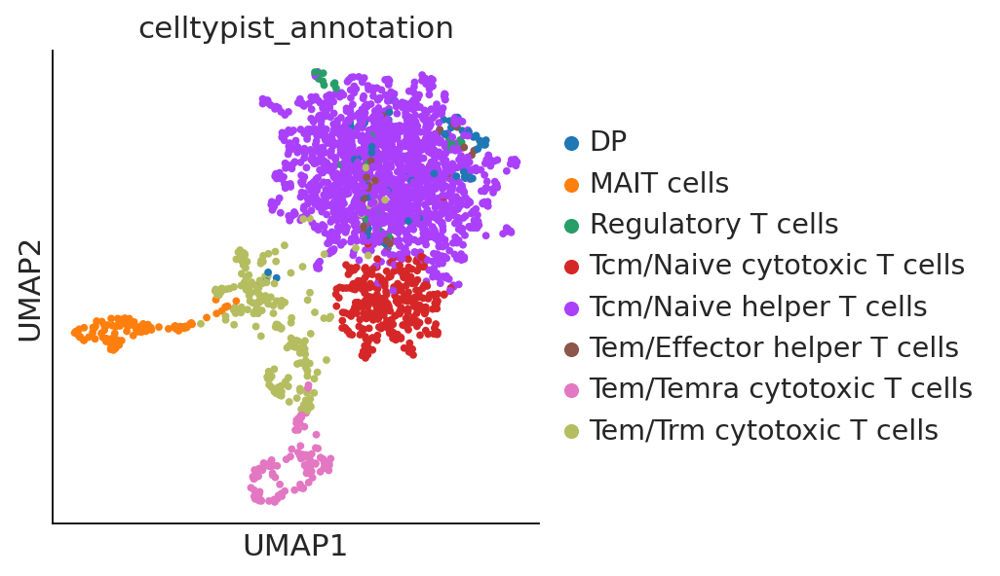

In [77]:
sc.pp.neighbors(pb_adatax)
sc.tl.umap(pb_adatax)
sc.pl.umap(pb_adatax, color="celltypist_annotation")

findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.


findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: 

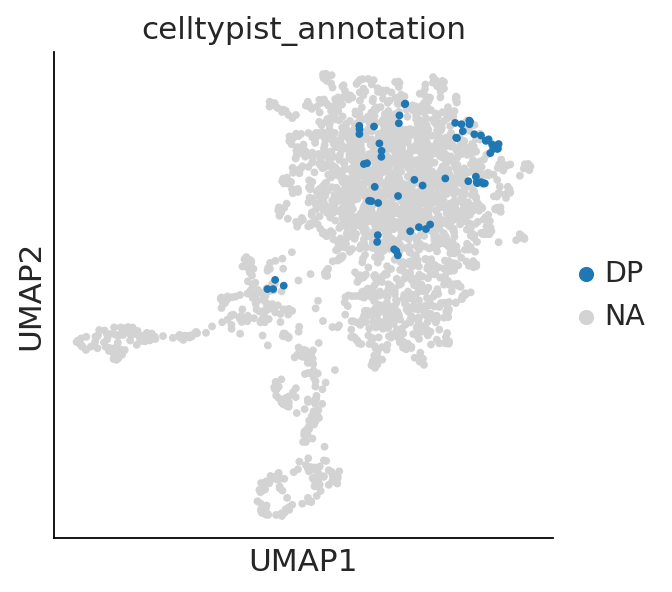

In [78]:
sc.pl.umap(pb_adatax, color="celltypist_annotation", groups = ['DP'])

findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.


findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.


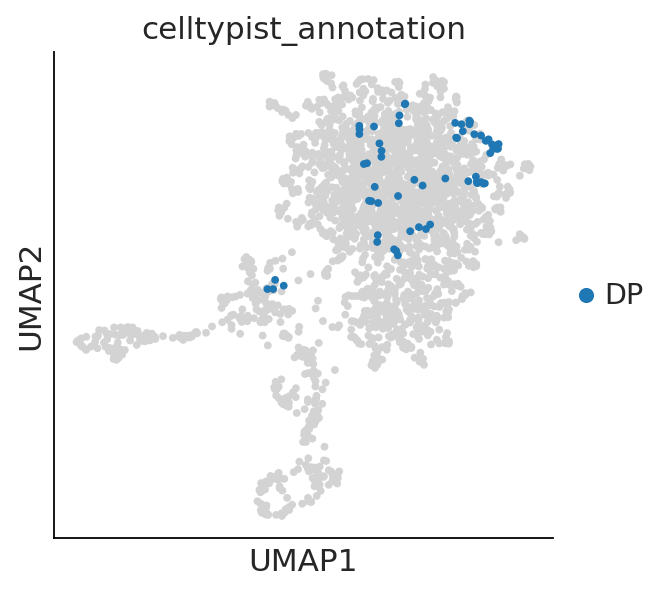

In [79]:
sc.pl.umap(pb_adatax, color="celltypist_annotation", groups = ['DP'], na_in_legend= False)

# tl.vj_usage_pca

You can also compute the V/J gene usage in your various groups of interest. This function will return a new AnnData where instead of cells (obs) by gene (var), it will be groupby (obs) by V/J genes (var).

For example, I’m interested if the leiden clusters within each donor’s sample use V/J genes differently:

In [80]:
# first make a concatenated group
adatax.obs["donor_annotation"] = [
    s + "_" + l for s, l in zip(adatax.obs["donor"], adatax.obs["celltypist_annotation"])
]
new_adatax = ddl.tl.vj_usage_pca(
    adatax,
    groupby="donor_annotation",
    mode="abT",  # because B=B cells, use abT and gdT for alpha-beta and gamma-delta T cells respectively
    transfer_mapping=[
        "donor",
        "celltypist_annotation",
    ],  # this transfers the sample_id and leiden values separately. if not provided, only sample_id_leiden is transferred.
    n_comps=10,  # 3 because the example is small here. the default is set at 30
)
new_adatax


AnnData object with n_obs × n_vars = 32 × 157
    obs: 'cell_type', 'cell_count', 'donor', 'celltypist_annotation'
    uns: 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: 

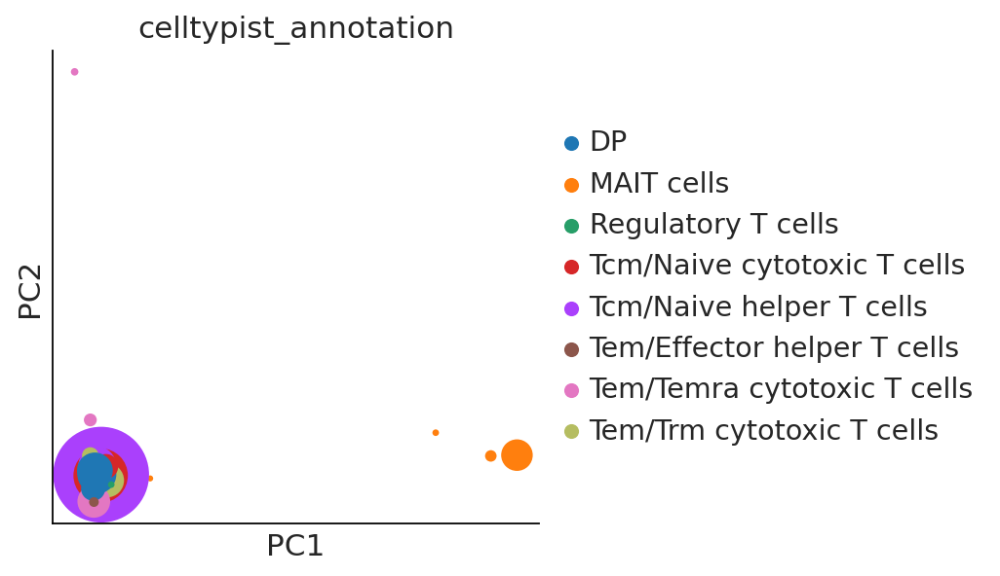

In [81]:
sc.set_figure_params()

sc.pl.pca(new_adatax, color="celltypist_annotation", size=new_adatax.obs["cell_count"])
# each dot is a `sample_id_leiden`. Check the .obs

findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: 

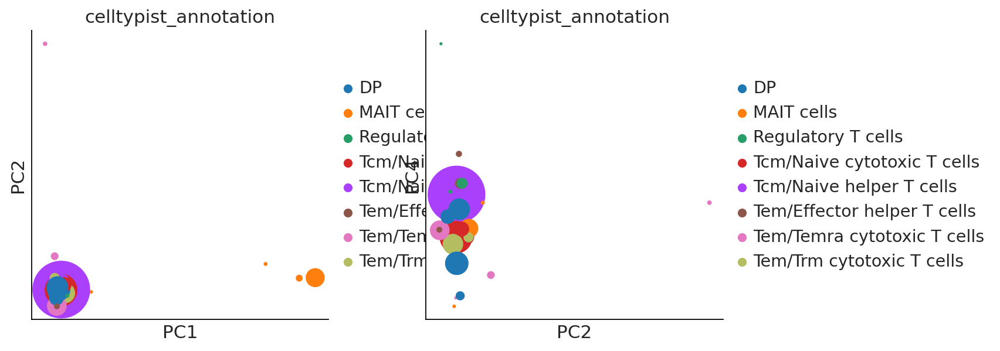

In [82]:
sc.pl.pca(new_adatax, color="celltypist_annotation", size=new_adatax.obs["cell_count"], dimensions= [(0,1), (1,3)])

# Redoing in just single-chains

Jaz mentions that the double-sort may cause membrane-shaering hence having extra TCRs attaching to cells when they are not meant to. Also, dandelion doesn't automatically filters for cells with ab single-cgains only. They compute things with b-only as well. So try to br stringent. 

In [83]:
adatax.obs['chain_status']

CD4_L01_AAACCTGAGGCAGTCA-1    Single pair
CD4_L01_AAACCTGAGTCAAGCG-1    Single pair
CD4_L01_AAACCTGAGTCCTCCT-1    Single pair
CD4_L01_AAACCTGCACAAGTAA-1    Single pair
CD4_L01_AAACCTGCAGACTCGC-1    Single pair
                                 ...     
V_DP_TTTCCTCAGCTGAACG-1       Single pair
V_DP_TTTCCTCGTATGAAAC-1       Single pair
V_DP_TTTGCGCAGTGACATA-1        Extra pair
V_DP_TTTGGTTTCCCATTTA-1       Single pair
V_DP_TTTGGTTTCTTGTCAT-1       Single pair
Name: chain_status, Length: 25764, dtype: category
Categories (2, object): ['Extra pair', 'Single pair']

In [84]:
#adatax_single = adatax[adatax.obs['clone_id'] != 'No_contig']
adatax_single = adatax[adatax.obs['chain_status'] == 'Single pair']

In [85]:
adatax_single.obs['chain_status']

CD4_L01_AAACCTGAGGCAGTCA-1    Single pair
CD4_L01_AAACCTGAGTCAAGCG-1    Single pair
CD4_L01_AAACCTGAGTCCTCCT-1    Single pair
CD4_L01_AAACCTGCACAAGTAA-1    Single pair
CD4_L01_AAACCTGCAGACTCGC-1    Single pair
                                 ...     
V_DP_TTTATGCGTCAGAAGC-1       Single pair
V_DP_TTTCCTCAGCTGAACG-1       Single pair
V_DP_TTTCCTCGTATGAAAC-1       Single pair
V_DP_TTTGGTTTCCCATTTA-1       Single pair
V_DP_TTTGGTTTCTTGTCAT-1       Single pair
Name: chain_status, Length: 24076, dtype: category
Categories (1, object): ['Single pair']

findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.


findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: 

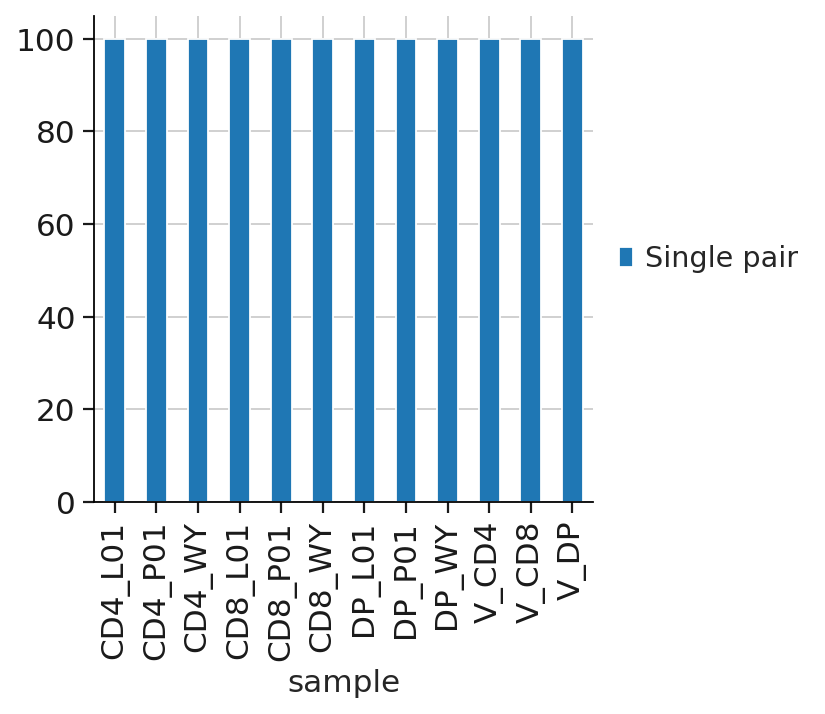

In [86]:
pd.crosstab(
    adatax_single.obs["sample"],
    adatax_single.obs["chain_status"],
).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True)
plt.legend(bbox_to_anchor=(1, 0.5), loc="center left", frameon=False)

findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: 

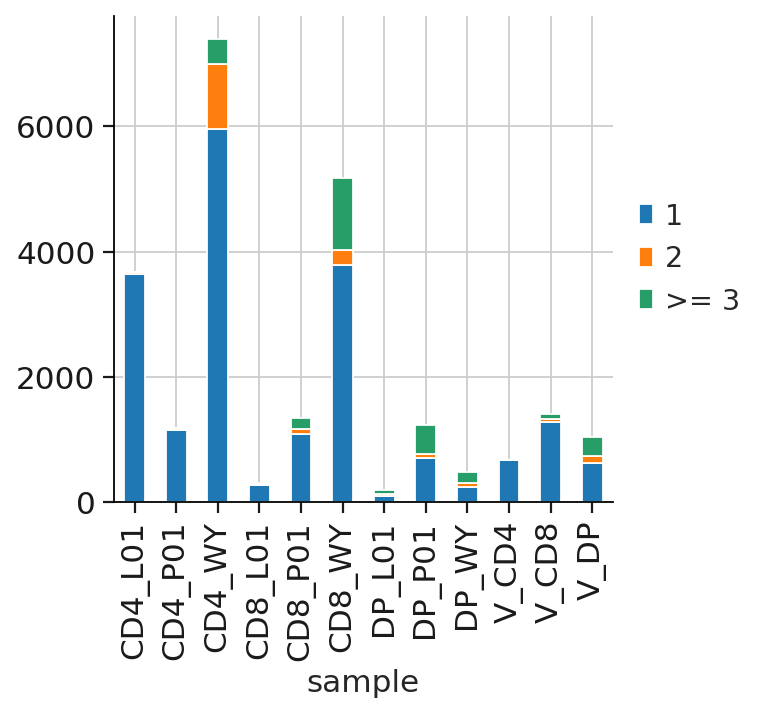

In [87]:
pd.crosstab(
    adatax_single.obs["sample"],
    adatax_single.obs["clone_id_size_max_3"],
).plot.bar(stacked=True)
plt.legend(bbox_to_anchor=(1, 0.5), loc="center left", frameon=False)

findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: 

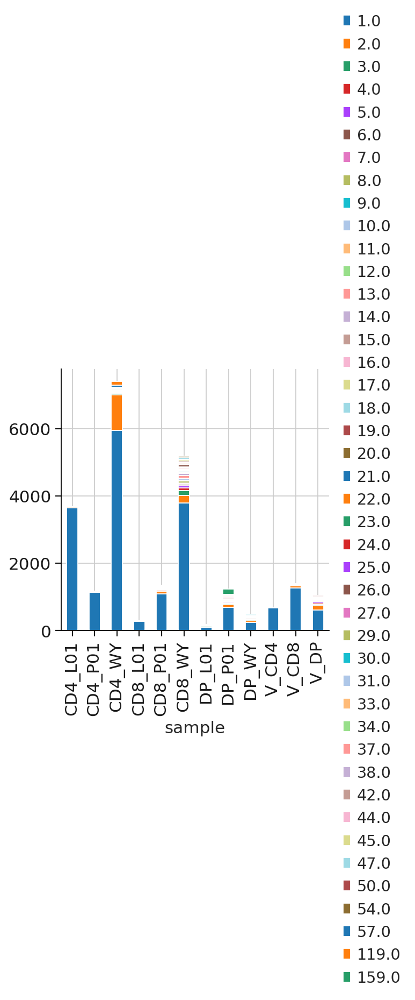

In [88]:
pd.crosstab(
    adatax_single.obs["sample"],
    adatax_single.obs["clone_id_size"],
).plot.bar(stacked=True)
plt.legend(bbox_to_anchor=(1, 0.5), loc="center left", frameon=False)

findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: 

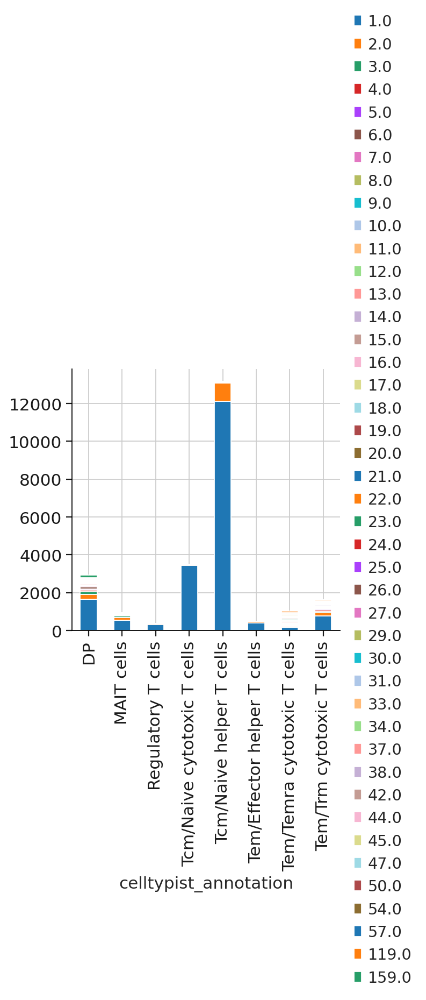

In [89]:
pd.crosstab(
    adatax_single.obs["celltypist_annotation"],
    adatax_single.obs["clone_id_size"],
).plot.bar(stacked=True)
plt.legend(bbox_to_anchor=(1, 0.5), loc="center left", frameon=False)

In [90]:
plt.savefig('DPT_TCR_cloneidvalues_annotation_241023.png')

<Figure size 320x320 with 0 Axes>

findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: 

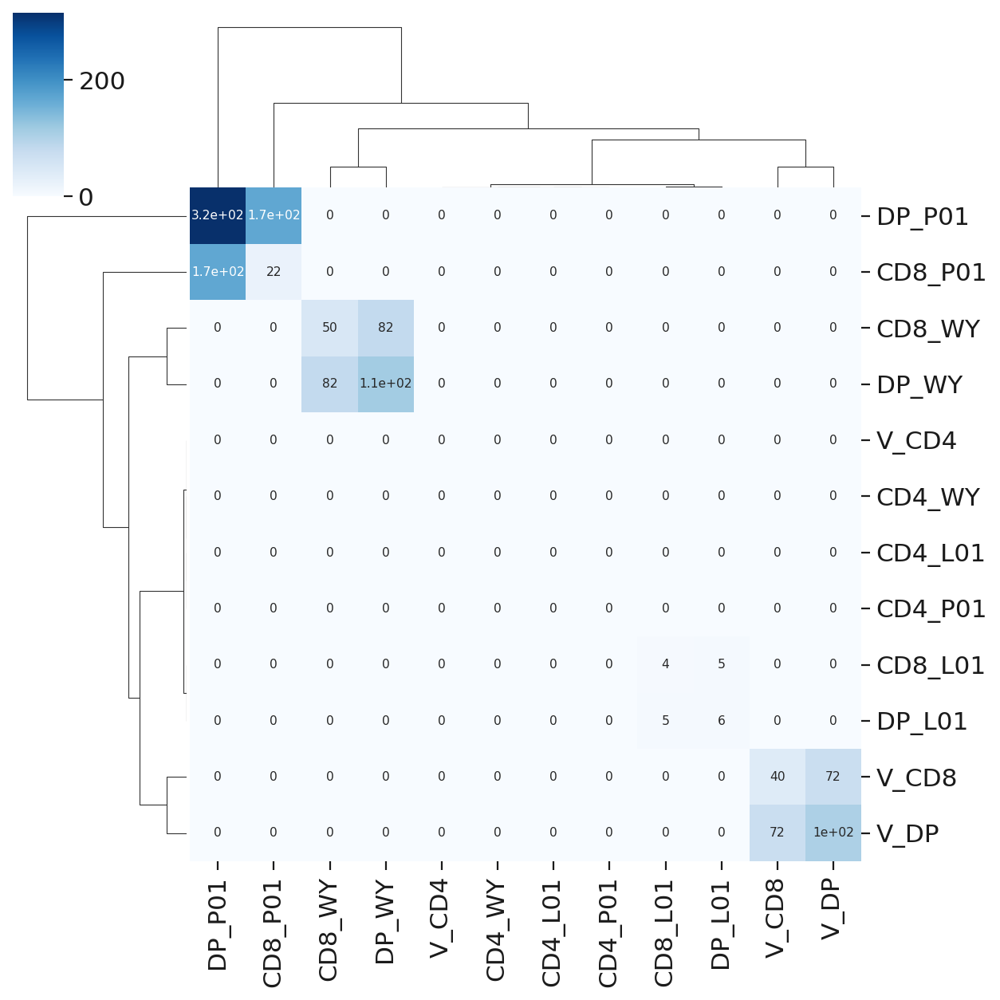

In [91]:
adatax_single.obs["sample"] = adatax2.obs["sample"].cat.reorder_categories(["CD4_L01", "CD4_P01", "CD4_WY", "V_CD4","CD8_L01", "CD8_P01", "CD8_WY", "V_CD8","DP_L01", "DP_P01", "DP_WY", "V_DP",])
ddl.tl.clone_overlap(
    adatax_single, groupby="sample", weighted_overlap=True
)

ddl.pl.clone_overlap(
    adatax_single,
    groupby="sample",
    #colorby="celltypist_annotation",
    weighted_overlap=True,
    as_heatmap=True,
    # seaborn clustermap kwargs
    cmap="Blues",
    annot=True,
    figsize=(8, 8),
    annot_kws={"size": 7},
)

findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: 

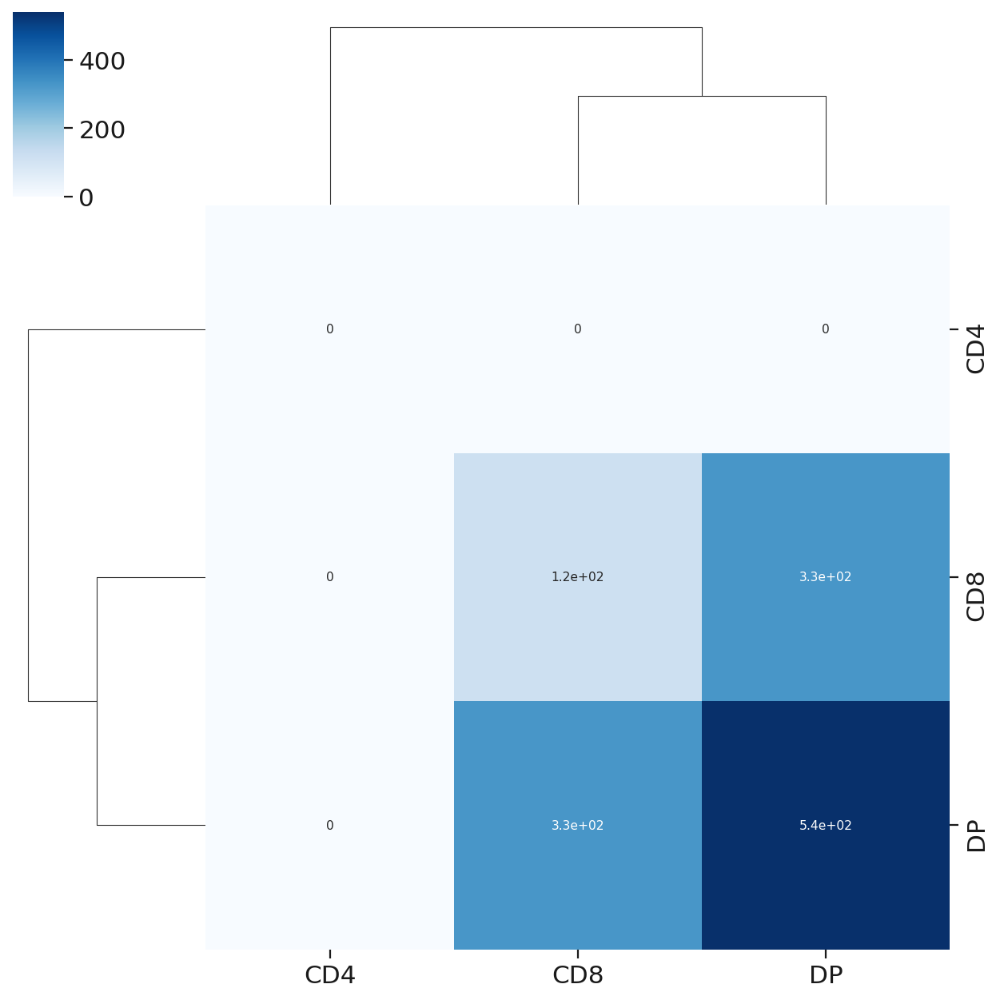

In [92]:
## CELLTYPE 
ddl.tl.clone_overlap(
    adatax_single, groupby="sort_type", weighted_overlap=True
)

ddl.pl.clone_overlap(
    adatax_single,
    groupby="sort_type",
    #colorby="celltypist_annotation",
    weighted_overlap=True,
    as_heatmap=True,
    # seaborn clustermap kwargs
    cmap="Blues",
    annot=True,
    figsize=(8, 8),
    annot_kws={"size": 7},
)

findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: 

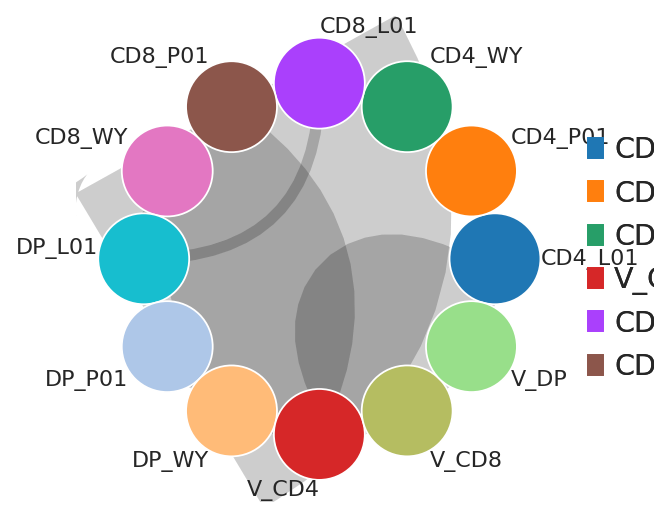

In [93]:
ddl.tl.clone_overlap(
    adatax_single, groupby="sample", weighted_overlap=True
)

ddl.pl.clone_overlap(
    adatax_single, groupby="sample", colorby="sample", weighted_overlap=True
)

findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: 

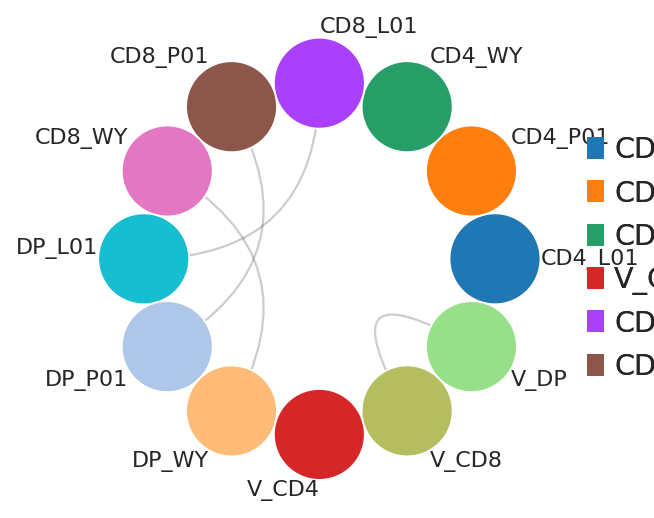

In [94]:
ddl.tl.clone_overlap(
    adatax_single, groupby="sample", weighted_overlap=True
)

ddl.pl.clone_overlap(
    adatax_single, groupby="sample", colorby="sample", weighted_overlap=False
)

findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: 

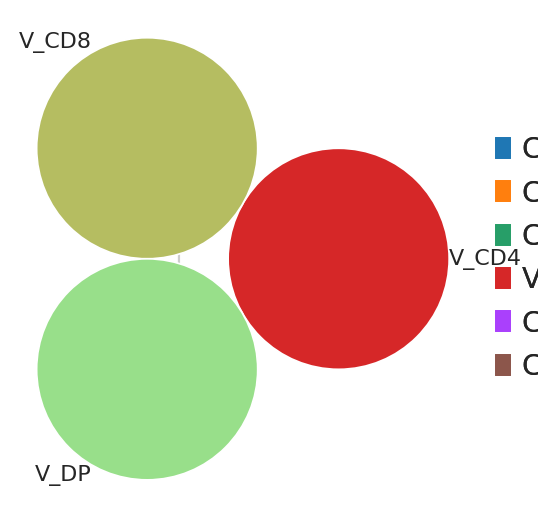

In [95]:
ddl.tl.clone_overlap(
    adatax_single, groupby="sort_type", weighted_overlap=True
)

ddl.pl.clone_overlap(
    adatax_single, groupby="sort_type", colorby="sample", weighted_overlap=False
)

findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: 

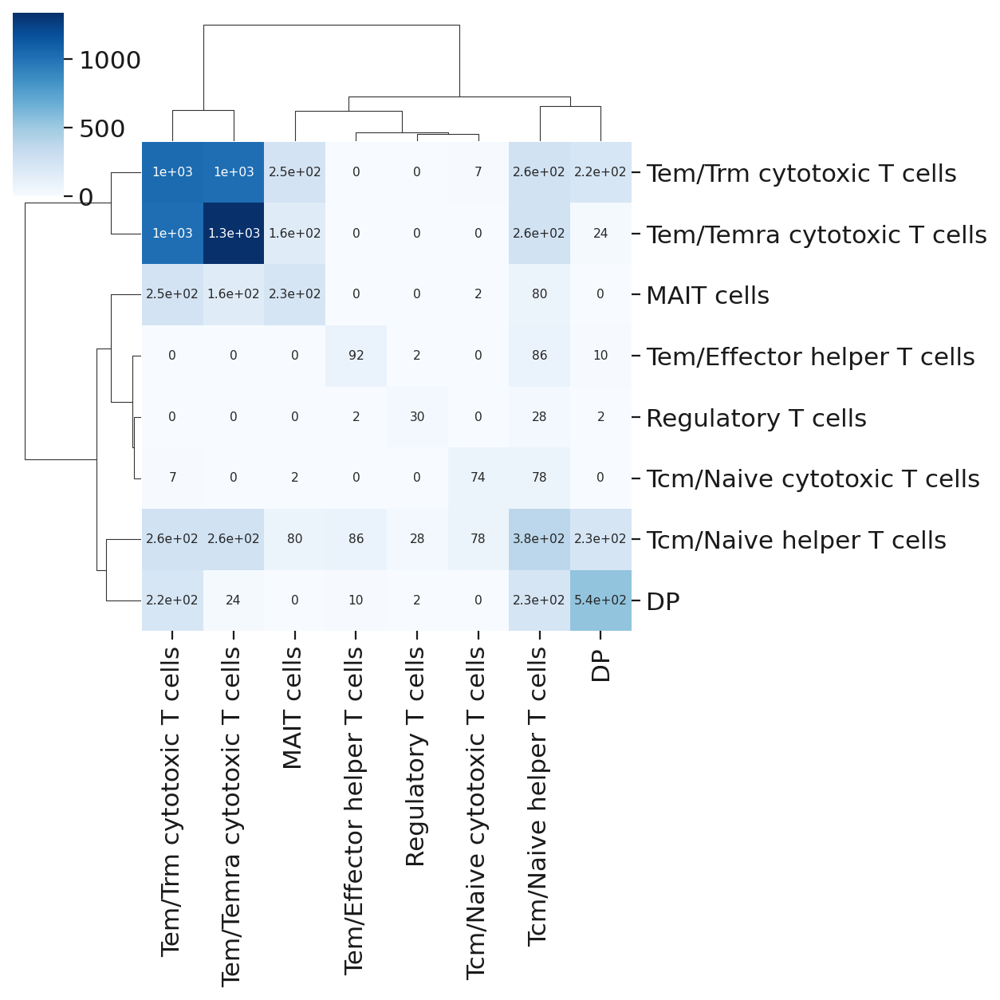

In [96]:
ddl.tl.clone_overlap(
    adatax_single, groupby="celltypist_annotation", weighted_overlap=True
)

ddl.pl.clone_overlap(
    adatax_single,
    groupby="celltypist_annotation",
    #colorby="celltypist_annotation",
    weighted_overlap=True,
    as_heatmap=True,
    # seaborn clustermap kwargs
    cmap="Blues",
    annot=True,
    figsize=(8, 8),
    annot_kws={"size": 7},
)

findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: 

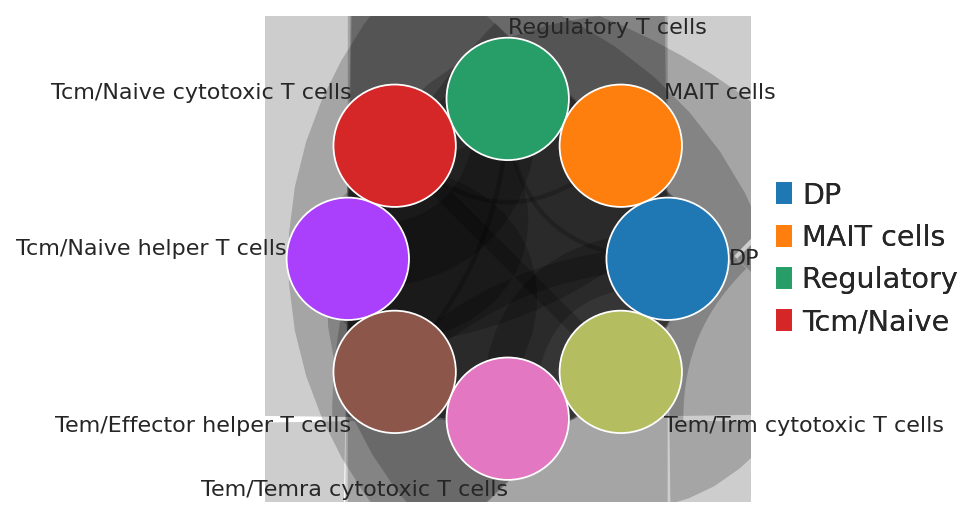

In [97]:
ddl.tl.clone_overlap(
    adatax_single, groupby="celltypist_annotation", weighted_overlap=True
)

ddl.pl.clone_overlap(
    adatax_single, groupby="celltypist_annotation", colorby="celltypist_annotation", weighted_overlap=True
)

findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: 

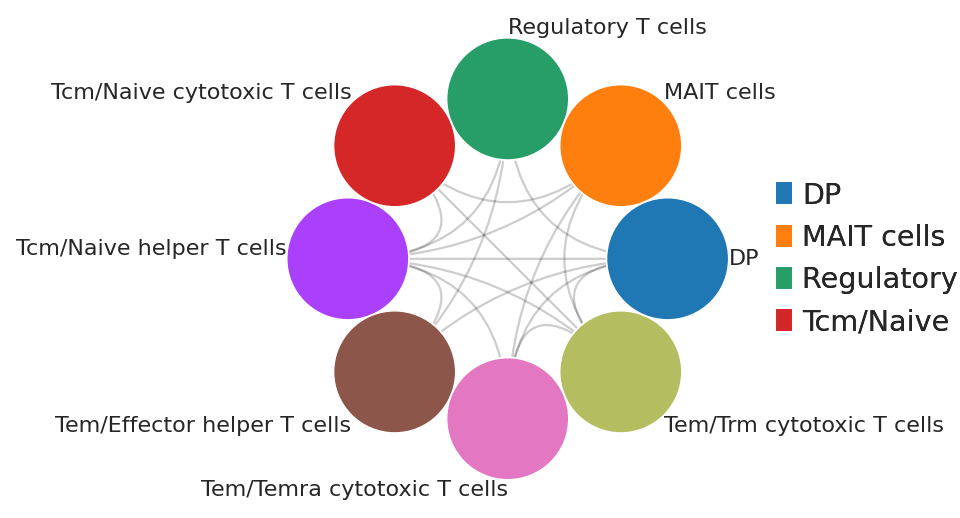

In [98]:
ddl.tl.clone_overlap(
    adatax_single, groupby="celltypist_annotation", weighted_overlap=False
)

ddl.pl.clone_overlap(
    adatax_single, groupby="celltypist_annotation", colorby="celltypist_annotation", weighted_overlap=False
)

In [99]:
adatax_single = ddl.tl.setup_vdj_pseudobulk(adatax_single)

In [100]:
sc.pp.neighbors(adatax_single, use_rep="X_umap", n_neighbors=50)
milo.make_nhoods(adatax_single)
sc.tl.umap(adatax_single)

In [101]:
adatax_single

AnnData object with n_obs × n_vars = 24076 × 2285
    obs: 'sample', 'sort_type', 'donor', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'scrublet_score', 'n_genes', 'gmm_pct_count_clusters_keep', 'is_doublet', 'filter_rna', 'batch', 'CD4/CD8_geneset', 'leiden', 'celltypist_majority_voting', 'celltypist_annotation', 'has_contig', 'filter_contig_quality', 'filter_contig_VDJ', 'filter_contig_VJ', 'contig_QC_pass', 'filter_contig', 'clone_id', 'clone_id_by_size', 'locus_VDJ', 'locus_VJ', 'productive_VDJ', 'productive_VJ', 'v_call_VDJ', 'd_call_VDJ', 'j_call_VDJ', 'v_call_VJ', 'j_call_VJ', 'c_call_VDJ', 'c_call_VJ', 'junction_VDJ', 'junction_VJ', 'junction_aa_VDJ', 'junction_aa_VJ', 'v_call_abT_VDJ', 'd_call_abT_VDJ', 'j_call_abT_VDJ', 'v_call_abT_VJ', 'j_call_abT_VJ', 'c_call_abT_VDJ', 'c_call_abT_VJ', 'productive_abT_VDJ', 'productive_abT_VJ', 'duplicate_count_abT_VDJ', 'duplicate_count_abT_VJ', 'v_call_VDJ_main', 'v_call_VJ_main', 'd_call_VDJ_main', 'j_call_VD

In [102]:
pb_adatax_single = ddl.tl.vdj_pseudobulk(
    adatax_single, pbs=adatax_single.obsm["nhoods"], obs_to_take="celltypist_annotation"
)

In [103]:
sc.tl.pca(pb_adatax_single)

findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: 

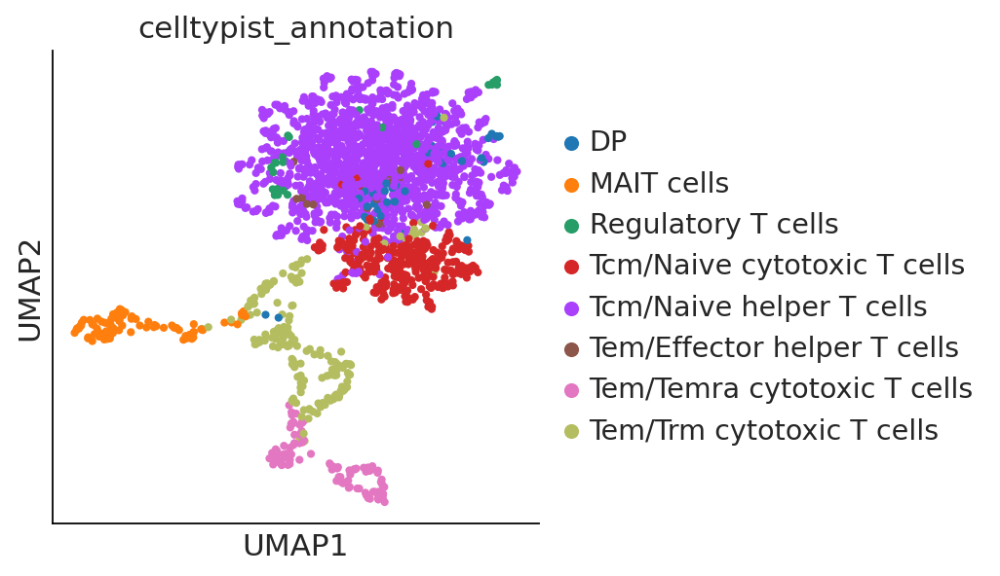

In [104]:
sc.pp.neighbors(pb_adatax_single)
sc.tl.umap(pb_adatax_single)
sc.pl.umap(pb_adatax_single, color="celltypist_annotation")

findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: 

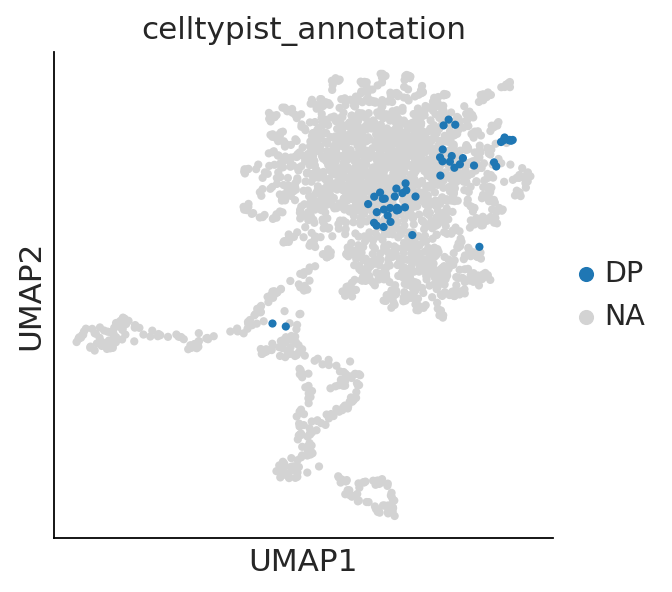

In [105]:
sc.pl.umap(pb_adatax_single, color="celltypist_annotation", groups = ['DP'])

### what is the fraction of shared vs non-shared as a percentage of all DP T cells in each sample separately

In [106]:
def calculate_fraction_of_sharedness(adata, donor_name, groupby = "sort_type"):
    adata = adata[adata.obs['donor'] == donor_name]
    ddl.tl.clone_overlap(
        adata, groupby=groupby, weighted_overlap=False
    )
    print("# of clones between DP and CD4")
    print((adata.uns['clone_overlap'][['CD4', 'DP']].apply(sum, axis = 1) > 1).value_counts())
    print("# of clones between DP and CD8")
    print((adata.uns['clone_overlap'][['CD8', 'DP']].apply(sum, axis = 1) > 1).value_counts())
    print("# of DP clones")
    print((adata.uns['clone_overlap'][['DP']] > 0).value_counts())
    

In [107]:
adatax_single_L01 = adatax_single[adatax_single.obs['donor'] == "L01"]
adatax_single_L01.obs

,sample,sort_type,donor,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,scrublet_score,n_genes,gmm_pct_count_clusters_keep,...,locus_status,chain_status,rearrangement_status_VDJ,rearrangement_status_VJ,clone_id_size,clone_id_size_max_3,nhood_ixs_random,nhood_ixs_refined,nhood_kth_distance,donor_annotation
CD4_L01_AAACCTGAGGCAGTCA-1,CD4_L01,CD4,L01,507,1141.0,4.0,0.350570,0.216129,507,True,...,TRB + TRA,Single pair,standard,standard,1.0,1,0,0,0.0,L01_Regulatory T cells
CD4_L01_AAACCTGAGTCAAGCG-1,CD4_L01,CD4,L01,602,1410.0,16.0,1.134752,0.408219,602,True,...,TRB + TRA,Single pair,standard,standard,1.0,1,0,0,0.0,L01_Tcm/Naive helper T cells
CD4_L01_AAACCTGAGTCCTCCT-1,CD4_L01,CD4,L01,433,1064.0,7.0,0.657895,0.188953,433,True,...,TRB + TRA,Single pair,standard,standard,1.0,1,0,0,0.0,L01_Tcm/Naive helper T cells
CD4_L01_AAACCTGCACAAGTAA-1,CD4_L01,CD4,L01,726,2008.0,6.0,0.298805,0.201835,726,True,...,TRB + TRA,Single pair,standard,standard,1.0,1,0,0,0.0,L01_Tcm/Naive helper T cells
CD4_L01_AAACCTGCAGACTCGC-1,CD4_L01,CD4,L01,565,1598.0,1.0,0.062578,0.139860,565,True,...,TRB + TRA,Single pair,standard,standard,1.0,1,0,0,0.0,L01_Tcm/Naive helper T cells
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
DP_L01_TTGACTTCAAGCCCAC-1,DP_L01,DP,L01,211,253.0,5.0,1.976285,0.181818,211,True,...,TRB + TRA,Single pair,standard,standard,15.0,>= 3,1,0,0.0,L01_DP
DP_L01_TTGGCAAGTAAGCACG-1,DP_L01,DP,L01,1545,4185.0,1.0,0.023895,0.084416,1545,True,...,TRB + TRA,Single pair,standard,standard,4.0,>= 3,0,0,0.0,L01_DP
DP_L01_TTTCCTCGTTGGTAAA-1,DP_L01,DP,L01,854,1591.0,3.0,0.188561,0.105590,854,True,...,TRB + TRA,Single pair,standard,standard,3.0,>= 3,0,0,0.0,L01_DP
DP_L01_TTTGCGCAGGGTTTCT-1,DP_L01,DP,L01,350,657.0,1.0,0.152207,0.197674,350,True,...,TRB + TRA,Single pair,standard,standard,1.0,1,0,0,0.0,L01_DP


Use weighted overlap = False because we just want to know the abso;ute numbers of how many clones are shared. So we want a 1/0 matrix. The weighted overlap = True will weight overlaps based on frequency and is not appropriate, when we simply want a True/False answer. 

In [108]:
ddl.tl.clone_overlap(
    adatax_single_L01, groupby="sort_type", weighted_overlap=False
)

In [109]:
import numpy as np

This will give what is the max value of each row in this matrix - and it is 1, which is what we want as we used weighted overlap = False to give 1/0 answers.

In [110]:
np.max(adatax_single_L01.uns['clone_overlap'])

CD4    1
CD8    1
DP     1
dtype: int64

This will calculate how many clones are shared by CD4 and DPs, which will be >1 when summed together. 

In [111]:
(adatax_single_L01.uns['clone_overlap'][['CD4', 'DP']].apply(sum, axis = 1) > 1).value_counts()

False    4071
dtype: int64

In [112]:
(adatax_single_L01.uns['clone_overlap'][['CD8', 'DP']].apply(sum, axis = 1) > 1).value_counts()

False    4069
True        2
dtype: int64

This will calculate how many clones are there for DPs (not just shared but all clones present)

In [113]:
(adatax_single_L01.uns['clone_overlap'][['DP']] > 0).value_counts()

DP   
False    3945
True      126
dtype: int64

In [114]:
2/126 * 100
# So there are really only 2 clones present which are shared between DPs and CD8s of L01, and it is 1.5% of all the clones present in DPs, which is a really small proportion. 

1.5873015873015872

Use the function I defined at the top to apply this to all other donors. 

In [115]:
calculate_fraction_of_sharedness(adatax_single, donor_name="WY")

# of clones between DP and CD4
False    10901
dtype: int64
# of clones between DP and CD8
False    10889
True        12
dtype: int64
# of DP clones
DP   
False    10593
True       308
dtype: int64


In [116]:
12/308*100
# There are only 12 clones shared between DPs and CD8s, which is only 3.9% of all clones present in DPs for WY 

3.896103896103896

In [117]:
calculate_fraction_of_sharedness(adatax_single, donor_name="P01")

# of clones between DP and CD4
False    3093
dtype: int64
# of clones between DP and CD8
False    3089
True        4
dtype: int64
# of DP clones
DP   
False    2313
True      780
dtype: int64


In [118]:
4/780*100
# Only 4 clones shared between CD8s and DPs in P01, which is only 0.5% of all clones present in DPs. 

0.5128205128205128

In [119]:
calculate_fraction_of_sharedness(adatax_single, donor_name="V")

# of clones between DP and CD4
False    2716
dtype: int64
# of clones between DP and CD8
False    2699
True       17
dtype: int64
# of DP clones
DP   
False    1978
True      738
dtype: int64


In [120]:
17/738*100
# 17 clones shared between CD8s and DPs of V, which is only 2.3% of all DP clones. 

2.303523035230352

Going forward..... Do analysis based on sort/identity of transcriptional annotation? Answer: transcriptional annotation. 

findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: 

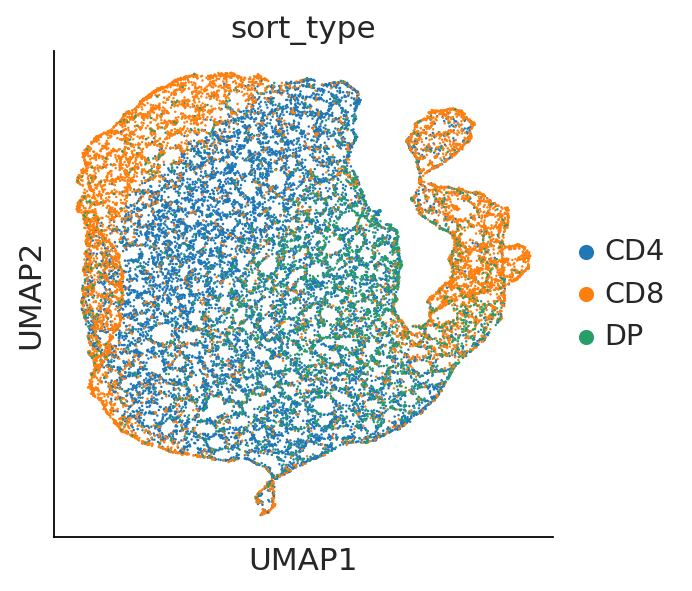

In [121]:
sc.tl.umap(adatax_single)
sc.pl.umap(adatax_single, color = "sort_type")

findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: 

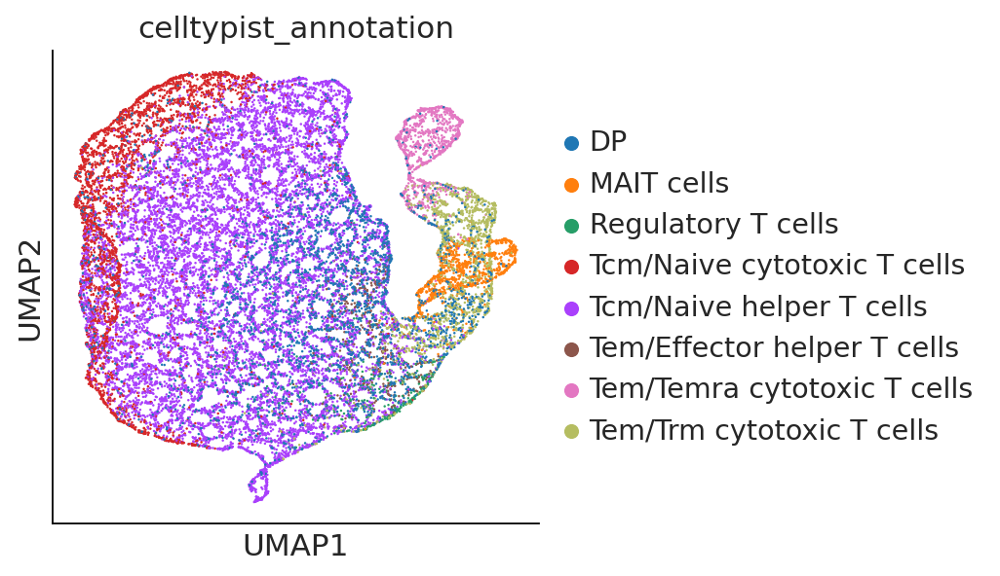

In [122]:
sc.pl.umap(adatax_single, color = "celltypist_annotation")

In [123]:
adatax_single

AnnData object with n_obs × n_vars = 24076 × 2285
    obs: 'sample', 'sort_type', 'donor', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'scrublet_score', 'n_genes', 'gmm_pct_count_clusters_keep', 'is_doublet', 'filter_rna', 'batch', 'CD4/CD8_geneset', 'leiden', 'celltypist_majority_voting', 'celltypist_annotation', 'has_contig', 'filter_contig_quality', 'filter_contig_VDJ', 'filter_contig_VJ', 'contig_QC_pass', 'filter_contig', 'clone_id', 'clone_id_by_size', 'locus_VDJ', 'locus_VJ', 'productive_VDJ', 'productive_VJ', 'v_call_VDJ', 'd_call_VDJ', 'j_call_VDJ', 'v_call_VJ', 'j_call_VJ', 'c_call_VDJ', 'c_call_VJ', 'junction_VDJ', 'junction_VJ', 'junction_aa_VDJ', 'junction_aa_VJ', 'v_call_abT_VDJ', 'd_call_abT_VDJ', 'j_call_abT_VDJ', 'v_call_abT_VJ', 'j_call_abT_VJ', 'c_call_abT_VDJ', 'c_call_abT_VJ', 'productive_abT_VDJ', 'productive_abT_VJ', 'duplicate_count_abT_VDJ', 'duplicate_count_abT_VJ', 'v_call_VDJ_main', 'v_call_VJ_main', 'd_call_VDJ_main', 'j_call_VD

findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: 

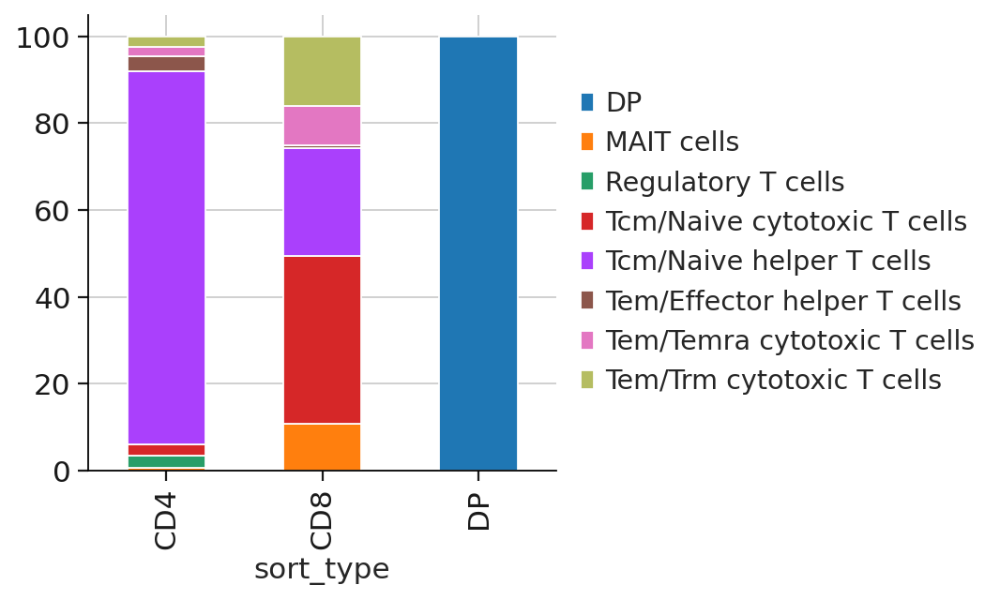

In [124]:
pd.crosstab(adatax_single.obs["sort_type"], adatax_single.obs["celltypist_annotation"]).apply(lambda r: r/r.sum()*100,axis = 1).plot.bar(stacked=True)
plt.legend(bbox_to_anchor=(1,.5), loc = "center left", frameon=False)

# tl/vj gene usage for expanded vs non-expanded cells (singlechain)

In [125]:
# first take all expanded clones... 
adatax_single_expanded = adatax_single[adatax_single.obs['clone_id_size_max_3'].isin (['2', '>=3'])]
adatax_single_expanded

View of AnnData object with n_obs × n_vars = 1740 × 2285
    obs: 'sample', 'sort_type', 'donor', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'scrublet_score', 'n_genes', 'gmm_pct_count_clusters_keep', 'is_doublet', 'filter_rna', 'batch', 'CD4/CD8_geneset', 'leiden', 'celltypist_majority_voting', 'celltypist_annotation', 'has_contig', 'filter_contig_quality', 'filter_contig_VDJ', 'filter_contig_VJ', 'contig_QC_pass', 'filter_contig', 'clone_id', 'clone_id_by_size', 'locus_VDJ', 'locus_VJ', 'productive_VDJ', 'productive_VJ', 'v_call_VDJ', 'd_call_VDJ', 'j_call_VDJ', 'v_call_VJ', 'j_call_VJ', 'c_call_VDJ', 'c_call_VJ', 'junction_VDJ', 'junction_VJ', 'junction_aa_VDJ', 'junction_aa_VJ', 'v_call_abT_VDJ', 'd_call_abT_VDJ', 'j_call_abT_VDJ', 'v_call_abT_VJ', 'j_call_abT_VJ', 'c_call_abT_VDJ', 'c_call_abT_VJ', 'productive_abT_VDJ', 'productive_abT_VJ', 'duplicate_count_abT_VDJ', 'duplicate_count_abT_VJ', 'v_call_VDJ_main', 'v_call_VJ_main', 'd_call_VDJ_main', 'j_

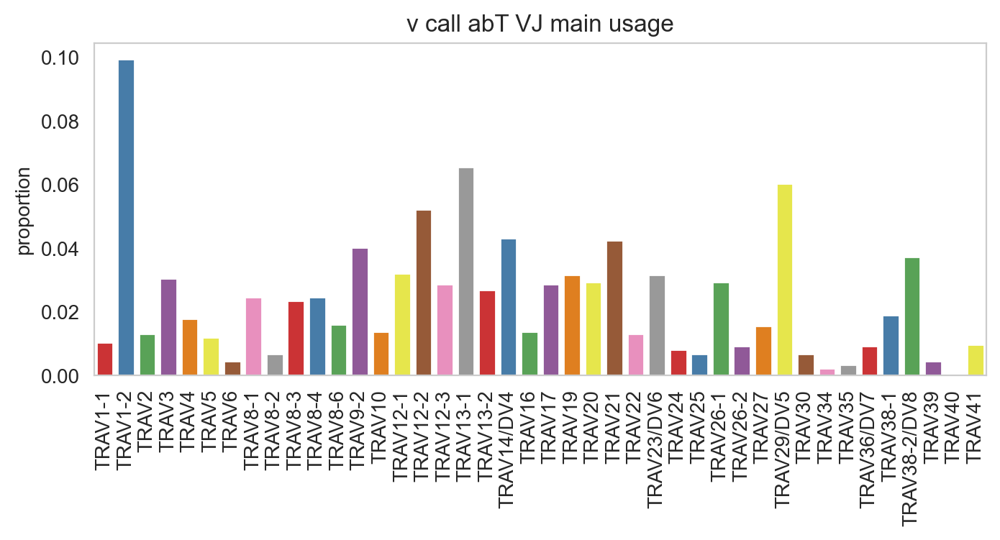

In [126]:
import matplotlib as mpl
import matplotlib.pyplot as plt

mpl.rcParams.update(mpl.rcParamsDefault)

fig, ax = ddl.pl.barplot(
    adatax_single_expanded,  # remove multi from the plots
    color="v_call_abT_VJ_main",
)

plt.show()

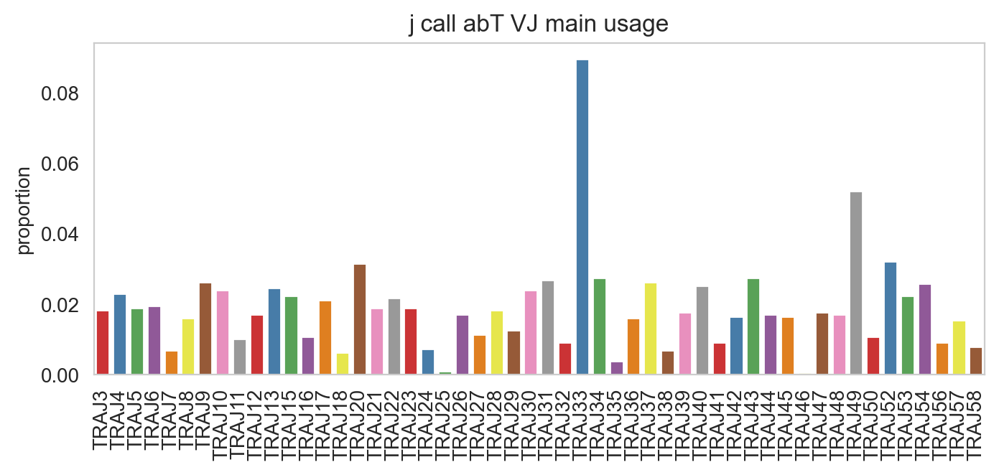

In [127]:
import matplotlib as mpl
import matplotlib.pyplot as plt

mpl.rcParams.update(mpl.rcParamsDefault)

fig, ax = ddl.pl.barplot(
    adatax_single_expanded,  # remove multi from the plots
    color="j_call_abT_VJ_main",
)

plt.show()

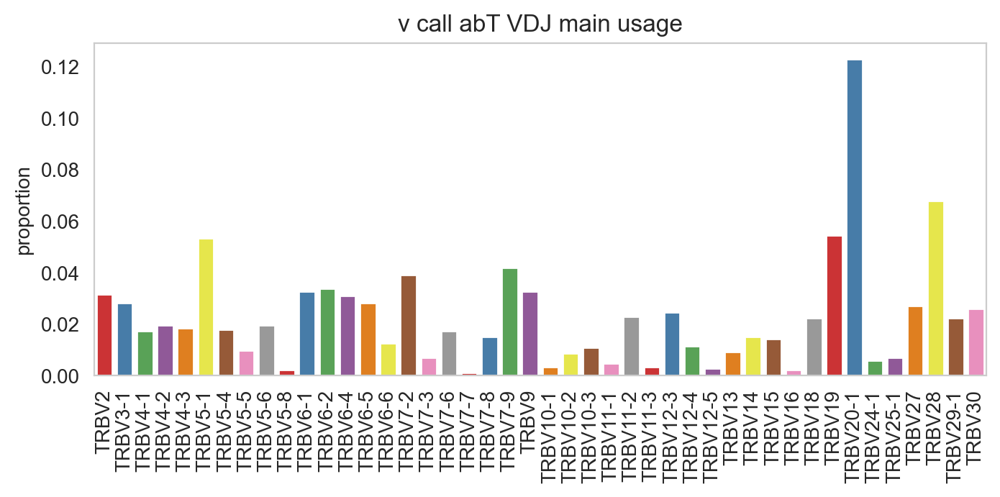

In [128]:
import matplotlib as mpl
import matplotlib.pyplot as plt

mpl.rcParams.update(mpl.rcParamsDefault)

fig, ax = ddl.pl.barplot(
    adatax_single_expanded,  # remove multi from the plots
    color="v_call_abT_VDJ_main",
)

plt.show()

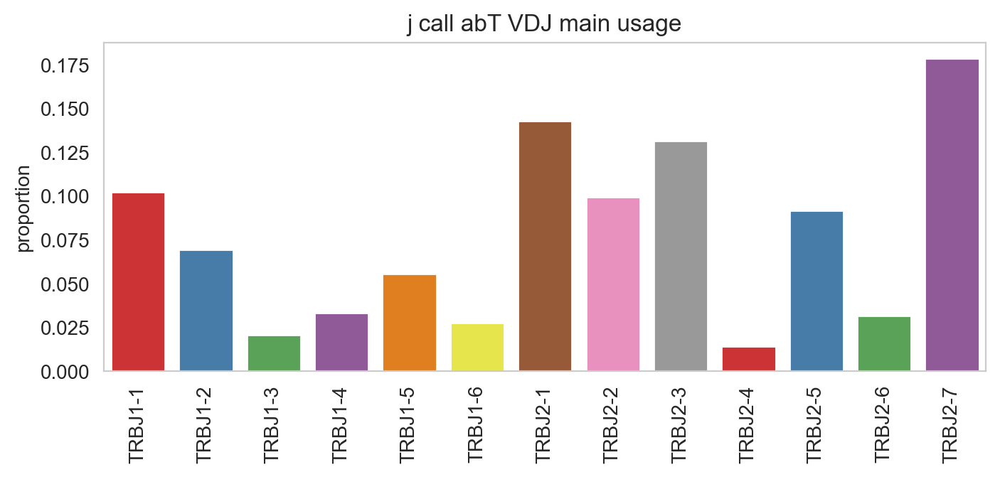

In [129]:
import matplotlib as mpl
import matplotlib.pyplot as plt

mpl.rcParams.update(mpl.rcParamsDefault)

fig, ax = ddl.pl.barplot(
    adatax_single_expanded,  # remove multi from the plots
    color="j_call_abT_VDJ_main",
)

plt.show()

In [129]:
adatax_single_expanded.obs

,sample,sort_type,donor,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,scrublet_score,n_genes,gmm_pct_count_clusters_keep,...,locus_status,chain_status,rearrangement_status_VDJ,rearrangement_status_VJ,clone_id_size,clone_id_size_max_3,nhood_ixs_random,nhood_ixs_refined,nhood_kth_distance,donor_annotation
CD4_L01_AAACCTGTCTGTTTGT-1,CD4_L01,CD4,L01,809,1842.0,21.0,1.140065,0.195231,809,True,...,TRB + TRA,Single pair,standard,standard,2.0,2,0,0,0.000000,L01_Tcm/Naive helper T cells
CD4_L01_AAGGCAGAGACGCACA-1,CD4_L01,CD4,L01,810,1705.0,17.0,0.997067,0.057143,810,True,...,TRB + TRA,Single pair,standard,standard,2.0,2,0,0,0.000000,L01_Tem/Trm cytotoxic T cells
CD4_L01_AATCCAGAGCTACCTA-1,CD4_L01,CD4,L01,457,744.0,5.0,0.672043,0.101695,457,True,...,TRB + TRA,Single pair,standard,standard,2.0,2,0,0,0.000000,L01_Tcm/Naive helper T cells
CD4_L01_AATCGGTCAAGTCTGT-1,CD4_L01,CD4,L01,709,1226.0,14.0,1.141925,0.062767,709,True,...,TRB + TRA,Single pair,standard,standard,2.0,2,0,0,0.000000,L01_Regulatory T cells
CD4_L01_ACATGGTCACTTAAGC-1,CD4_L01,CD4,L01,874,1695.0,14.0,0.825959,0.049618,874,True,...,TRB + TRA,Single pair,standard,standard,2.0,2,0,0,0.000000,L01_Tem/Trm cytotoxic T cells
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
V_DP_TGTGTTTAGACGCAAC-1,V_DP,DP,V,749,1961.0,0.0,0.000000,0.333333,749,True,...,TRB + TRA,Single pair,standard,standard,2.0,2,0,0,0.000000,V_DP
V_DP_TTCCCAGCACATCTTT-1,V_DP,DP,V,496,1038.0,0.0,0.000000,0.250000,496,True,...,TRB + TRA,Single pair,standard,standard,2.0,2,0,0,0.000000,V_DP
V_DP_TTGGAACCACATGGGA-1,V_DP,DP,V,440,770.0,0.0,0.000000,0.333333,440,True,...,TRB + TRA,Single pair,standard,standard,2.0,2,0,0,0.000000,V_DP
V_DP_TTTCCTCAGCTGAACG-1,V_DP,DP,V,561,1094.0,0.0,0.000000,0.229572,561,True,...,TRB + TRA,Single pair,standard,standard,2.0,2,1,1,0.610708,V_DP


In [130]:
adatax_single_expanded

View of AnnData object with n_obs × n_vars = 1740 × 2285
    obs: 'sample', 'sort_type', 'donor', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'scrublet_score', 'n_genes', 'gmm_pct_count_clusters_keep', 'is_doublet', 'filter_rna', 'batch', 'CD4/CD8_geneset', 'leiden', 'celltypist_majority_voting', 'celltypist_annotation', 'has_contig', 'filter_contig_quality', 'filter_contig_VDJ', 'filter_contig_VJ', 'contig_QC_pass', 'filter_contig', 'clone_id', 'clone_id_by_size', 'locus_VDJ', 'locus_VJ', 'productive_VDJ', 'productive_VJ', 'v_call_VDJ', 'd_call_VDJ', 'j_call_VDJ', 'v_call_VJ', 'j_call_VJ', 'c_call_VDJ', 'c_call_VJ', 'junction_VDJ', 'junction_VJ', 'junction_aa_VDJ', 'junction_aa_VJ', 'v_call_abT_VDJ', 'd_call_abT_VDJ', 'j_call_abT_VDJ', 'v_call_abT_VJ', 'j_call_abT_VJ', 'c_call_abT_VDJ', 'c_call_abT_VJ', 'productive_abT_VDJ', 'productive_abT_VJ', 'duplicate_count_abT_VDJ', 'duplicate_count_abT_VJ', 'v_call_VDJ_main', 'v_call_VJ_main', 'd_call_VDJ_main', 'j_

### I want to plot it for each cell type using facet so that the same x/y-axis applies to all. Also, we want to see the proportion of cells within each cell type that uses each gene. So we will divide the counts over total number of cells in each cell type.

In [131]:
working_df = pd.DataFrame(adatax_single_expanded.obs.groupby("celltypist_annotation")["v_call_abT_VDJ_main"].value_counts())
working_df

v_call_abT_VDJ_main
celltypist_annotation     v_call_abT_VDJ_main                     
DP                        TRBV20-1                              36
                          TRBV2                                 24
                          TRBV7-9                               19
                          TRBV19                                19
                          TRBV4-3                               17
...                                                            ...
Tem/Trm cytotoxic T cells TRBV11-2                               0
                          TRBV11-1                               0
                          TRBV6-1                                0
                          TRBV4-3                                0
                          TRBV12-3                               0

[352 rows x 1 columns]

In [132]:
working_df.columns =["counts"]
#need to make it into each row, so just reset index.. inplace = Trus is a shortcut to assign the change to the current object.
working_df.reset_index(inplace = True)
working_df

,celltypist_annotation,v_call_abT_VDJ_main,counts
0,DP,TRBV20-1,36
1,DP,TRBV2,24
2,DP,TRBV7-9,19
3,DP,TRBV19,19
4,DP,TRBV4-3,17
...,...,...,...
347,Tem/Trm cytotoxic T cells,TRBV11-2,0
348,Tem/Trm cytotoxic T cells,TRBV11-1,0
349,Tem/Trm cytotoxic T cells,TRBV6-1,0
350,Tem/Trm cytotoxic T cells,TRBV4-3,0


In [133]:
## Now get the number of cells per celltype

total_count_dict = {}
for x in working_df.celltypist_annotation.unique():
    tmp = working_df[working_df["celltypist_annotation"] == x]
    total_count_dict[x] = tmp["counts"].sum()
total_count_dict

{'DP': 261,
 'MAIT cells': 157,
 'Regulatory T cells': 45,
 'Tcm/Naive cytotoxic T cells': 43,
 'Tcm/Naive helper T cells': 959,
 'Tem/Effector helper T cells': 61,
 'Tem/Temra cytotoxic T cells': 55,
 'Tem/Trm cytotoxic T cells': 159}

In [134]:
working_df["proportion"] = 0
# normalise VDJ counts ie how many cells use each gene per total count per group.
for i, row in working_df.iterrows():
    try:
        working_df.at[i, "proportion"] = row["counts"] / total_count_dict[row["celltypist_annotation"]]
    except:
        pass

In [135]:
working_df

,celltypist_annotation,v_call_abT_VDJ_main,counts,proportion
0,DP,TRBV20-1,36,0.137931
1,DP,TRBV2,24,0.091954
2,DP,TRBV7-9,19,0.072797
3,DP,TRBV19,19,0.072797
4,DP,TRBV4-3,17,0.065134
...,...,...,...,...
347,Tem/Trm cytotoxic T cells,TRBV11-2,0,0.000000
348,Tem/Trm cytotoxic T cells,TRBV11-1,0,0.000000
349,Tem/Trm cytotoxic T cells,TRBV6-1,0,0.000000
350,Tem/Trm cytotoxic T cells,TRBV4-3,0,0.000000


In [136]:
## Reordering
working_df["celltypist_annotation"] = working_df[
    "celltypist_annotation"
].cat.reorder_categories(
    [
        "MAIT cells",
        "Regulatory T cells",
        "Tcm/Naive cytotoxic T cells",
        "Tem/Temra cytotoxic T cells",
        "Tem/Trm cytotoxic T cells",
        "Tcm/Naive helper T cells",
        "Tem/Effector helper T cells",
        "DP",
    ]
)

Getting ggplot functions in

In [137]:
from plotnine import ggplot, aes, facet_grid, geom_bar, theme_bw, facet_wrap, theme_classic, options, theme, element_text, scale_fill_manual

In [138]:
from scanpy.plotting.palettes import default_20, default_28
# https://github.com/scverse/scanpy/blob/master/scanpy/plotting/palettes.py
col_palette = default_20 + default_28
col_palette

['#1f77b4',
 '#ff7f0e',
 '#279e68',
 '#d62728',
 '#aa40fc',
 '#8c564b',
 '#e377c2',
 '#b5bd61',
 '#17becf',
 '#aec7e8',
 '#ffbb78',
 '#98df8a',
 '#ff9896',
 '#c5b0d5',
 '#c49c94',
 '#f7b6d2',
 '#dbdb8d',
 '#9edae5',
 '#ad494a',
 '#8c6d31',
 '#023fa5',
 '#7d87b9',
 '#bec1d4',
 '#d6bcc0',
 '#bb7784',
 '#8e063b',
 '#4a6fe3',
 '#8595e1',
 '#b5bbe3',
 '#e6afb9',
 '#e07b91',
 '#d33f6a',
 '#11c638',
 '#8dd593',
 '#c6dec7',
 '#ead3c6',
 '#f0b98d',
 '#ef9708',
 '#0fcfc0',
 '#9cded6',
 '#d5eae7',
 '#f3e1eb',
 '#f6c4e1',
 '#f79cd4',
 '#7f7f7f',
 '#c7c7c7',
 '#1CE6FF',
 '#336600']

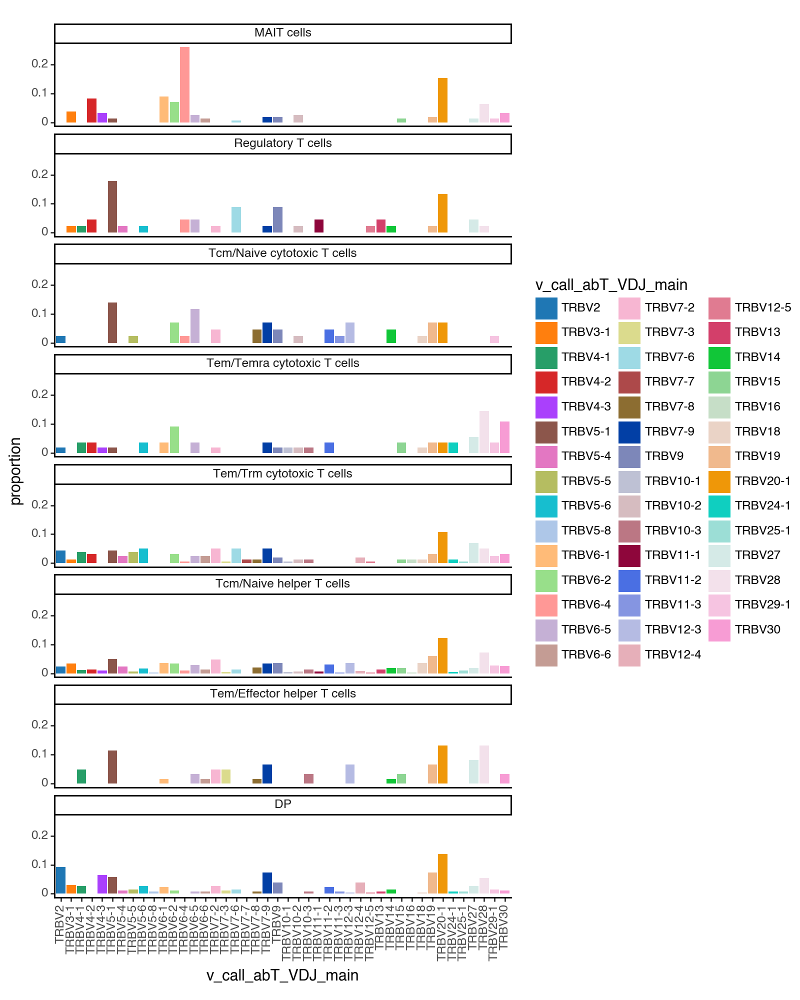

<Figure Size: (800 x 1000)>

In [139]:
options.figure_size = (8, 10)
(
    ggplot(
        working_df,
        aes(x="v_call_abT_VDJ_main", y="proportion", fill="v_call_abT_VDJ_main"),
    )
    + geom_bar(stat="identity")
    + facet_wrap("~celltypist_annotation", ncol=1)
    + scale_fill_manual(values=col_palette)
    + theme_classic()
    + theme(axis_text_x=element_text(angle=90))
)

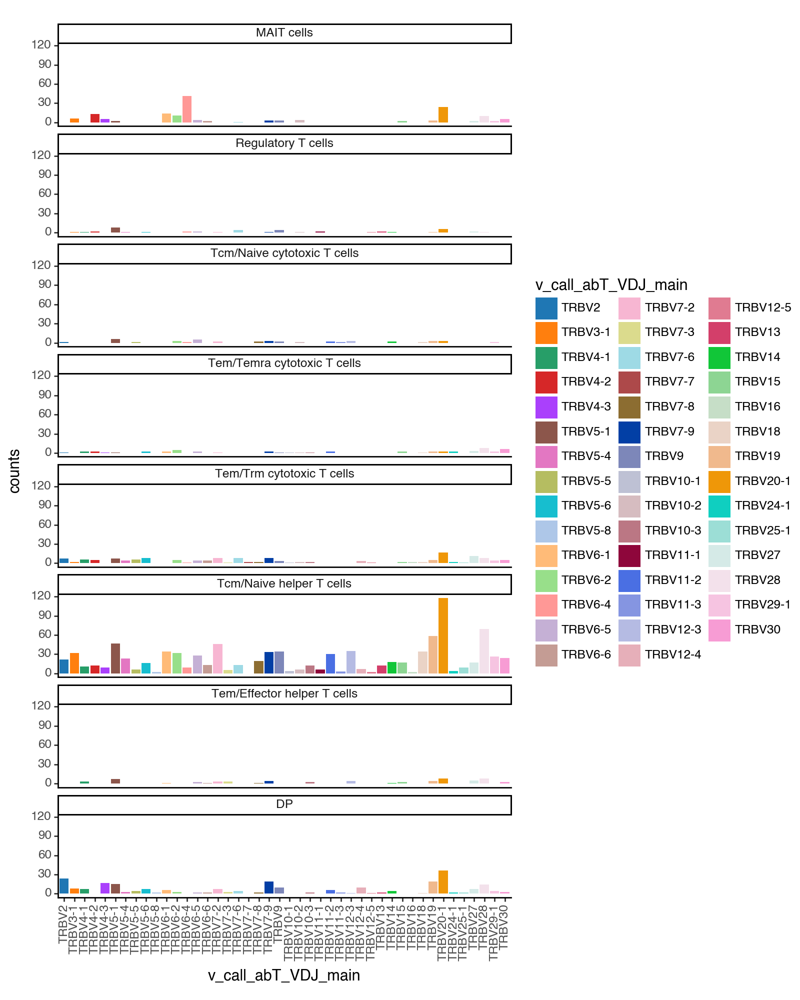

<Figure Size: (800 x 1000)>

In [140]:
options.figure_size = (8, 10)
(
    ggplot(
        working_df,
        aes(x="v_call_abT_VDJ_main", y="counts", fill="v_call_abT_VDJ_main"),
    )
    + geom_bar(stat="identity")
    + facet_wrap("~celltypist_annotation", ncol=1)
    + scale_fill_manual(values=col_palette)
    + theme_classic()
    + theme(axis_text_x=element_text(angle=90))
)

In [141]:
working_df = pd.DataFrame(adatax_single_expanded.obs.groupby("celltypist_annotation")["j_call_abT_VDJ_main"].value_counts())
working_df.columns =["counts"]
working_df.reset_index(inplace = True)
working_df

,celltypist_annotation,j_call_abT_VDJ_main,counts
0,DP,TRBJ2-7,54
1,DP,TRBJ2-1,37
2,DP,TRBJ1-1,29
3,DP,TRBJ2-3,27
4,DP,TRBJ2-5,27
...,...,...,...
99,Tem/Trm cytotoxic T cells,TRBJ1-4,4
100,Tem/Trm cytotoxic T cells,TRBJ1-3,3
101,Tem/Trm cytotoxic T cells,TRBJ1-5,3
102,Tem/Trm cytotoxic T cells,TRBJ2-4,1


In [142]:
total_count_dict = {}
for x in working_df.celltypist_annotation.unique():
    tmp = working_df[working_df["celltypist_annotation"] == x]
    total_count_dict[x] = tmp["counts"].sum()
total_count_dict

{'DP': 261,
 'MAIT cells': 157,
 'Regulatory T cells': 45,
 'Tcm/Naive cytotoxic T cells': 43,
 'Tcm/Naive helper T cells': 959,
 'Tem/Effector helper T cells': 61,
 'Tem/Temra cytotoxic T cells': 55,
 'Tem/Trm cytotoxic T cells': 159}

In [143]:
working_df["proportion"] = 0
# normalise to total
for i, row in working_df.iterrows():
    try:
        working_df.at[i, "proportion"] = row["counts"] / total_count_dict[row["celltypist_annotation"]]
    except:
        pass

In [144]:
working_df

,celltypist_annotation,j_call_abT_VDJ_main,counts,proportion
0,DP,TRBJ2-7,54,0.206897
1,DP,TRBJ2-1,37,0.141762
2,DP,TRBJ1-1,29,0.111111
3,DP,TRBJ2-3,27,0.103448
4,DP,TRBJ2-5,27,0.103448
...,...,...,...,...
99,Tem/Trm cytotoxic T cells,TRBJ1-4,4,0.025157
100,Tem/Trm cytotoxic T cells,TRBJ1-3,3,0.018868
101,Tem/Trm cytotoxic T cells,TRBJ1-5,3,0.018868
102,Tem/Trm cytotoxic T cells,TRBJ2-4,1,0.006289


In [145]:
working_df["celltypist_annotation"] = working_df[
    "celltypist_annotation"
].cat.reorder_categories(
    [
        "MAIT cells",
        "Regulatory T cells",
        "Tcm/Naive cytotoxic T cells",
        "Tem/Temra cytotoxic T cells",
        "Tem/Trm cytotoxic T cells",
        "Tcm/Naive helper T cells",
        "Tem/Effector helper T cells",
        "DP",
    ]
)

In [146]:
from plotnine import ggplot, aes, facet_grid, geom_bar, theme_bw, facet_wrap, theme_classic, options, theme, element_text, scale_fill_manual

In [147]:
from scanpy.plotting.palettes import default_20, default_28

col_palette = default_20 + default_28
col_palette

['#1f77b4',
 '#ff7f0e',
 '#279e68',
 '#d62728',
 '#aa40fc',
 '#8c564b',
 '#e377c2',
 '#b5bd61',
 '#17becf',
 '#aec7e8',
 '#ffbb78',
 '#98df8a',
 '#ff9896',
 '#c5b0d5',
 '#c49c94',
 '#f7b6d2',
 '#dbdb8d',
 '#9edae5',
 '#ad494a',
 '#8c6d31',
 '#023fa5',
 '#7d87b9',
 '#bec1d4',
 '#d6bcc0',
 '#bb7784',
 '#8e063b',
 '#4a6fe3',
 '#8595e1',
 '#b5bbe3',
 '#e6afb9',
 '#e07b91',
 '#d33f6a',
 '#11c638',
 '#8dd593',
 '#c6dec7',
 '#ead3c6',
 '#f0b98d',
 '#ef9708',
 '#0fcfc0',
 '#9cded6',
 '#d5eae7',
 '#f3e1eb',
 '#f6c4e1',
 '#f79cd4',
 '#7f7f7f',
 '#c7c7c7',
 '#1CE6FF',
 '#336600']

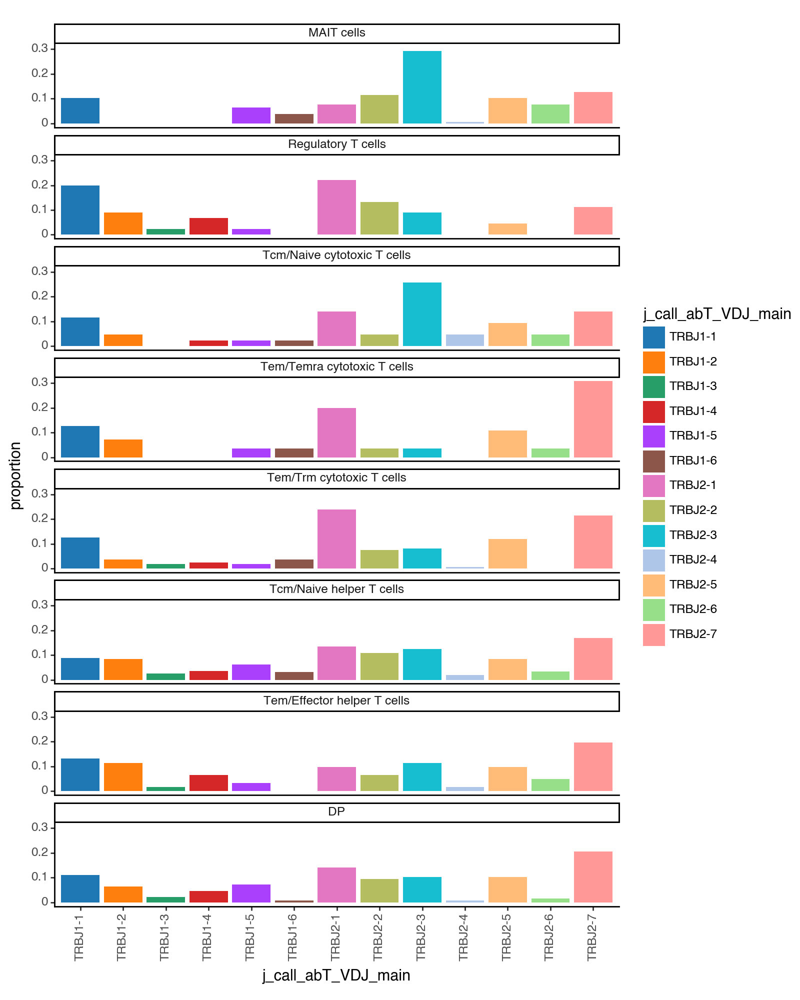

<Figure Size: (800 x 1000)>

In [148]:
options.figure_size = (8, 10)
(
    ggplot(
        working_df,
        aes(x="j_call_abT_VDJ_main", y="proportion", fill="j_call_abT_VDJ_main"),
    )
    + geom_bar(stat="identity")
    + facet_wrap("~celltypist_annotation", ncol=1)
    + scale_fill_manual(values=col_palette)
    + theme_classic()
    + theme(axis_text_x=element_text(angle=90))
)

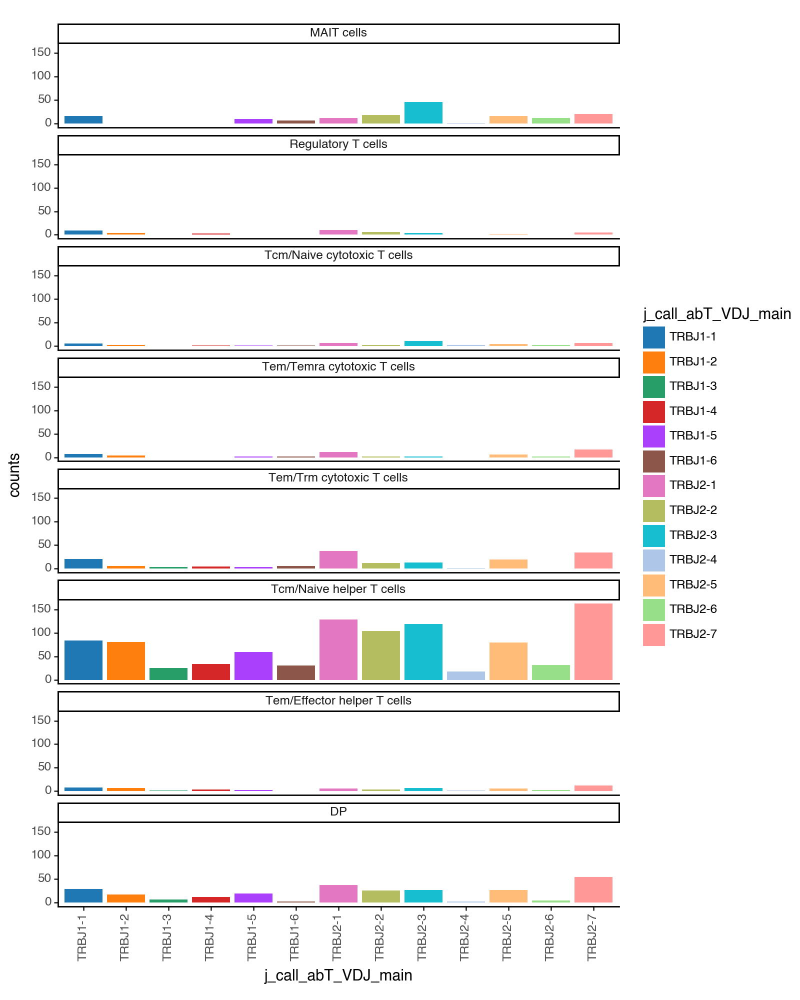

<Figure Size: (800 x 1000)>

In [149]:
options.figure_size = (8, 10)
(
    ggplot(
        working_df,
        aes(x="j_call_abT_VDJ_main", y="counts", fill="j_call_abT_VDJ_main"),
    )
    + geom_bar(stat="identity")
    + facet_wrap("~celltypist_annotation", ncol=1)
    + scale_fill_manual(values=col_palette)
    + theme_classic()
    + theme(axis_text_x=element_text(angle=90))
)

In [150]:
working_df = pd.DataFrame(adatax_single_expanded.obs.groupby("celltypist_annotation")["v_call_abT_VJ_main"].value_counts())
working_df.columns =["counts"]
working_df.reset_index(inplace = True)
working_df

,celltypist_annotation,v_call_abT_VJ_main,counts
0,DP,TRAV19,26
1,DP,TRAV20,21
2,DP,TRAV12-2,19
3,DP,TRAV29/DV5,18
4,DP,TRAV21,16
...,...,...,...
331,Tem/Trm cytotoxic T cells,TRAV4,0
332,Tem/Trm cytotoxic T cells,TRAV34,0
333,Tem/Trm cytotoxic T cells,TRAV35,0
334,Tem/Trm cytotoxic T cells,TRAV36/DV7,0


In [151]:
total_count_dict = {}
for x in working_df.celltypist_annotation.unique():
    tmp = working_df[working_df["celltypist_annotation"] == x]
    total_count_dict[x] = tmp["counts"].sum()
total_count_dict

{'DP': 261,
 'MAIT cells': 157,
 'Regulatory T cells': 45,
 'Tcm/Naive cytotoxic T cells': 43,
 'Tcm/Naive helper T cells': 959,
 'Tem/Effector helper T cells': 61,
 'Tem/Temra cytotoxic T cells': 55,
 'Tem/Trm cytotoxic T cells': 159}

In [152]:
working_df["proportion"] = 0
# normalise to total
for i, row in working_df.iterrows():
    try:
        working_df.at[i, "proportion"] = row["counts"] / total_count_dict[row["celltypist_annotation"]]
    except:
        pass

In [153]:
working_df

,celltypist_annotation,v_call_abT_VJ_main,counts,proportion
0,DP,TRAV19,26,0.099617
1,DP,TRAV20,21,0.080460
2,DP,TRAV12-2,19,0.072797
3,DP,TRAV29/DV5,18,0.068966
4,DP,TRAV21,16,0.061303
...,...,...,...,...
331,Tem/Trm cytotoxic T cells,TRAV4,0,0.000000
332,Tem/Trm cytotoxic T cells,TRAV34,0,0.000000
333,Tem/Trm cytotoxic T cells,TRAV35,0,0.000000
334,Tem/Trm cytotoxic T cells,TRAV36/DV7,0,0.000000


In [154]:
working_df["celltypist_annotation"] = working_df[
    "celltypist_annotation"
].cat.reorder_categories(
    [
        "MAIT cells",
        "Regulatory T cells",
        "Tcm/Naive cytotoxic T cells",
        "Tem/Temra cytotoxic T cells",
        "Tem/Trm cytotoxic T cells",
        "Tcm/Naive helper T cells",
        "Tem/Effector helper T cells",
        "DP",
    ]
)

In [155]:
from plotnine import ggplot, aes, facet_grid, geom_bar, theme_bw, facet_wrap, theme_classic, options, theme, element_text, scale_fill_manual

In [156]:
from scanpy.plotting.palettes import default_20, default_28

col_palette = default_20 + default_28
col_palette

['#1f77b4',
 '#ff7f0e',
 '#279e68',
 '#d62728',
 '#aa40fc',
 '#8c564b',
 '#e377c2',
 '#b5bd61',
 '#17becf',
 '#aec7e8',
 '#ffbb78',
 '#98df8a',
 '#ff9896',
 '#c5b0d5',
 '#c49c94',
 '#f7b6d2',
 '#dbdb8d',
 '#9edae5',
 '#ad494a',
 '#8c6d31',
 '#023fa5',
 '#7d87b9',
 '#bec1d4',
 '#d6bcc0',
 '#bb7784',
 '#8e063b',
 '#4a6fe3',
 '#8595e1',
 '#b5bbe3',
 '#e6afb9',
 '#e07b91',
 '#d33f6a',
 '#11c638',
 '#8dd593',
 '#c6dec7',
 '#ead3c6',
 '#f0b98d',
 '#ef9708',
 '#0fcfc0',
 '#9cded6',
 '#d5eae7',
 '#f3e1eb',
 '#f6c4e1',
 '#f79cd4',
 '#7f7f7f',
 '#c7c7c7',
 '#1CE6FF',
 '#336600']

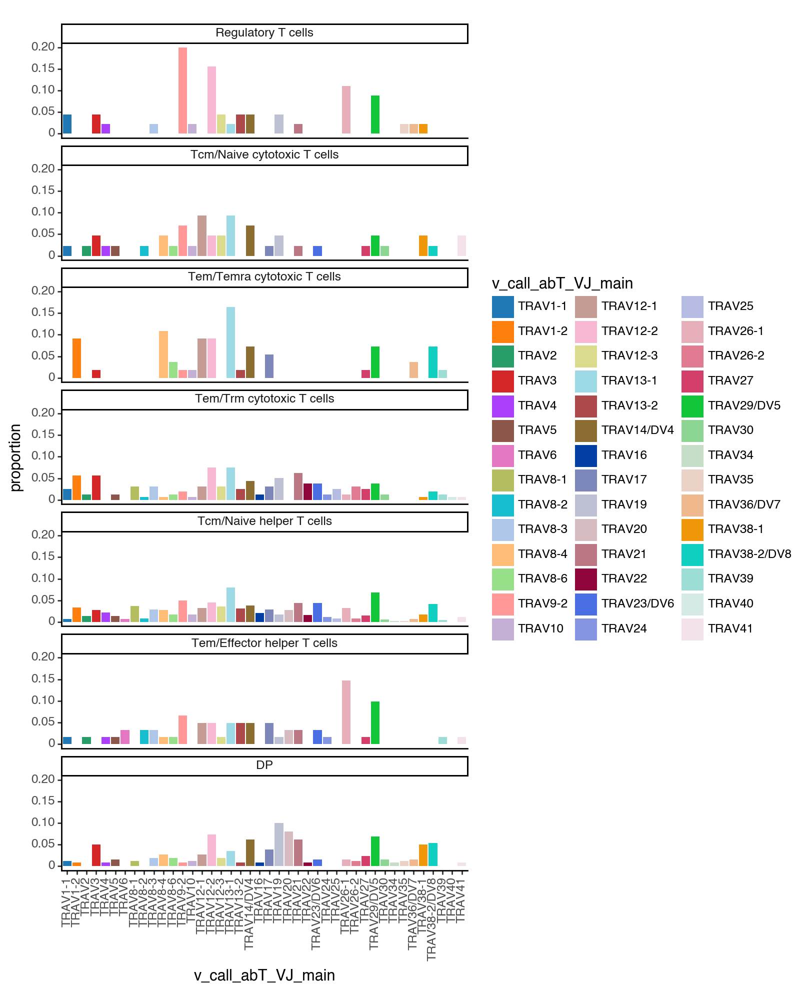

<Figure Size: (800 x 1000)>

In [157]:
# remove MAIT cells
options.figure_size = (8, 10)
(
    ggplot(
        working_df[working_df.celltypist_annotation != "MAIT cells"],
        aes(x="v_call_abT_VJ_main", y="proportion", fill="v_call_abT_VJ_main"),
    )
    + geom_bar(stat="identity")
    + facet_wrap("~celltypist_annotation", ncol=1)
    + scale_fill_manual(values=col_palette)
    + theme_classic()
    + theme(axis_text_x=element_text(angle=90))
)

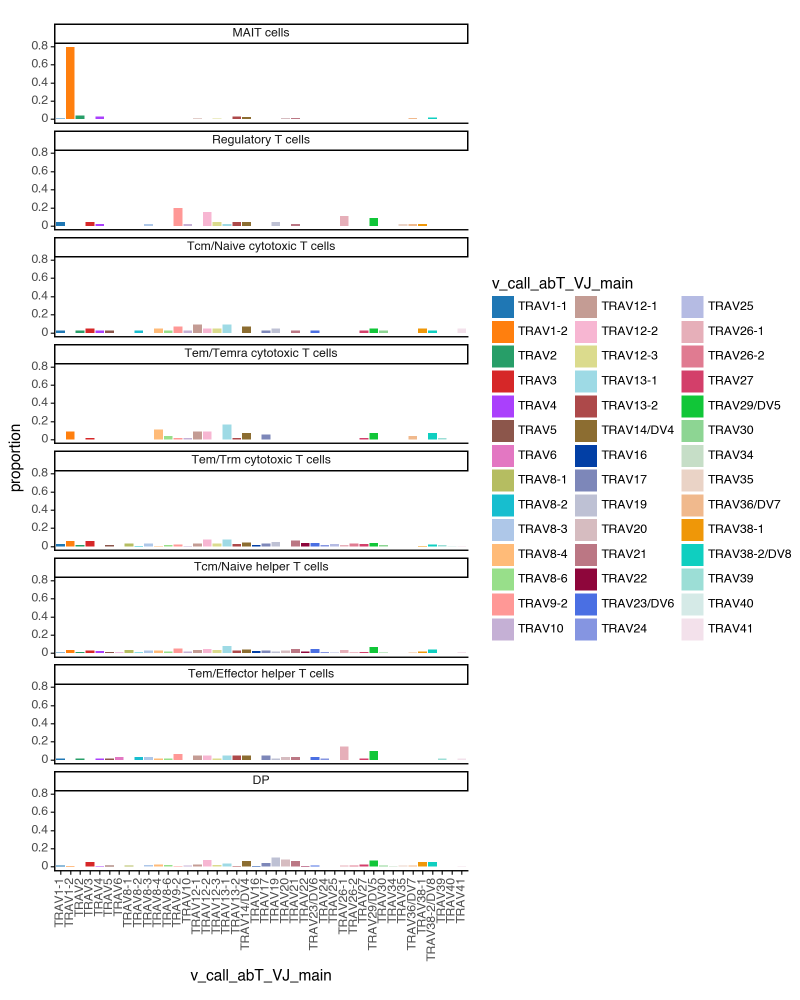

<Figure Size: (800 x 1000)>

In [158]:
options.figure_size = (8, 10)
(
    ggplot(
        working_df,
        aes(x="v_call_abT_VJ_main", y="proportion", fill="v_call_abT_VJ_main"),
    )
    + geom_bar(stat="identity")
    + facet_wrap("~celltypist_annotation", ncol=1)
    + scale_fill_manual(values=col_palette)
    + theme_classic()
    + theme(axis_text_x=element_text(angle=90))
)

In [159]:
working_df = pd.DataFrame(adatax_single_expanded.obs.groupby("celltypist_annotation")["j_call_abT_VJ_main"].value_counts())
working_df.columns =["counts"]
working_df.reset_index(inplace = True)
working_df

,celltypist_annotation,j_call_abT_VJ_main,counts
0,DP,TRAJ43,13
1,DP,TRAJ33,13
2,DP,TRAJ49,12
3,DP,TRAJ20,12
4,DP,TRAJ52,11
...,...,...,...
411,Tem/Trm cytotoxic T cells,TRAJ38,0
412,Tem/Trm cytotoxic T cells,TRAJ8,0
413,Tem/Trm cytotoxic T cells,TRAJ7,0
414,Tem/Trm cytotoxic T cells,TRAJ57,0


In [160]:
total_count_dict = {}
for x in working_df.celltypist_annotation.unique():
    tmp = working_df[working_df["celltypist_annotation"] == x]
    total_count_dict[x] = tmp["counts"].sum()
total_count_dict

{'DP': 261,
 'MAIT cells': 157,
 'Regulatory T cells': 45,
 'Tcm/Naive cytotoxic T cells': 43,
 'Tcm/Naive helper T cells': 959,
 'Tem/Effector helper T cells': 61,
 'Tem/Temra cytotoxic T cells': 55,
 'Tem/Trm cytotoxic T cells': 159}

In [161]:
working_df["proportion"] = 0
# normalise to total
for i, row in working_df.iterrows():
    try:
        working_df.at[i, "proportion"] = row["counts"] / total_count_dict[row["celltypist_annotation"]]
    except:
        pass

In [162]:
working_df

,celltypist_annotation,j_call_abT_VJ_main,counts,proportion
0,DP,TRAJ43,13,0.049808
1,DP,TRAJ33,13,0.049808
2,DP,TRAJ49,12,0.045977
3,DP,TRAJ20,12,0.045977
4,DP,TRAJ52,11,0.042146
...,...,...,...,...
411,Tem/Trm cytotoxic T cells,TRAJ38,0,0.000000
412,Tem/Trm cytotoxic T cells,TRAJ8,0,0.000000
413,Tem/Trm cytotoxic T cells,TRAJ7,0,0.000000
414,Tem/Trm cytotoxic T cells,TRAJ57,0,0.000000


In [163]:
working_df["celltypist_annotation"] = working_df[
    "celltypist_annotation"
].cat.reorder_categories(
    [
        "MAIT cells",
        "Regulatory T cells",
        "Tcm/Naive cytotoxic T cells",
        "Tem/Temra cytotoxic T cells",
        "Tem/Trm cytotoxic T cells",
        "Tcm/Naive helper T cells",
        "Tem/Effector helper T cells",
        "DP",
    ]
)

In [164]:
from plotnine import ggplot, aes, facet_grid, geom_bar, theme_bw, facet_wrap, theme_classic, options, theme, element_text, scale_fill_manual

In [165]:
from scanpy.plotting.palettes import default_20, default_28

col_palette = default_20 + default_28
col_palette

['#1f77b4',
 '#ff7f0e',
 '#279e68',
 '#d62728',
 '#aa40fc',
 '#8c564b',
 '#e377c2',
 '#b5bd61',
 '#17becf',
 '#aec7e8',
 '#ffbb78',
 '#98df8a',
 '#ff9896',
 '#c5b0d5',
 '#c49c94',
 '#f7b6d2',
 '#dbdb8d',
 '#9edae5',
 '#ad494a',
 '#8c6d31',
 '#023fa5',
 '#7d87b9',
 '#bec1d4',
 '#d6bcc0',
 '#bb7784',
 '#8e063b',
 '#4a6fe3',
 '#8595e1',
 '#b5bbe3',
 '#e6afb9',
 '#e07b91',
 '#d33f6a',
 '#11c638',
 '#8dd593',
 '#c6dec7',
 '#ead3c6',
 '#f0b98d',
 '#ef9708',
 '#0fcfc0',
 '#9cded6',
 '#d5eae7',
 '#f3e1eb',
 '#f6c4e1',
 '#f79cd4',
 '#7f7f7f',
 '#c7c7c7',
 '#1CE6FF',
 '#336600']

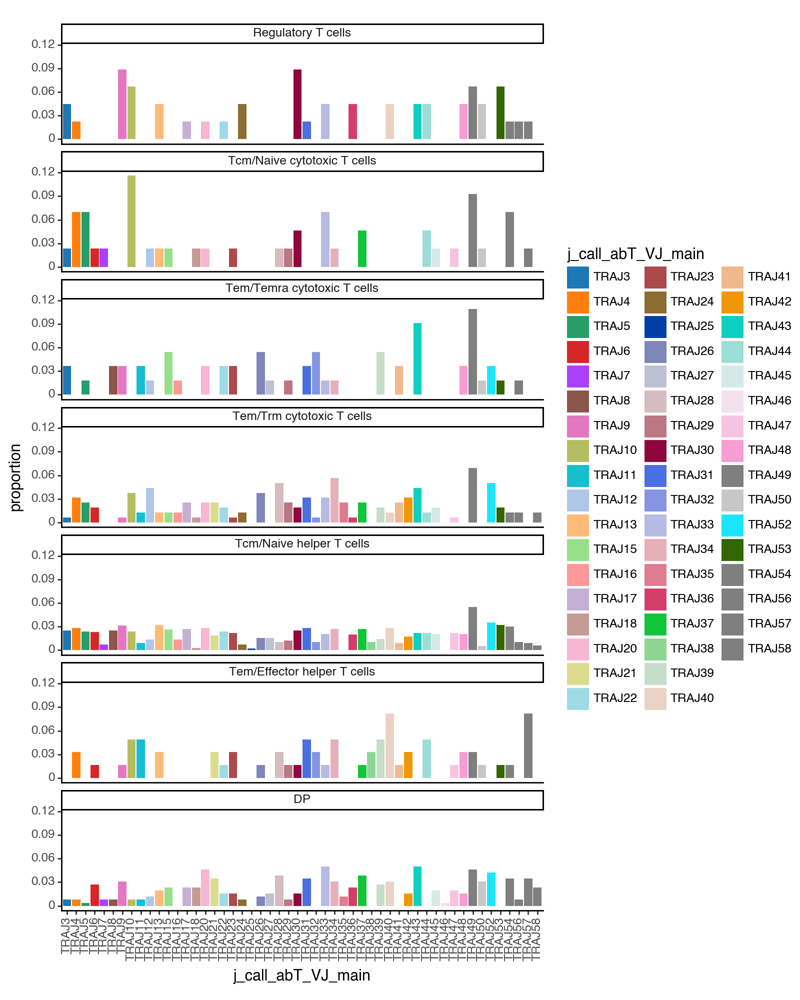

<Figure Size: (800 x 1000)>

In [166]:
options.figure_size = (8, 10)
(
    ggplot(
        working_df[working_df.celltypist_annotation != "MAIT cells"],
        aes(x="j_call_abT_VJ_main", y="proportion", fill="j_call_abT_VJ_main"),
    )
    + geom_bar(stat="identity")
    + facet_wrap("~celltypist_annotation", ncol=1)
    + scale_fill_manual(values=col_palette)
    + theme_classic()
    + theme(axis_text_x=element_text(angle=90))
)

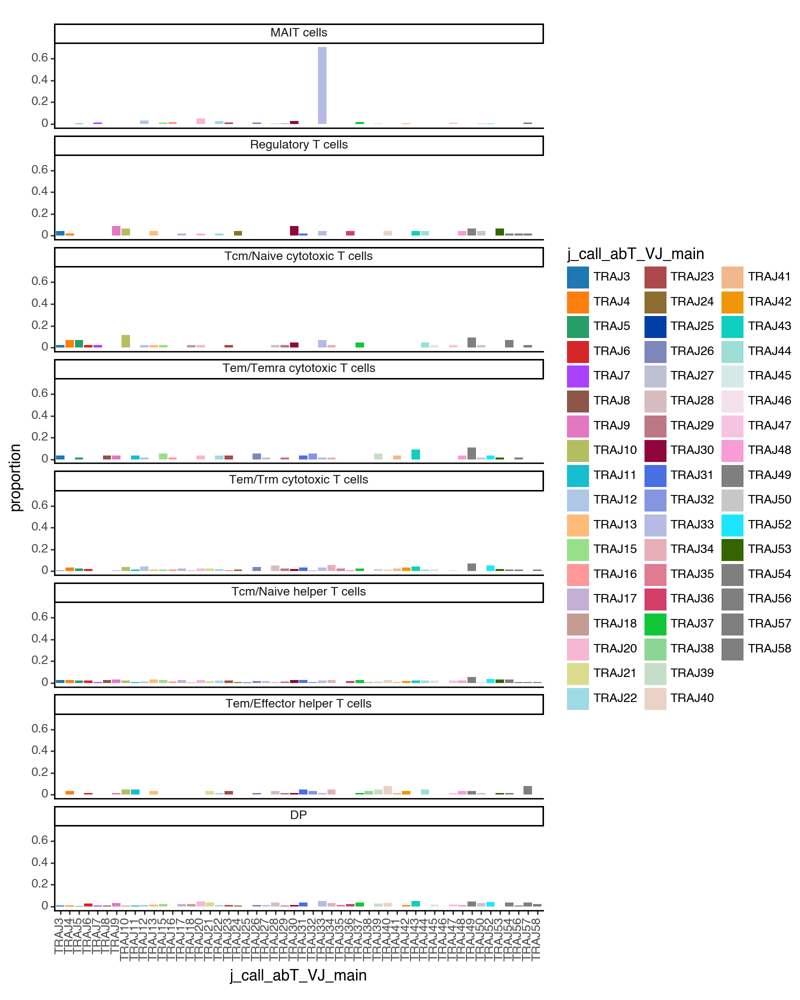

<Figure Size: (800 x 1000)>

In [167]:
options.figure_size = (8, 10)
(
    ggplot(
        working_df,
        aes(x="j_call_abT_VJ_main", y="proportion", fill="j_call_abT_VJ_main"),
    )
    + geom_bar(stat="identity")
    + facet_wrap("~celltypist_annotation", ncol=1)
    + scale_fill_manual(values=col_palette)
    + theme_classic()
    + theme(axis_text_x=element_text(angle=90))
)

## REDO EVERYTHING BIT BY BIT
#### EXPANDED AND NO MAIT CELLS

##### beta chains

In [168]:
### get a df of annotation vs v gene (b chain)
working_df = pd.DataFrame(adatax_single_expanded.obs.groupby("celltypist_annotation")["v_call_abT_VDJ_main"].value_counts())
working_df

v_call_abT_VDJ_main
celltypist_annotation     v_call_abT_VDJ_main                     
DP                        TRBV20-1                              36
                          TRBV2                                 24
                          TRBV7-9                               19
                          TRBV19                                19
                          TRBV4-3                               17
...                                                            ...
Tem/Trm cytotoxic T cells TRBV11-2                               0
                          TRBV11-1                               0
                          TRBV6-1                                0
                          TRBV4-3                                0
                          TRBV12-3                               0

[352 rows x 1 columns]

In [169]:
working_df.columns =["counts"]
#need to make it into each row, so just reset index.. inplace = Trus is a shortcut to assign the change to the current object.
working_df.reset_index(inplace = True)
working_df

,celltypist_annotation,v_call_abT_VDJ_main,counts
0,DP,TRBV20-1,36
1,DP,TRBV2,24
2,DP,TRBV7-9,19
3,DP,TRBV19,19
4,DP,TRBV4-3,17
...,...,...,...
347,Tem/Trm cytotoxic T cells,TRBV11-2,0
348,Tem/Trm cytotoxic T cells,TRBV11-1,0
349,Tem/Trm cytotoxic T cells,TRBV6-1,0
350,Tem/Trm cytotoxic T cells,TRBV4-3,0


In [170]:
## Now get the number of cells per celltype

total_count_dict = {}
for x in working_df.celltypist_annotation.unique():
    tmp = working_df[working_df["celltypist_annotation"] == x]
    total_count_dict[x] = tmp["counts"].sum()
total_count_dict

{'DP': 261,
 'MAIT cells': 157,
 'Regulatory T cells': 45,
 'Tcm/Naive cytotoxic T cells': 43,
 'Tcm/Naive helper T cells': 959,
 'Tem/Effector helper T cells': 61,
 'Tem/Temra cytotoxic T cells': 55,
 'Tem/Trm cytotoxic T cells': 159}

In [171]:
working_df["proportion"] = 0
# normalise VDJ counts ie how many cells use each gene per total count per group.
for i, row in working_df.iterrows():
    try:
        working_df.at[i, "proportion"] = row["counts"] / total_count_dict[row["celltypist_annotation"]]
    except:
        pass

In [172]:
working_df

,celltypist_annotation,v_call_abT_VDJ_main,counts,proportion
0,DP,TRBV20-1,36,0.137931
1,DP,TRBV2,24,0.091954
2,DP,TRBV7-9,19,0.072797
3,DP,TRBV19,19,0.072797
4,DP,TRBV4-3,17,0.065134
...,...,...,...,...
347,Tem/Trm cytotoxic T cells,TRBV11-2,0,0.000000
348,Tem/Trm cytotoxic T cells,TRBV11-1,0,0.000000
349,Tem/Trm cytotoxic T cells,TRBV6-1,0,0.000000
350,Tem/Trm cytotoxic T cells,TRBV4-3,0,0.000000


In [173]:
## Reordering
working_df["celltypist_annotation"] = working_df[
    "celltypist_annotation"
].cat.reorder_categories(
    [
        "MAIT cells",
        "Regulatory T cells",
        "Tcm/Naive cytotoxic T cells",
        "Tem/Temra cytotoxic T cells",
        "Tem/Trm cytotoxic T cells",
        "Tcm/Naive helper T cells",
        "Tem/Effector helper T cells",
        "DP",
    ]
)

In [174]:
from plotnine import ggplot, aes, facet_grid, geom_bar, theme_bw, facet_wrap, theme_classic, options, theme, element_text, scale_fill_manual

In [175]:
from scanpy.plotting.palettes import default_20, default_28
# https://github.com/scverse/scanpy/blob/master/scanpy/plotting/palettes.py
col_palette = default_20 + default_28
col_palette

['#1f77b4',
 '#ff7f0e',
 '#279e68',
 '#d62728',
 '#aa40fc',
 '#8c564b',
 '#e377c2',
 '#b5bd61',
 '#17becf',
 '#aec7e8',
 '#ffbb78',
 '#98df8a',
 '#ff9896',
 '#c5b0d5',
 '#c49c94',
 '#f7b6d2',
 '#dbdb8d',
 '#9edae5',
 '#ad494a',
 '#8c6d31',
 '#023fa5',
 '#7d87b9',
 '#bec1d4',
 '#d6bcc0',
 '#bb7784',
 '#8e063b',
 '#4a6fe3',
 '#8595e1',
 '#b5bbe3',
 '#e6afb9',
 '#e07b91',
 '#d33f6a',
 '#11c638',
 '#8dd593',
 '#c6dec7',
 '#ead3c6',
 '#f0b98d',
 '#ef9708',
 '#0fcfc0',
 '#9cded6',
 '#d5eae7',
 '#f3e1eb',
 '#f6c4e1',
 '#f79cd4',
 '#7f7f7f',
 '#c7c7c7',
 '#1CE6FF',
 '#336600']

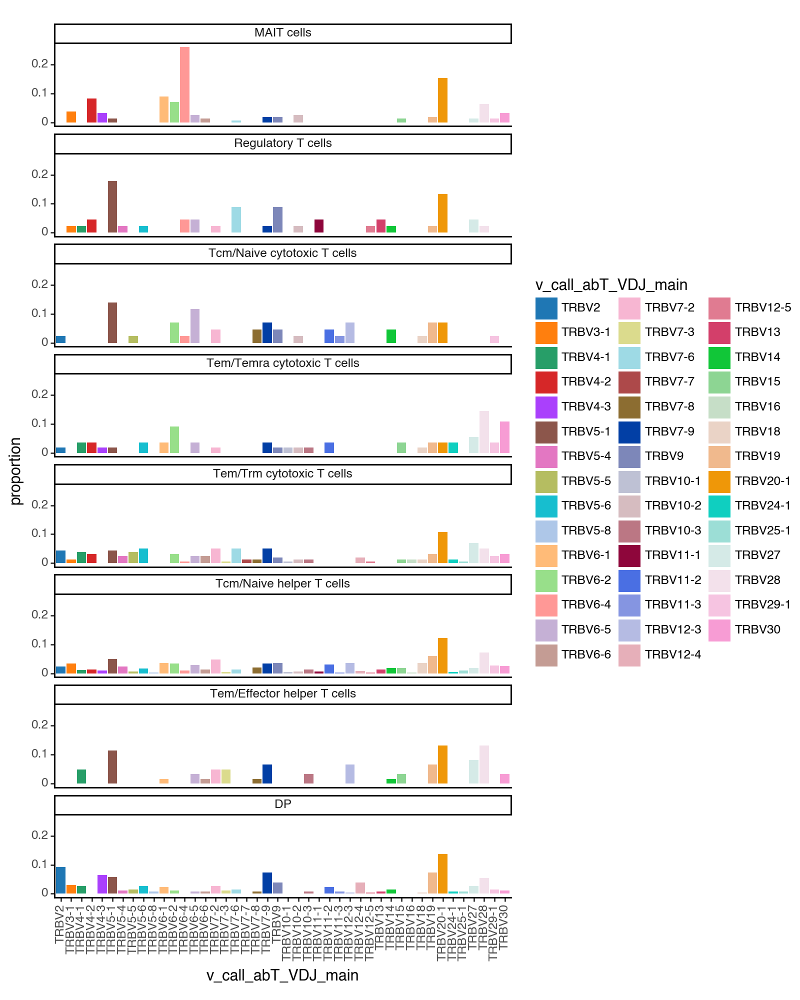

<Figure Size: (800 x 1000)>

In [176]:
options.figure_size = (8, 10)
(
    ggplot(
        working_df,
        aes(x="v_call_abT_VDJ_main", y="proportion", fill="v_call_abT_VDJ_main"),
    )
    + geom_bar(stat="identity")
    + facet_wrap("~celltypist_annotation", ncol=1)
    + scale_fill_manual(values=col_palette)
    + theme_classic()
    + theme(axis_text_x=element_text(angle=90))
)

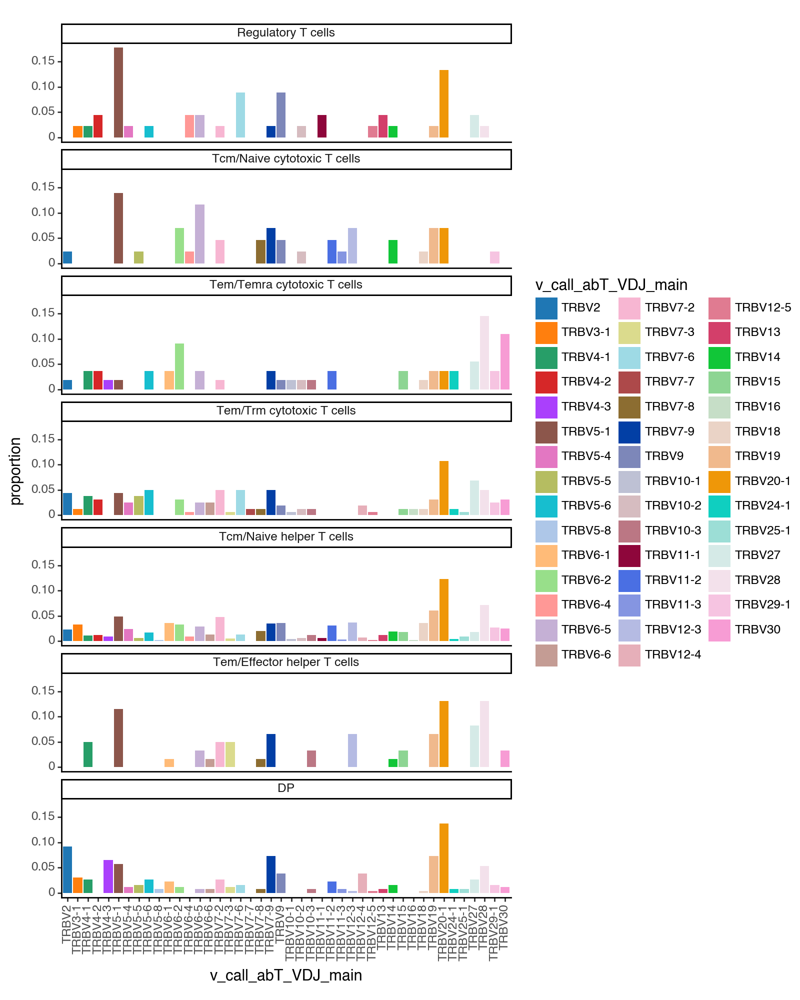

<Figure Size: (800 x 1000)>

In [177]:
options.figure_size = (8, 10)
(
    ggplot(
        working_df[working_df.celltypist_annotation != "MAIT cells"],
        aes(x="v_call_abT_VDJ_main", y="proportion", fill="v_call_abT_VDJ_main"),
    )
    + geom_bar(stat="identity")
    + facet_wrap("~celltypist_annotation", ncol=1)
    + scale_fill_manual(values=col_palette)
    + theme_classic()
    + theme(axis_text_x=element_text(angle=90))
)

#### now do for J chain (beta chain)

In [178]:
working_df = pd.DataFrame(adatax_single_expanded.obs.groupby("celltypist_annotation")["j_call_abT_VDJ_main"].value_counts())
working_df.columns =["counts"]
working_df.reset_index(inplace = True)
working_df

,celltypist_annotation,j_call_abT_VDJ_main,counts
0,DP,TRBJ2-7,54
1,DP,TRBJ2-1,37
2,DP,TRBJ1-1,29
3,DP,TRBJ2-3,27
4,DP,TRBJ2-5,27
...,...,...,...
99,Tem/Trm cytotoxic T cells,TRBJ1-4,4
100,Tem/Trm cytotoxic T cells,TRBJ1-3,3
101,Tem/Trm cytotoxic T cells,TRBJ1-5,3
102,Tem/Trm cytotoxic T cells,TRBJ2-4,1


In [179]:
# get total cell counts
total_count_dict = {}
for x in working_df.celltypist_annotation.unique():
    tmp = working_df[working_df["celltypist_annotation"] == x]
    total_count_dict[x] = tmp["counts"].sum()
total_count_dict

{'DP': 261,
 'MAIT cells': 157,
 'Regulatory T cells': 45,
 'Tcm/Naive cytotoxic T cells': 43,
 'Tcm/Naive helper T cells': 959,
 'Tem/Effector helper T cells': 61,
 'Tem/Temra cytotoxic T cells': 55,
 'Tem/Trm cytotoxic T cells': 159}

In [180]:
# work out proportion
working_df["proportion"] = 0
# normalise to total
for i, row in working_df.iterrows():
    try:
        working_df.at[i, "proportion"] = row["counts"] / total_count_dict[row["celltypist_annotation"]]
    except:
        pass

In [186]:
working_df

,celltypist_annotation,j_call_abT_VDJ_main,counts,proportion
0,DP,TRBJ2-7,54,0.206897
1,DP,TRBJ2-1,37,0.141762
2,DP,TRBJ1-1,29,0.111111
3,DP,TRBJ2-3,27,0.103448
4,DP,TRBJ2-5,27,0.103448
...,...,...,...,...
99,Tem/Trm cytotoxic T cells,TRBJ1-4,4,0.025157
100,Tem/Trm cytotoxic T cells,TRBJ1-3,3,0.018868
101,Tem/Trm cytotoxic T cells,TRBJ1-5,3,0.018868
102,Tem/Trm cytotoxic T cells,TRBJ2-4,1,0.006289


In [182]:
#reorder
working_df["celltypist_annotation"] = working_df[
    "celltypist_annotation"
].cat.reorder_categories(
    [
        "MAIT cells",
        "Regulatory T cells",
        "Tcm/Naive cytotoxic T cells",
        "Tem/Temra cytotoxic T cells",
        "Tem/Trm cytotoxic T cells",
        "Tcm/Naive helper T cells",
        "Tem/Effector helper T cells",
        "DP",
    ]
)

In [183]:
from plotnine import ggplot, aes, facet_grid, geom_bar, theme_bw, facet_wrap, theme_classic, options, theme, element_text, scale_fill_manual

In [184]:
from scanpy.plotting.palettes import default_20, default_28

col_palette = default_20 + default_28
col_palette

['#1f77b4',
 '#ff7f0e',
 '#279e68',
 '#d62728',
 '#aa40fc',
 '#8c564b',
 '#e377c2',
 '#b5bd61',
 '#17becf',
 '#aec7e8',
 '#ffbb78',
 '#98df8a',
 '#ff9896',
 '#c5b0d5',
 '#c49c94',
 '#f7b6d2',
 '#dbdb8d',
 '#9edae5',
 '#ad494a',
 '#8c6d31',
 '#023fa5',
 '#7d87b9',
 '#bec1d4',
 '#d6bcc0',
 '#bb7784',
 '#8e063b',
 '#4a6fe3',
 '#8595e1',
 '#b5bbe3',
 '#e6afb9',
 '#e07b91',
 '#d33f6a',
 '#11c638',
 '#8dd593',
 '#c6dec7',
 '#ead3c6',
 '#f0b98d',
 '#ef9708',
 '#0fcfc0',
 '#9cded6',
 '#d5eae7',
 '#f3e1eb',
 '#f6c4e1',
 '#f79cd4',
 '#7f7f7f',
 '#c7c7c7',
 '#1CE6FF',
 '#336600']

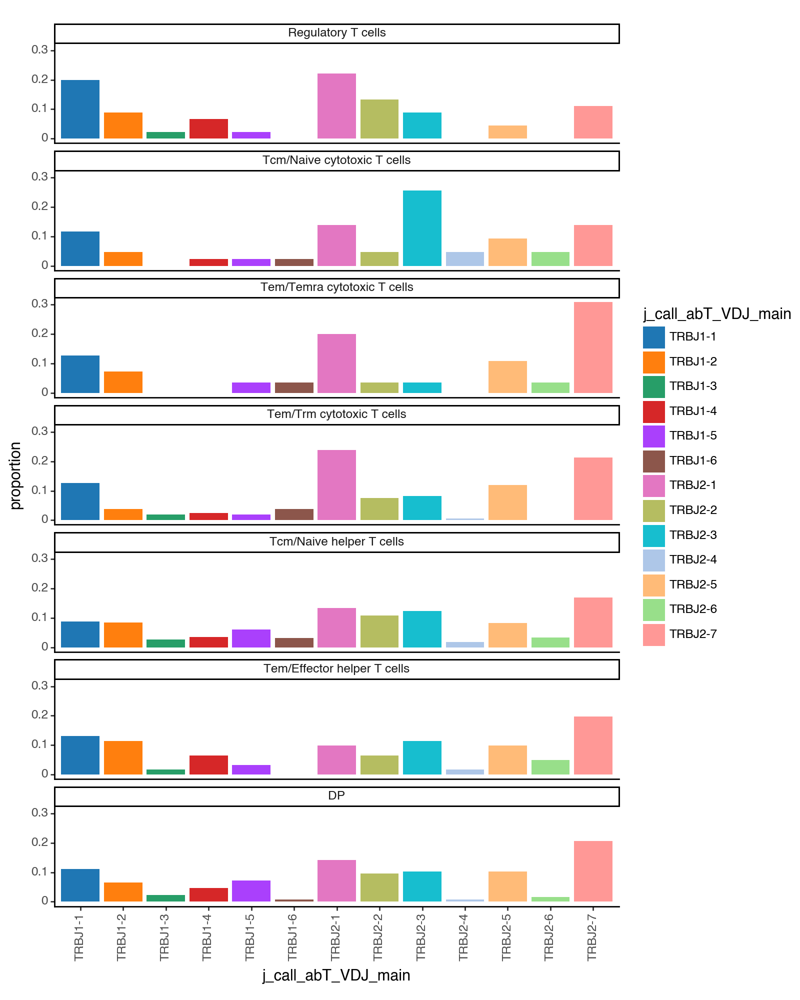

<Figure Size: (800 x 1000)>

In [185]:
# remove MAIT cells
options.figure_size = (8, 10)
(
    ggplot(
        working_df[working_df.celltypist_annotation != "MAIT cells"],
        aes(x="j_call_abT_VDJ_main", y="proportion", fill="j_call_abT_VDJ_main"),
    )
    + geom_bar(stat="identity")
    + facet_wrap("~celltypist_annotation", ncol=1)
    + scale_fill_manual(values=col_palette)
    + theme_classic()
    + theme(axis_text_x=element_text(angle=90))
)

#### V chain (alpha chain)

In [187]:
working_df = pd.DataFrame(adatax_single_expanded.obs.groupby("celltypist_annotation")["v_call_abT_VJ_main"].value_counts())
working_df.columns =["counts"]
working_df.reset_index(inplace = True)
working_df

,celltypist_annotation,v_call_abT_VJ_main,counts
0,DP,TRAV19,26
1,DP,TRAV20,21
2,DP,TRAV12-2,19
3,DP,TRAV29/DV5,18
4,DP,TRAV21,16
...,...,...,...
331,Tem/Trm cytotoxic T cells,TRAV4,0
332,Tem/Trm cytotoxic T cells,TRAV34,0
333,Tem/Trm cytotoxic T cells,TRAV35,0
334,Tem/Trm cytotoxic T cells,TRAV36/DV7,0


In [188]:
# get total cell counts
total_count_dict = {}
for x in working_df.celltypist_annotation.unique():
    tmp = working_df[working_df["celltypist_annotation"] == x]
    total_count_dict[x] = tmp["counts"].sum()
total_count_dict

{'DP': 261,
 'MAIT cells': 157,
 'Regulatory T cells': 45,
 'Tcm/Naive cytotoxic T cells': 43,
 'Tcm/Naive helper T cells': 959,
 'Tem/Effector helper T cells': 61,
 'Tem/Temra cytotoxic T cells': 55,
 'Tem/Trm cytotoxic T cells': 159}

In [189]:
# work out proportion
working_df["proportion"] = 0
# normalise to total
for i, row in working_df.iterrows():
    try:
        working_df.at[i, "proportion"] = row["counts"] / total_count_dict[row["celltypist_annotation"]]
    except:
        pass

In [190]:
working_df

,celltypist_annotation,v_call_abT_VJ_main,counts,proportion
0,DP,TRAV19,26,0.099617
1,DP,TRAV20,21,0.080460
2,DP,TRAV12-2,19,0.072797
3,DP,TRAV29/DV5,18,0.068966
4,DP,TRAV21,16,0.061303
...,...,...,...,...
331,Tem/Trm cytotoxic T cells,TRAV4,0,0.000000
332,Tem/Trm cytotoxic T cells,TRAV34,0,0.000000
333,Tem/Trm cytotoxic T cells,TRAV35,0,0.000000
334,Tem/Trm cytotoxic T cells,TRAV36/DV7,0,0.000000


In [192]:
#reorder
working_df["celltypist_annotation"] = working_df[
    "celltypist_annotation"
].cat.reorder_categories(
    [
        "MAIT cells",
        "Regulatory T cells",
        "Tcm/Naive cytotoxic T cells",
        "Tem/Temra cytotoxic T cells",
        "Tem/Trm cytotoxic T cells",
        "Tcm/Naive helper T cells",
        "Tem/Effector helper T cells",
        "DP",
    ]
)

In [193]:
from plotnine import ggplot, aes, facet_grid, geom_bar, theme_bw, facet_wrap, theme_classic, options, theme, element_text, scale_fill_manual

In [194]:
from scanpy.plotting.palettes import default_20, default_28

col_palette = default_20 + default_28
col_palette

['#1f77b4',
 '#ff7f0e',
 '#279e68',
 '#d62728',
 '#aa40fc',
 '#8c564b',
 '#e377c2',
 '#b5bd61',
 '#17becf',
 '#aec7e8',
 '#ffbb78',
 '#98df8a',
 '#ff9896',
 '#c5b0d5',
 '#c49c94',
 '#f7b6d2',
 '#dbdb8d',
 '#9edae5',
 '#ad494a',
 '#8c6d31',
 '#023fa5',
 '#7d87b9',
 '#bec1d4',
 '#d6bcc0',
 '#bb7784',
 '#8e063b',
 '#4a6fe3',
 '#8595e1',
 '#b5bbe3',
 '#e6afb9',
 '#e07b91',
 '#d33f6a',
 '#11c638',
 '#8dd593',
 '#c6dec7',
 '#ead3c6',
 '#f0b98d',
 '#ef9708',
 '#0fcfc0',
 '#9cded6',
 '#d5eae7',
 '#f3e1eb',
 '#f6c4e1',
 '#f79cd4',
 '#7f7f7f',
 '#c7c7c7',
 '#1CE6FF',
 '#336600']

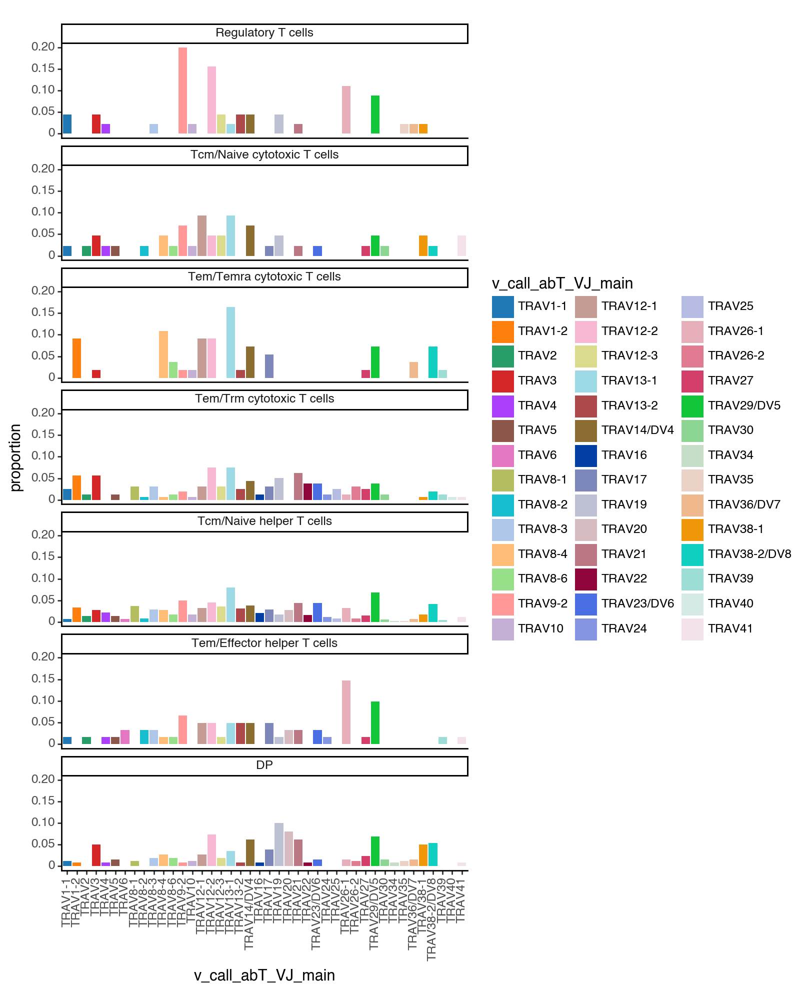

<Figure Size: (800 x 1000)>

In [195]:
# remove MAIT cells
options.figure_size = (8, 10)
(
    ggplot(
        working_df[working_df.celltypist_annotation != "MAIT cells"],
        aes(x="v_call_abT_VJ_main", y="proportion", fill="v_call_abT_VJ_main"),
    )
    + geom_bar(stat="identity")
    + facet_wrap("~celltypist_annotation", ncol=1)
    + scale_fill_manual(values=col_palette)
    + theme_classic()
    + theme(axis_text_x=element_text(angle=90))
)

### J gene (alpha chain)

In [196]:
working_df = pd.DataFrame(adatax_single_expanded.obs.groupby("celltypist_annotation")["j_call_abT_VJ_main"].value_counts())
working_df.columns =["counts"]
working_df.reset_index(inplace = True)
working_df

,celltypist_annotation,j_call_abT_VJ_main,counts
0,DP,TRAJ43,13
1,DP,TRAJ33,13
2,DP,TRAJ49,12
3,DP,TRAJ20,12
4,DP,TRAJ52,11
...,...,...,...
411,Tem/Trm cytotoxic T cells,TRAJ38,0
412,Tem/Trm cytotoxic T cells,TRAJ8,0
413,Tem/Trm cytotoxic T cells,TRAJ7,0
414,Tem/Trm cytotoxic T cells,TRAJ57,0


In [197]:
# get total cell counts
total_count_dict = {}
for x in working_df.celltypist_annotation.unique():
    tmp = working_df[working_df["celltypist_annotation"] == x]
    total_count_dict[x] = tmp["counts"].sum()
total_count_dict

{'DP': 261,
 'MAIT cells': 157,
 'Regulatory T cells': 45,
 'Tcm/Naive cytotoxic T cells': 43,
 'Tcm/Naive helper T cells': 959,
 'Tem/Effector helper T cells': 61,
 'Tem/Temra cytotoxic T cells': 55,
 'Tem/Trm cytotoxic T cells': 159}

In [198]:
# work out proportion
working_df["proportion"] = 0
# normalise to total
for i, row in working_df.iterrows():
    try:
        working_df.at[i, "proportion"] = row["counts"] / total_count_dict[row["celltypist_annotation"]]
    except:
        pass

In [199]:
working_df

,celltypist_annotation,j_call_abT_VJ_main,counts,proportion
0,DP,TRAJ43,13,0.049808
1,DP,TRAJ33,13,0.049808
2,DP,TRAJ49,12,0.045977
3,DP,TRAJ20,12,0.045977
4,DP,TRAJ52,11,0.042146
...,...,...,...,...
411,Tem/Trm cytotoxic T cells,TRAJ38,0,0.000000
412,Tem/Trm cytotoxic T cells,TRAJ8,0,0.000000
413,Tem/Trm cytotoxic T cells,TRAJ7,0,0.000000
414,Tem/Trm cytotoxic T cells,TRAJ57,0,0.000000


In [200]:
#reorder
working_df["celltypist_annotation"] = working_df[
    "celltypist_annotation"
].cat.reorder_categories(
    [
        "MAIT cells",
        "Regulatory T cells",
        "Tcm/Naive cytotoxic T cells",
        "Tem/Temra cytotoxic T cells",
        "Tem/Trm cytotoxic T cells",
        "Tcm/Naive helper T cells",
        "Tem/Effector helper T cells",
        "DP",
    ]
)

In [201]:
from plotnine import ggplot, aes, facet_grid, geom_bar, theme_bw, facet_wrap, theme_classic, options, theme, element_text, scale_fill_manual

In [202]:
from scanpy.plotting.palettes import default_20, default_28

col_palette = default_20 + default_28
col_palette

['#1f77b4',
 '#ff7f0e',
 '#279e68',
 '#d62728',
 '#aa40fc',
 '#8c564b',
 '#e377c2',
 '#b5bd61',
 '#17becf',
 '#aec7e8',
 '#ffbb78',
 '#98df8a',
 '#ff9896',
 '#c5b0d5',
 '#c49c94',
 '#f7b6d2',
 '#dbdb8d',
 '#9edae5',
 '#ad494a',
 '#8c6d31',
 '#023fa5',
 '#7d87b9',
 '#bec1d4',
 '#d6bcc0',
 '#bb7784',
 '#8e063b',
 '#4a6fe3',
 '#8595e1',
 '#b5bbe3',
 '#e6afb9',
 '#e07b91',
 '#d33f6a',
 '#11c638',
 '#8dd593',
 '#c6dec7',
 '#ead3c6',
 '#f0b98d',
 '#ef9708',
 '#0fcfc0',
 '#9cded6',
 '#d5eae7',
 '#f3e1eb',
 '#f6c4e1',
 '#f79cd4',
 '#7f7f7f',
 '#c7c7c7',
 '#1CE6FF',
 '#336600']

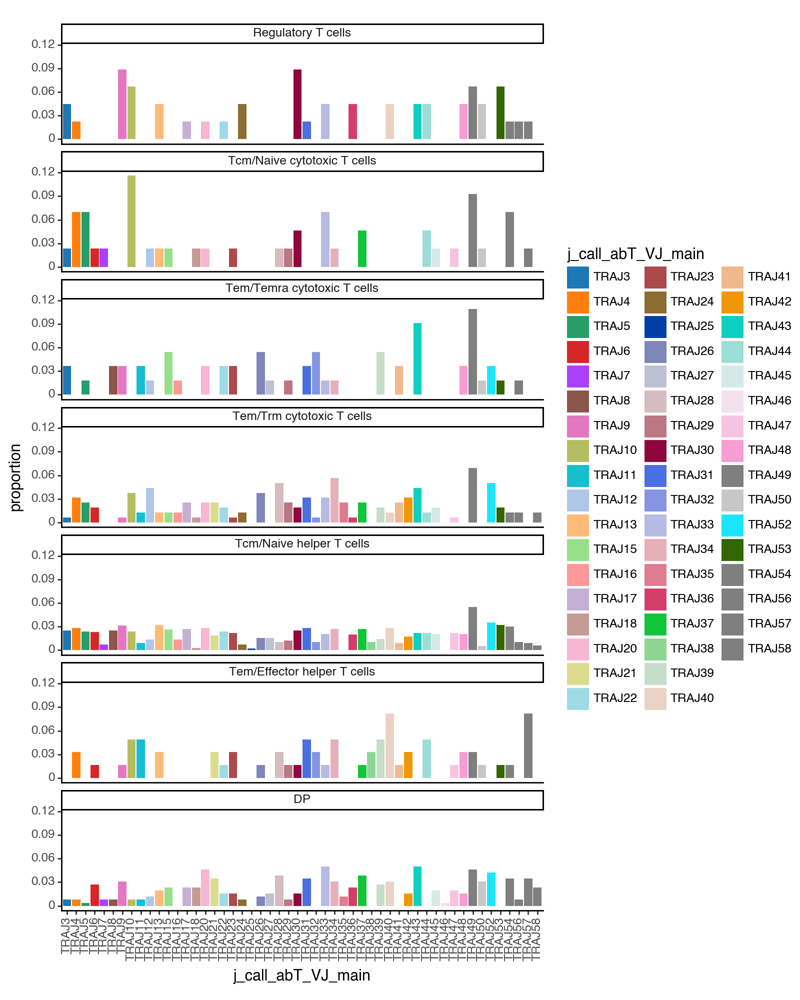

<Figure Size: (800 x 1000)>

In [203]:
# remove MAIT cells
options.figure_size = (8, 10)
(
    ggplot(
        working_df[working_df.celltypist_annotation != "MAIT cells"],
        aes(x="j_call_abT_VJ_main", y="proportion", fill="j_call_abT_VJ_main"),
    )
    + geom_bar(stat="identity")
    + facet_wrap("~celltypist_annotation", ncol=1)
    + scale_fill_manual(values=col_palette)
    + theme_classic()
    + theme(axis_text_x=element_text(angle=90))
)

## NOW DO FOR NON-EXPANDED

In [206]:
# first take all expanded clones... 
adatax_single_noexpanded = adatax_single[adatax_single.obs['clone_id_size_max_3'] == '1']
adatax_single_noexpanded

View of AnnData object with n_obs × n_vars = 19483 × 2285
    obs: 'sample', 'sort_type', 'donor', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'scrublet_score', 'n_genes', 'gmm_pct_count_clusters_keep', 'is_doublet', 'filter_rna', 'batch', 'CD4/CD8_geneset', 'leiden', 'celltypist_majority_voting', 'celltypist_annotation', 'has_contig', 'filter_contig_quality', 'filter_contig_VDJ', 'filter_contig_VJ', 'contig_QC_pass', 'filter_contig', 'clone_id', 'clone_id_by_size', 'locus_VDJ', 'locus_VJ', 'productive_VDJ', 'productive_VJ', 'v_call_VDJ', 'd_call_VDJ', 'j_call_VDJ', 'v_call_VJ', 'j_call_VJ', 'c_call_VDJ', 'c_call_VJ', 'junction_VDJ', 'junction_VJ', 'junction_aa_VDJ', 'junction_aa_VJ', 'v_call_abT_VDJ', 'd_call_abT_VDJ', 'j_call_abT_VDJ', 'v_call_abT_VJ', 'j_call_abT_VJ', 'c_call_abT_VDJ', 'c_call_abT_VJ', 'productive_abT_VDJ', 'productive_abT_VJ', 'duplicate_count_abT_VDJ', 'duplicate_count_abT_VJ', 'v_call_VDJ_main', 'v_call_VJ_main', 'd_call_VDJ_main', 'j

#### V chain (beta chain)

In [207]:
working_df = pd.DataFrame(adatax_single_noexpanded.obs.groupby("celltypist_annotation")["v_call_abT_VDJ_main"].value_counts())
working_df.columns =["counts"]
working_df.reset_index(inplace = True)
working_df

,celltypist_annotation,v_call_abT_VDJ_main,counts
0,DP,TRBV7-9,134
1,DP,TRBV20-1,120
2,DP,TRBV19,111
3,DP,TRBV9,101
4,DP,TRBV28,94
...,...,...,...
371,Tem/Trm cytotoxic T cells,TRBV16,0
372,Tem/Trm cytotoxic T cells,TRBV7-7,0
373,Tem/Trm cytotoxic T cells,TRBV7-4,0
374,Tem/Trm cytotoxic T cells,TRBV6-7,0


In [208]:
# get total cell counts
total_count_dict = {}
for x in working_df.celltypist_annotation.unique():
    tmp = working_df[working_df["celltypist_annotation"] == x]
    total_count_dict[x] = tmp["counts"].sum()
total_count_dict

{'DP': 1658,
 'MAIT cells': 540,
 'Regulatory T cells': 322,
 'Tcm/Naive cytotoxic T cells': 3459,
 'Tcm/Naive helper T cells': 12121,
 'Tem/Effector helper T cells': 417,
 'Tem/Temra cytotoxic T cells': 184,
 'Tem/Trm cytotoxic T cells': 782}

In [209]:
# work out proportion
working_df["proportion"] = 0
# normalise to total
for i, row in working_df.iterrows():
    try:
        working_df.at[i, "proportion"] = row["counts"] / total_count_dict[row["celltypist_annotation"]]
    except:
        pass

In [210]:
working_df

,celltypist_annotation,v_call_abT_VDJ_main,counts,proportion
0,DP,TRBV7-9,134,0.080820
1,DP,TRBV20-1,120,0.072376
2,DP,TRBV19,111,0.066948
3,DP,TRBV9,101,0.060917
4,DP,TRBV28,94,0.056695
...,...,...,...,...
371,Tem/Trm cytotoxic T cells,TRBV16,0,0.000000
372,Tem/Trm cytotoxic T cells,TRBV7-7,0,0.000000
373,Tem/Trm cytotoxic T cells,TRBV7-4,0,0.000000
374,Tem/Trm cytotoxic T cells,TRBV6-7,0,0.000000


In [211]:
#reorder
working_df["celltypist_annotation"] = working_df[
    "celltypist_annotation"
].cat.reorder_categories(
    [
        "MAIT cells",
        "Regulatory T cells",
        "Tcm/Naive cytotoxic T cells",
        "Tem/Temra cytotoxic T cells",
        "Tem/Trm cytotoxic T cells",
        "Tcm/Naive helper T cells",
        "Tem/Effector helper T cells",
        "DP",
    ]
)

In [212]:
from plotnine import ggplot, aes, facet_grid, geom_bar, theme_bw, facet_wrap, theme_classic, options, theme, element_text, scale_fill_manual

In [213]:
from scanpy.plotting.palettes import default_20, default_28

col_palette = default_20 + default_28
col_palette

['#1f77b4',
 '#ff7f0e',
 '#279e68',
 '#d62728',
 '#aa40fc',
 '#8c564b',
 '#e377c2',
 '#b5bd61',
 '#17becf',
 '#aec7e8',
 '#ffbb78',
 '#98df8a',
 '#ff9896',
 '#c5b0d5',
 '#c49c94',
 '#f7b6d2',
 '#dbdb8d',
 '#9edae5',
 '#ad494a',
 '#8c6d31',
 '#023fa5',
 '#7d87b9',
 '#bec1d4',
 '#d6bcc0',
 '#bb7784',
 '#8e063b',
 '#4a6fe3',
 '#8595e1',
 '#b5bbe3',
 '#e6afb9',
 '#e07b91',
 '#d33f6a',
 '#11c638',
 '#8dd593',
 '#c6dec7',
 '#ead3c6',
 '#f0b98d',
 '#ef9708',
 '#0fcfc0',
 '#9cded6',
 '#d5eae7',
 '#f3e1eb',
 '#f6c4e1',
 '#f79cd4',
 '#7f7f7f',
 '#c7c7c7',
 '#1CE6FF',
 '#336600']

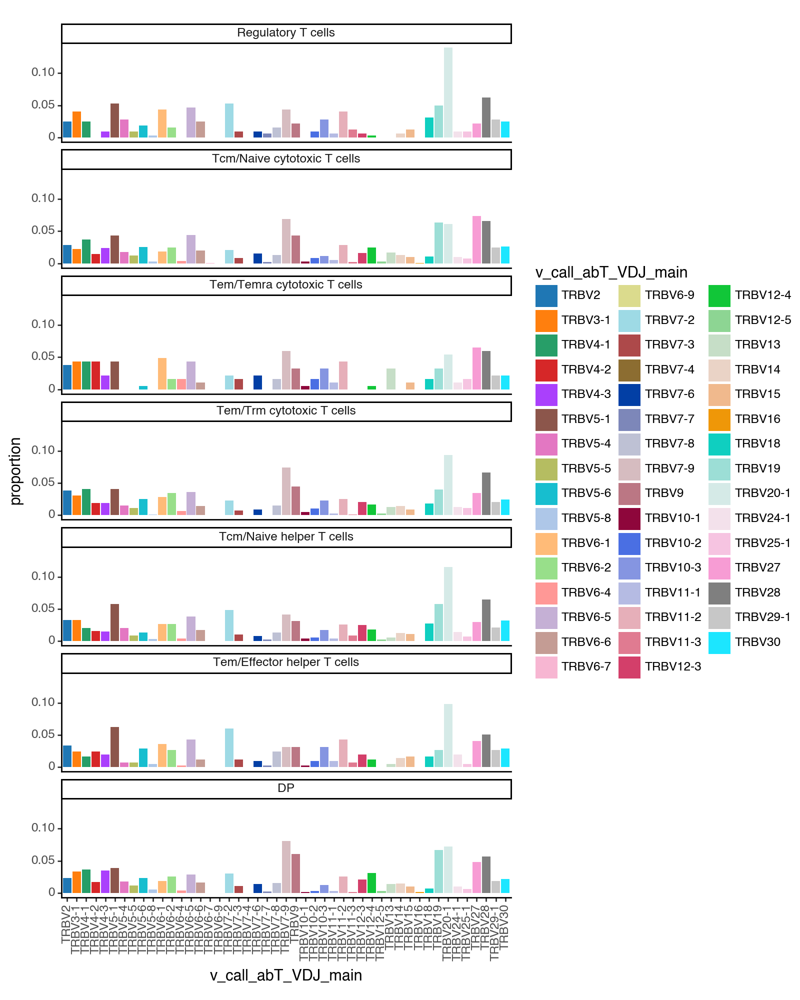

<Figure Size: (800 x 1000)>

In [214]:
# remove MAIT cells
options.figure_size = (8, 10)
(
    ggplot(
        working_df[working_df.celltypist_annotation != "MAIT cells"],
        aes(x="v_call_abT_VDJ_main", y="proportion", fill="v_call_abT_VDJ_main"),
    )
    + geom_bar(stat="identity")
    + facet_wrap("~celltypist_annotation", ncol=1)
    + scale_fill_manual(values=col_palette)
    + theme_classic()
    + theme(axis_text_x=element_text(angle=90))
)

#### J gene (beta chain)

In [215]:
working_df = pd.DataFrame(adatax_single_noexpanded.obs.groupby("celltypist_annotation")["j_call_abT_VDJ_main"].value_counts())
working_df.columns =["counts"]
working_df.reset_index(inplace = True)
working_df

,celltypist_annotation,j_call_abT_VDJ_main,counts
0,DP,TRBJ2-7,296
1,DP,TRBJ2-1,265
2,DP,TRBJ1-1,235
3,DP,TRBJ2-3,162
4,DP,TRBJ1-2,151
...,...,...,...
99,Tem/Trm cytotoxic T cells,TRBJ1-4,19
100,Tem/Trm cytotoxic T cells,TRBJ1-3,16
101,Tem/Trm cytotoxic T cells,TRBJ1-6,16
102,Tem/Trm cytotoxic T cells,TRBJ2-6,14


In [216]:
# get total cell counts
total_count_dict = {}
for x in working_df.celltypist_annotation.unique():
    tmp = working_df[working_df["celltypist_annotation"] == x]
    total_count_dict[x] = tmp["counts"].sum()
total_count_dict

{'DP': 1658,
 'MAIT cells': 540,
 'Regulatory T cells': 322,
 'Tcm/Naive cytotoxic T cells': 3459,
 'Tcm/Naive helper T cells': 12121,
 'Tem/Effector helper T cells': 417,
 'Tem/Temra cytotoxic T cells': 184,
 'Tem/Trm cytotoxic T cells': 782}

In [217]:
# work out proportion
working_df["proportion"] = 0
# normalise to total
for i, row in working_df.iterrows():
    try:
        working_df.at[i, "proportion"] = row["counts"] / total_count_dict[row["celltypist_annotation"]]
    except:
        pass

In [218]:
working_df

,celltypist_annotation,j_call_abT_VDJ_main,counts,proportion
0,DP,TRBJ2-7,296,0.178528
1,DP,TRBJ2-1,265,0.159831
2,DP,TRBJ1-1,235,0.141737
3,DP,TRBJ2-3,162,0.097708
4,DP,TRBJ1-2,151,0.091074
...,...,...,...,...
99,Tem/Trm cytotoxic T cells,TRBJ1-4,19,0.024297
100,Tem/Trm cytotoxic T cells,TRBJ1-3,16,0.020460
101,Tem/Trm cytotoxic T cells,TRBJ1-6,16,0.020460
102,Tem/Trm cytotoxic T cells,TRBJ2-6,14,0.017903


In [219]:
#reorder
working_df["celltypist_annotation"] = working_df[
    "celltypist_annotation"
].cat.reorder_categories(
    [
        "MAIT cells",
        "Regulatory T cells",
        "Tcm/Naive cytotoxic T cells",
        "Tem/Temra cytotoxic T cells",
        "Tem/Trm cytotoxic T cells",
        "Tcm/Naive helper T cells",
        "Tem/Effector helper T cells",
        "DP",
    ]
)

In [220]:
from plotnine import ggplot, aes, facet_grid, geom_bar, theme_bw, facet_wrap, theme_classic, options, theme, element_text, scale_fill_manual

In [221]:
from scanpy.plotting.palettes import default_20, default_28

col_palette = default_20 + default_28
col_palette

['#1f77b4',
 '#ff7f0e',
 '#279e68',
 '#d62728',
 '#aa40fc',
 '#8c564b',
 '#e377c2',
 '#b5bd61',
 '#17becf',
 '#aec7e8',
 '#ffbb78',
 '#98df8a',
 '#ff9896',
 '#c5b0d5',
 '#c49c94',
 '#f7b6d2',
 '#dbdb8d',
 '#9edae5',
 '#ad494a',
 '#8c6d31',
 '#023fa5',
 '#7d87b9',
 '#bec1d4',
 '#d6bcc0',
 '#bb7784',
 '#8e063b',
 '#4a6fe3',
 '#8595e1',
 '#b5bbe3',
 '#e6afb9',
 '#e07b91',
 '#d33f6a',
 '#11c638',
 '#8dd593',
 '#c6dec7',
 '#ead3c6',
 '#f0b98d',
 '#ef9708',
 '#0fcfc0',
 '#9cded6',
 '#d5eae7',
 '#f3e1eb',
 '#f6c4e1',
 '#f79cd4',
 '#7f7f7f',
 '#c7c7c7',
 '#1CE6FF',
 '#336600']

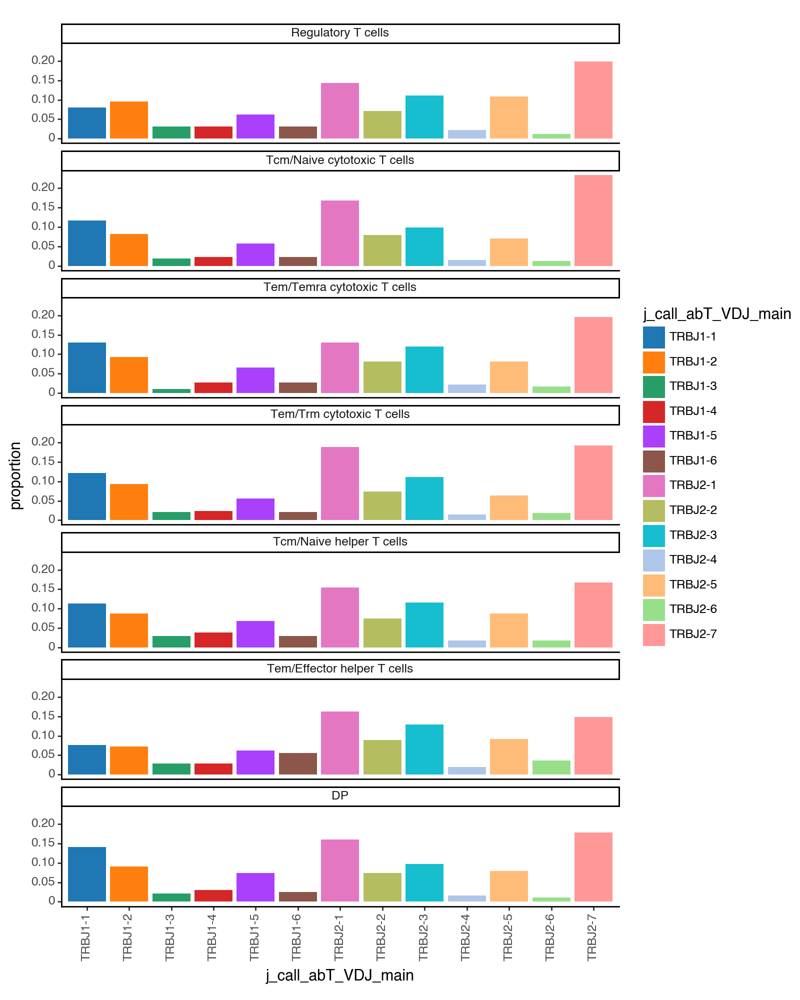

<Figure Size: (800 x 1000)>

In [222]:
# remove MAIT cells
options.figure_size = (8, 10)
(
    ggplot(
        working_df[working_df.celltypist_annotation != "MAIT cells"],
        aes(x="j_call_abT_VDJ_main", y="proportion", fill="j_call_abT_VDJ_main"),
    )
    + geom_bar(stat="identity")
    + facet_wrap("~celltypist_annotation", ncol=1)
    + scale_fill_manual(values=col_palette)
    + theme_classic()
    + theme(axis_text_x=element_text(angle=90))
)

#### V gene (alpha chain)

In [223]:
working_df = pd.DataFrame(adatax_single_noexpanded.obs.groupby("celltypist_annotation")["v_call_abT_VJ_main"].value_counts())
working_df.columns =["counts"]
working_df.reset_index(inplace = True)
working_df

,celltypist_annotation,v_call_abT_VJ_main,counts
0,DP,TRAV12-2,158
1,DP,TRAV29/DV5,95
2,DP,TRAV14/DV4,94
3,DP,TRAV38-2/DV8,86
4,DP,TRAV19,85
...,...,...,...
347,Tem/Trm cytotoxic T cells,TRAV40,4
348,Tem/Trm cytotoxic T cells,TRAV35,3
349,Tem/Trm cytotoxic T cells,TRAV34,1
350,Tem/Trm cytotoxic T cells,TRAV9-1,1


In [224]:
# get total cell counts
total_count_dict = {}
for x in working_df.celltypist_annotation.unique():
    tmp = working_df[working_df["celltypist_annotation"] == x]
    total_count_dict[x] = tmp["counts"].sum()
total_count_dict

{'DP': 1658,
 'MAIT cells': 540,
 'Regulatory T cells': 322,
 'Tcm/Naive cytotoxic T cells': 3459,
 'Tcm/Naive helper T cells': 12121,
 'Tem/Effector helper T cells': 417,
 'Tem/Temra cytotoxic T cells': 184,
 'Tem/Trm cytotoxic T cells': 782}

In [225]:
# work out proportion
working_df["proportion"] = 0
# normalise to total
for i, row in working_df.iterrows():
    try:
        working_df.at[i, "proportion"] = row["counts"] / total_count_dict[row["celltypist_annotation"]]
    except:
        pass

In [226]:
working_df

,celltypist_annotation,v_call_abT_VJ_main,counts,proportion
0,DP,TRAV12-2,158,0.095296
1,DP,TRAV29/DV5,95,0.057298
2,DP,TRAV14/DV4,94,0.056695
3,DP,TRAV38-2/DV8,86,0.051870
4,DP,TRAV19,85,0.051267
...,...,...,...,...
347,Tem/Trm cytotoxic T cells,TRAV40,4,0.005115
348,Tem/Trm cytotoxic T cells,TRAV35,3,0.003836
349,Tem/Trm cytotoxic T cells,TRAV34,1,0.001279
350,Tem/Trm cytotoxic T cells,TRAV9-1,1,0.001279


In [227]:
#reorder
working_df["celltypist_annotation"] = working_df[
    "celltypist_annotation"
].cat.reorder_categories(
    [
        "MAIT cells",
        "Regulatory T cells",
        "Tcm/Naive cytotoxic T cells",
        "Tem/Temra cytotoxic T cells",
        "Tem/Trm cytotoxic T cells",
        "Tcm/Naive helper T cells",
        "Tem/Effector helper T cells",
        "DP",
    ]
)

In [228]:
from plotnine import ggplot, aes, facet_grid, geom_bar, theme_bw, facet_wrap, theme_classic, options, theme, element_text, scale_fill_manual

In [229]:
from scanpy.plotting.palettes import default_20, default_28

col_palette = default_20 + default_28
col_palette

['#1f77b4',
 '#ff7f0e',
 '#279e68',
 '#d62728',
 '#aa40fc',
 '#8c564b',
 '#e377c2',
 '#b5bd61',
 '#17becf',
 '#aec7e8',
 '#ffbb78',
 '#98df8a',
 '#ff9896',
 '#c5b0d5',
 '#c49c94',
 '#f7b6d2',
 '#dbdb8d',
 '#9edae5',
 '#ad494a',
 '#8c6d31',
 '#023fa5',
 '#7d87b9',
 '#bec1d4',
 '#d6bcc0',
 '#bb7784',
 '#8e063b',
 '#4a6fe3',
 '#8595e1',
 '#b5bbe3',
 '#e6afb9',
 '#e07b91',
 '#d33f6a',
 '#11c638',
 '#8dd593',
 '#c6dec7',
 '#ead3c6',
 '#f0b98d',
 '#ef9708',
 '#0fcfc0',
 '#9cded6',
 '#d5eae7',
 '#f3e1eb',
 '#f6c4e1',
 '#f79cd4',
 '#7f7f7f',
 '#c7c7c7',
 '#1CE6FF',
 '#336600']

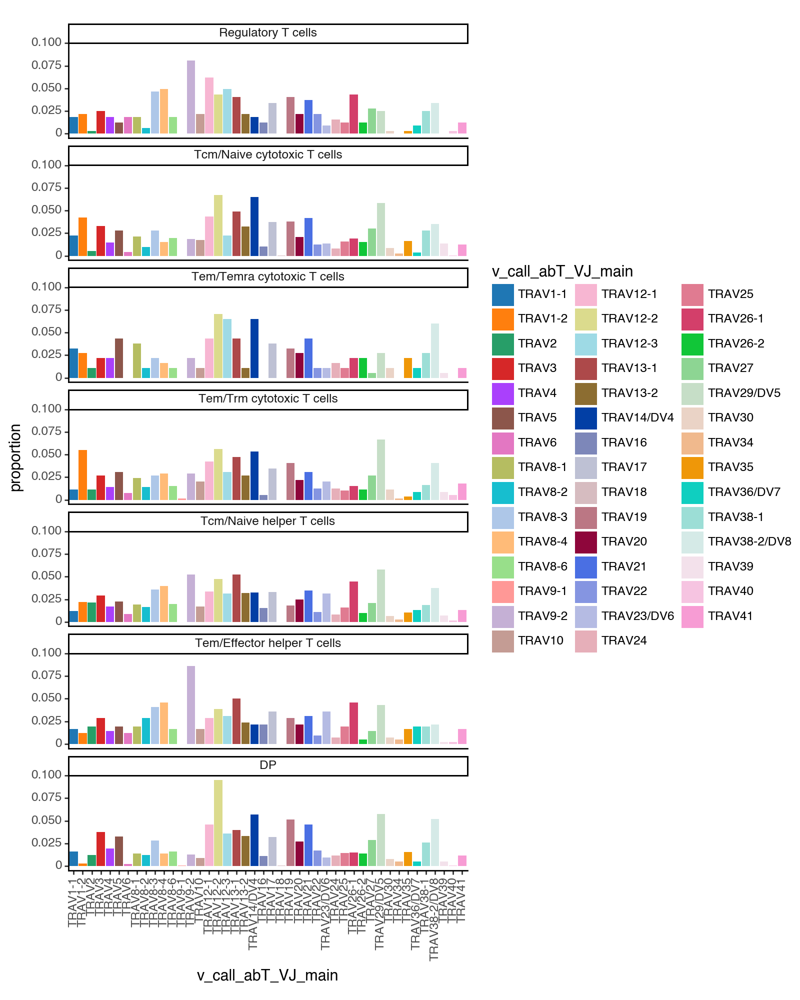

<Figure Size: (800 x 1000)>

In [231]:
# remove MAIT cells
options.figure_size = (8, 10)
(
    ggplot(
        working_df[working_df.celltypist_annotation != "MAIT cells"],
        aes(x="v_call_abT_VJ_main", y="proportion", fill="v_call_abT_VJ_main"),
    )
    + geom_bar(stat="identity")
    + facet_wrap("~celltypist_annotation", ncol=1)
    + scale_fill_manual(values=col_palette)
    + theme_classic()
    + theme(axis_text_x=element_text(angle=90))
)

#### J gene (alpha chain)

In [232]:
working_df = pd.DataFrame(adatax_single_noexpanded.obs.groupby("celltypist_annotation")["j_call_abT_VJ_main"].value_counts())
working_df.columns =["counts"]
working_df.reset_index(inplace = True)
working_df

,celltypist_annotation,j_call_abT_VJ_main,counts
0,DP,TRAJ40,73
1,DP,TRAJ20,69
2,DP,TRAJ43,64
3,DP,TRAJ49,60
4,DP,TRAJ30,51
...,...,...,...
419,Tem/Trm cytotoxic T cells,TRAJ35,4
420,Tem/Trm cytotoxic T cells,TRAJ50,2
421,Tem/Trm cytotoxic T cells,TRAJ46,0
422,Tem/Trm cytotoxic T cells,TRAJ25,0


In [233]:
# get total cell counts
total_count_dict = {}
for x in working_df.celltypist_annotation.unique():
    tmp = working_df[working_df["celltypist_annotation"] == x]
    total_count_dict[x] = tmp["counts"].sum()
total_count_dict

{'DP': 1658,
 'MAIT cells': 540,
 'Regulatory T cells': 322,
 'Tcm/Naive cytotoxic T cells': 3459,
 'Tcm/Naive helper T cells': 12121,
 'Tem/Effector helper T cells': 417,
 'Tem/Temra cytotoxic T cells': 184,
 'Tem/Trm cytotoxic T cells': 782}

In [234]:
# work out proportion
working_df["proportion"] = 0
# normalise to total
for i, row in working_df.iterrows():
    try:
        working_df.at[i, "proportion"] = row["counts"] / total_count_dict[row["celltypist_annotation"]]
    except:
        pass

In [235]:
working_df

,celltypist_annotation,j_call_abT_VJ_main,counts,proportion
0,DP,TRAJ40,73,0.044029
1,DP,TRAJ20,69,0.041616
2,DP,TRAJ43,64,0.038601
3,DP,TRAJ49,60,0.036188
4,DP,TRAJ30,51,0.030760
...,...,...,...,...
419,Tem/Trm cytotoxic T cells,TRAJ35,4,0.005115
420,Tem/Trm cytotoxic T cells,TRAJ50,2,0.002558
421,Tem/Trm cytotoxic T cells,TRAJ46,0,0.000000
422,Tem/Trm cytotoxic T cells,TRAJ25,0,0.000000


In [236]:
#reorder
working_df["celltypist_annotation"] = working_df[
    "celltypist_annotation"
].cat.reorder_categories(
    [
        "MAIT cells",
        "Regulatory T cells",
        "Tcm/Naive cytotoxic T cells",
        "Tem/Temra cytotoxic T cells",
        "Tem/Trm cytotoxic T cells",
        "Tcm/Naive helper T cells",
        "Tem/Effector helper T cells",
        "DP",
    ]
)

In [237]:
from plotnine import ggplot, aes, facet_grid, geom_bar, theme_bw, facet_wrap, theme_classic, options, theme, element_text, scale_fill_manual

In [238]:
from scanpy.plotting.palettes import default_20, default_28

col_palette = default_20 + default_28
col_palette

['#1f77b4',
 '#ff7f0e',
 '#279e68',
 '#d62728',
 '#aa40fc',
 '#8c564b',
 '#e377c2',
 '#b5bd61',
 '#17becf',
 '#aec7e8',
 '#ffbb78',
 '#98df8a',
 '#ff9896',
 '#c5b0d5',
 '#c49c94',
 '#f7b6d2',
 '#dbdb8d',
 '#9edae5',
 '#ad494a',
 '#8c6d31',
 '#023fa5',
 '#7d87b9',
 '#bec1d4',
 '#d6bcc0',
 '#bb7784',
 '#8e063b',
 '#4a6fe3',
 '#8595e1',
 '#b5bbe3',
 '#e6afb9',
 '#e07b91',
 '#d33f6a',
 '#11c638',
 '#8dd593',
 '#c6dec7',
 '#ead3c6',
 '#f0b98d',
 '#ef9708',
 '#0fcfc0',
 '#9cded6',
 '#d5eae7',
 '#f3e1eb',
 '#f6c4e1',
 '#f79cd4',
 '#7f7f7f',
 '#c7c7c7',
 '#1CE6FF',
 '#336600']

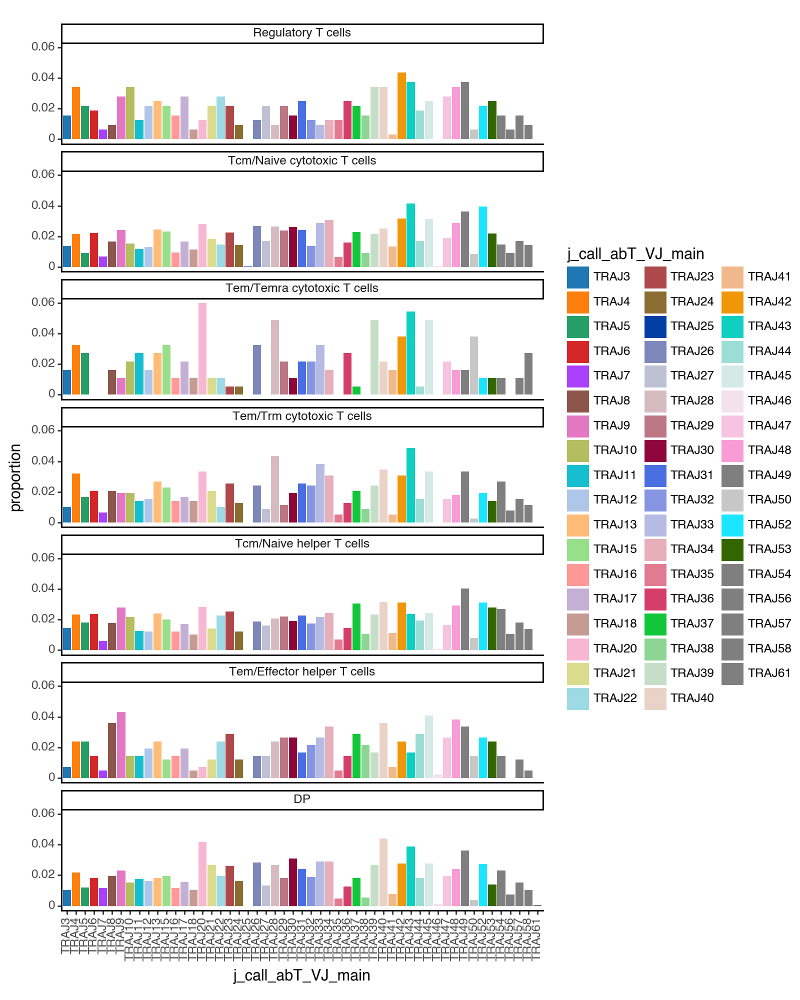

<Figure Size: (800 x 1000)>

In [239]:
# remove MAIT cells
options.figure_size = (8, 10)
(
    ggplot(
        working_df[working_df.celltypist_annotation != "MAIT cells"],
        aes(x="j_call_abT_VJ_main", y="proportion", fill="j_call_abT_VJ_main"),
    )
    + geom_bar(stat="identity")
    + facet_wrap("~celltypist_annotation", ncol=1)
    + scale_fill_manual(values=col_palette)
    + theme_classic()
    + theme(axis_text_x=element_text(angle=90))
)

## NOW DO FOR EVERYTHING SINGLE-CHAIN

#### V gene (beta chain)

In [242]:
# this dataset has both expanded + non-expanded
working_df = pd.DataFrame(adatax_single.obs.groupby("celltypist_annotation")["v_call_abT_VDJ_main"].value_counts())
working_df.columns =["counts"]
working_df.reset_index(inplace = True)
working_df

,celltypist_annotation,v_call_abT_VDJ_main,counts
0,DP,TRBV20-1,295
1,DP,TRBV7-9,198
2,DP,TRBV19,190
3,DP,TRBV5-5,176
4,DP,TRBV28,162
...,...,...,...
371,Tem/Trm cytotoxic T cells,TRBV11-1,2
372,Tem/Trm cytotoxic T cells,TRBV5-8,1
373,Tem/Trm cytotoxic T cells,TRBV7-4,0
374,Tem/Trm cytotoxic T cells,TRBV6-9,0


In [243]:
# get total cell counts
total_count_dict = {}
for x in working_df.celltypist_annotation.unique():
    tmp = working_df[working_df["celltypist_annotation"] == x]
    total_count_dict[x] = tmp["counts"].sum()
total_count_dict

{'DP': 2933,
 'MAIT cells': 956,
 'Regulatory T cells': 376,
 'Tcm/Naive cytotoxic T cells': 3504,
 'Tcm/Naive helper T cells': 13167,
 'Tem/Effector helper T cells': 490,
 'Tem/Temra cytotoxic T cells': 1030,
 'Tem/Trm cytotoxic T cells': 1620}

In [244]:
# work out proportion
working_df["proportion"] = 0
# normalise to total
for i, row in working_df.iterrows():
    try:
        working_df.at[i, "proportion"] = row["counts"] / total_count_dict[row["celltypist_annotation"]]
    except:
        pass

In [245]:
working_df

,celltypist_annotation,v_call_abT_VDJ_main,counts,proportion
0,DP,TRBV20-1,295,0.100580
1,DP,TRBV7-9,198,0.067508
2,DP,TRBV19,190,0.064780
3,DP,TRBV5-5,176,0.060007
4,DP,TRBV28,162,0.055234
...,...,...,...,...
371,Tem/Trm cytotoxic T cells,TRBV11-1,2,0.001235
372,Tem/Trm cytotoxic T cells,TRBV5-8,1,0.000617
373,Tem/Trm cytotoxic T cells,TRBV7-4,0,0.000000
374,Tem/Trm cytotoxic T cells,TRBV6-9,0,0.000000


In [246]:
#reorder
working_df["celltypist_annotation"] = working_df[
    "celltypist_annotation"
].cat.reorder_categories(
    [
        "MAIT cells",
        "Regulatory T cells",
        "Tcm/Naive cytotoxic T cells",
        "Tem/Temra cytotoxic T cells",
        "Tem/Trm cytotoxic T cells",
        "Tcm/Naive helper T cells",
        "Tem/Effector helper T cells",
        "DP",
    ]
)

In [247]:
from plotnine import ggplot, aes, facet_grid, geom_bar, theme_bw, facet_wrap, theme_classic, options, theme, element_text, scale_fill_manual

In [248]:
from scanpy.plotting.palettes import default_20, default_28

col_palette = default_20 + default_28
col_palette

['#1f77b4',
 '#ff7f0e',
 '#279e68',
 '#d62728',
 '#aa40fc',
 '#8c564b',
 '#e377c2',
 '#b5bd61',
 '#17becf',
 '#aec7e8',
 '#ffbb78',
 '#98df8a',
 '#ff9896',
 '#c5b0d5',
 '#c49c94',
 '#f7b6d2',
 '#dbdb8d',
 '#9edae5',
 '#ad494a',
 '#8c6d31',
 '#023fa5',
 '#7d87b9',
 '#bec1d4',
 '#d6bcc0',
 '#bb7784',
 '#8e063b',
 '#4a6fe3',
 '#8595e1',
 '#b5bbe3',
 '#e6afb9',
 '#e07b91',
 '#d33f6a',
 '#11c638',
 '#8dd593',
 '#c6dec7',
 '#ead3c6',
 '#f0b98d',
 '#ef9708',
 '#0fcfc0',
 '#9cded6',
 '#d5eae7',
 '#f3e1eb',
 '#f6c4e1',
 '#f79cd4',
 '#7f7f7f',
 '#c7c7c7',
 '#1CE6FF',
 '#336600']

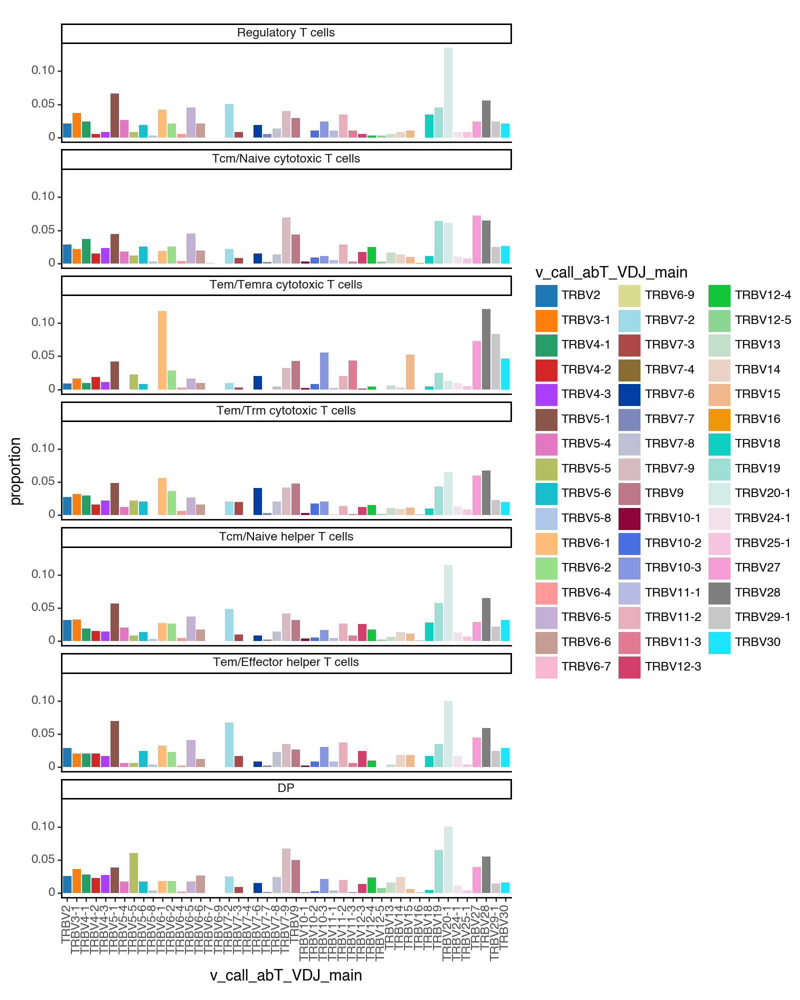

<Figure Size: (800 x 1000)>

In [249]:
# remove MAIT cells
options.figure_size = (8, 10)
(
    ggplot(
        working_df[working_df.celltypist_annotation != "MAIT cells"],
        aes(x="v_call_abT_VDJ_main", y="proportion", fill="v_call_abT_VDJ_main"),
    )
    + geom_bar(stat="identity")
    + facet_wrap("~celltypist_annotation", ncol=1)
    + scale_fill_manual(values=col_palette)
    + theme_classic()
    + theme(axis_text_x=element_text(angle=90))
)

#### J gene (beta chain)

In [250]:
# this dataset has both expanded + non-expanded
working_df = pd.DataFrame(adatax_single.obs.groupby("celltypist_annotation")["j_call_abT_VDJ_main"].value_counts())
working_df.columns =["counts"]
working_df.reset_index(inplace = True)
working_df

,celltypist_annotation,j_call_abT_VDJ_main,counts
0,DP,TRBJ2-1,488
1,DP,TRBJ2-7,475
2,DP,TRBJ2-3,412
3,DP,TRBJ1-1,357
4,DP,TRBJ2-2,260
...,...,...,...
99,Tem/Trm cytotoxic T cells,TRBJ1-4,51
100,Tem/Trm cytotoxic T cells,TRBJ1-6,45
101,Tem/Trm cytotoxic T cells,TRBJ2-6,33
102,Tem/Trm cytotoxic T cells,TRBJ1-3,30


In [251]:
# get total cell counts
total_count_dict = {}
for x in working_df.celltypist_annotation.unique():
    tmp = working_df[working_df["celltypist_annotation"] == x]
    total_count_dict[x] = tmp["counts"].sum()
total_count_dict

{'DP': 2933,
 'MAIT cells': 956,
 'Regulatory T cells': 376,
 'Tcm/Naive cytotoxic T cells': 3504,
 'Tcm/Naive helper T cells': 13167,
 'Tem/Effector helper T cells': 490,
 'Tem/Temra cytotoxic T cells': 1030,
 'Tem/Trm cytotoxic T cells': 1620}

In [252]:
# work out proportion
working_df["proportion"] = 0
# normalise to total
for i, row in working_df.iterrows():
    try:
        working_df.at[i, "proportion"] = row["counts"] / total_count_dict[row["celltypist_annotation"]]
    except:
        pass

In [253]:
working_df

,celltypist_annotation,j_call_abT_VDJ_main,counts,proportion
0,DP,TRBJ2-1,488,0.166383
1,DP,TRBJ2-7,475,0.161950
2,DP,TRBJ2-3,412,0.140471
3,DP,TRBJ1-1,357,0.121718
4,DP,TRBJ2-2,260,0.088646
...,...,...,...,...
99,Tem/Trm cytotoxic T cells,TRBJ1-4,51,0.031481
100,Tem/Trm cytotoxic T cells,TRBJ1-6,45,0.027778
101,Tem/Trm cytotoxic T cells,TRBJ2-6,33,0.020370
102,Tem/Trm cytotoxic T cells,TRBJ1-3,30,0.018519


In [254]:
#reorder
working_df["celltypist_annotation"] = working_df[
    "celltypist_annotation"
].cat.reorder_categories(
    [
        "MAIT cells",
        "Regulatory T cells",
        "Tcm/Naive cytotoxic T cells",
        "Tem/Temra cytotoxic T cells",
        "Tem/Trm cytotoxic T cells",
        "Tcm/Naive helper T cells",
        "Tem/Effector helper T cells",
        "DP",
    ]
)

In [255]:
from scanpy.plotting.palettes import default_20, default_28

col_palette = default_20 + default_28
col_palette

['#1f77b4',
 '#ff7f0e',
 '#279e68',
 '#d62728',
 '#aa40fc',
 '#8c564b',
 '#e377c2',
 '#b5bd61',
 '#17becf',
 '#aec7e8',
 '#ffbb78',
 '#98df8a',
 '#ff9896',
 '#c5b0d5',
 '#c49c94',
 '#f7b6d2',
 '#dbdb8d',
 '#9edae5',
 '#ad494a',
 '#8c6d31',
 '#023fa5',
 '#7d87b9',
 '#bec1d4',
 '#d6bcc0',
 '#bb7784',
 '#8e063b',
 '#4a6fe3',
 '#8595e1',
 '#b5bbe3',
 '#e6afb9',
 '#e07b91',
 '#d33f6a',
 '#11c638',
 '#8dd593',
 '#c6dec7',
 '#ead3c6',
 '#f0b98d',
 '#ef9708',
 '#0fcfc0',
 '#9cded6',
 '#d5eae7',
 '#f3e1eb',
 '#f6c4e1',
 '#f79cd4',
 '#7f7f7f',
 '#c7c7c7',
 '#1CE6FF',
 '#336600']

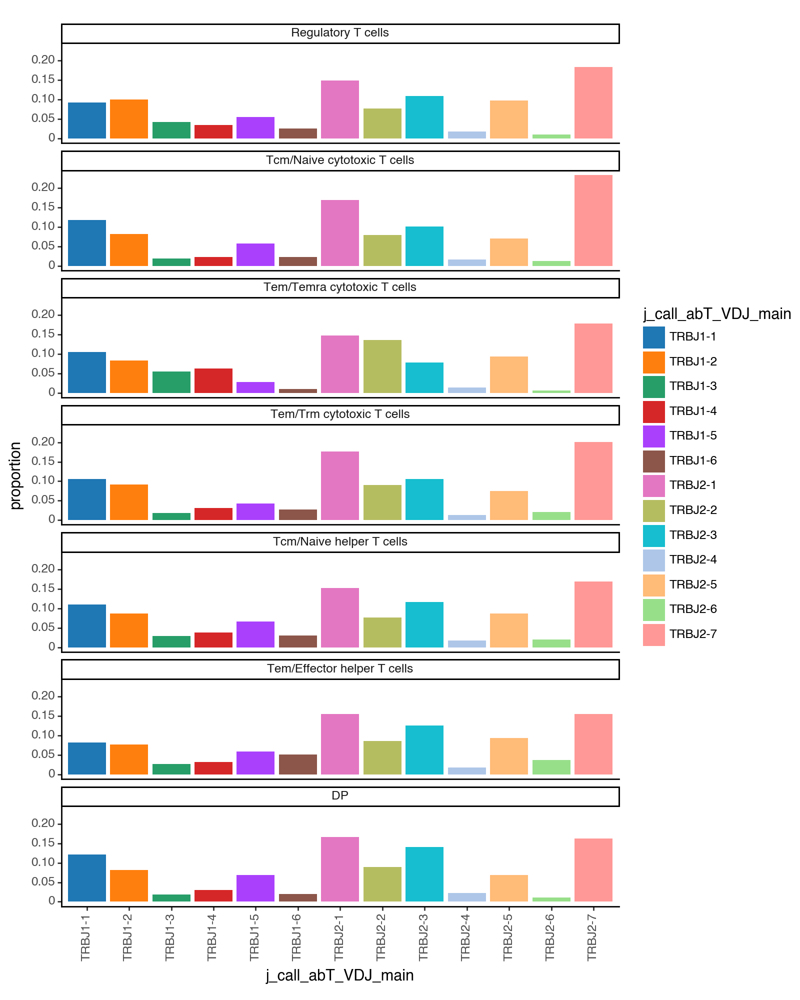

<Figure Size: (800 x 1000)>

In [256]:
# remove MAIT cells
options.figure_size = (8, 10)
(
    ggplot(
        working_df[working_df.celltypist_annotation != "MAIT cells"],
        aes(x="j_call_abT_VDJ_main", y="proportion", fill="j_call_abT_VDJ_main"),
    )
    + geom_bar(stat="identity")
    + facet_wrap("~celltypist_annotation", ncol=1)
    + scale_fill_manual(values=col_palette)
    + theme_classic()
    + theme(axis_text_x=element_text(angle=90))
)

#### V gene (alpha chain)

In [264]:
# this dataset has both expanded + non-expanded
working_df = pd.DataFrame(adatax_single.obs.groupby("celltypist_annotation")["v_call_abT_VJ_main"].value_counts())
working_df.columns =["counts"]
working_df.reset_index(inplace = True)
working_df

,celltypist_annotation,v_call_abT_VJ_main,counts
0,DP,TRAV12-2,260
1,DP,TRAV13-2,213
2,DP,TRAV29/DV5,178
3,DP,TRAV38-2/DV8,173
4,DP,TRAV21,167
...,...,...,...
347,Tem/Trm cytotoxic T cells,TRAV34,8
348,Tem/Trm cytotoxic T cells,TRAV6,7
349,Tem/Trm cytotoxic T cells,TRAV40,5
350,Tem/Trm cytotoxic T cells,TRAV9-1,1


In [265]:
# get total cell counts
total_count_dict = {}
for x in working_df.celltypist_annotation.unique():
    tmp = working_df[working_df["celltypist_annotation"] == x]
    total_count_dict[x] = tmp["counts"].sum()
total_count_dict

{'DP': 2933,
 'MAIT cells': 956,
 'Regulatory T cells': 376,
 'Tcm/Naive cytotoxic T cells': 3504,
 'Tcm/Naive helper T cells': 13167,
 'Tem/Effector helper T cells': 490,
 'Tem/Temra cytotoxic T cells': 1030,
 'Tem/Trm cytotoxic T cells': 1620}

In [266]:
# work out proportion
working_df["proportion"] = 0
# normalise to total
for i, row in working_df.iterrows():
    try:
        working_df.at[i, "proportion"] = row["counts"] / total_count_dict[row["celltypist_annotation"]]
    except:
        pass

In [267]:
working_df

,celltypist_annotation,v_call_abT_VJ_main,counts,proportion
0,DP,TRAV12-2,260,0.088646
1,DP,TRAV13-2,213,0.072622
2,DP,TRAV29/DV5,178,0.060689
3,DP,TRAV38-2/DV8,173,0.058984
4,DP,TRAV21,167,0.056938
...,...,...,...,...
347,Tem/Trm cytotoxic T cells,TRAV34,8,0.004938
348,Tem/Trm cytotoxic T cells,TRAV6,7,0.004321
349,Tem/Trm cytotoxic T cells,TRAV40,5,0.003086
350,Tem/Trm cytotoxic T cells,TRAV9-1,1,0.000617


In [268]:
#reorder
working_df["celltypist_annotation"] = working_df[
    "celltypist_annotation"
].cat.reorder_categories(
    [
        "MAIT cells",
        "Regulatory T cells",
        "Tcm/Naive cytotoxic T cells",
        "Tem/Temra cytotoxic T cells",
        "Tem/Trm cytotoxic T cells",
        "Tcm/Naive helper T cells",
        "Tem/Effector helper T cells",
        "DP",
    ]
)

In [269]:
from scanpy.plotting.palettes import default_20, default_28

col_palette = default_20 + default_28
col_palette

['#1f77b4',
 '#ff7f0e',
 '#279e68',
 '#d62728',
 '#aa40fc',
 '#8c564b',
 '#e377c2',
 '#b5bd61',
 '#17becf',
 '#aec7e8',
 '#ffbb78',
 '#98df8a',
 '#ff9896',
 '#c5b0d5',
 '#c49c94',
 '#f7b6d2',
 '#dbdb8d',
 '#9edae5',
 '#ad494a',
 '#8c6d31',
 '#023fa5',
 '#7d87b9',
 '#bec1d4',
 '#d6bcc0',
 '#bb7784',
 '#8e063b',
 '#4a6fe3',
 '#8595e1',
 '#b5bbe3',
 '#e6afb9',
 '#e07b91',
 '#d33f6a',
 '#11c638',
 '#8dd593',
 '#c6dec7',
 '#ead3c6',
 '#f0b98d',
 '#ef9708',
 '#0fcfc0',
 '#9cded6',
 '#d5eae7',
 '#f3e1eb',
 '#f6c4e1',
 '#f79cd4',
 '#7f7f7f',
 '#c7c7c7',
 '#1CE6FF',
 '#336600']

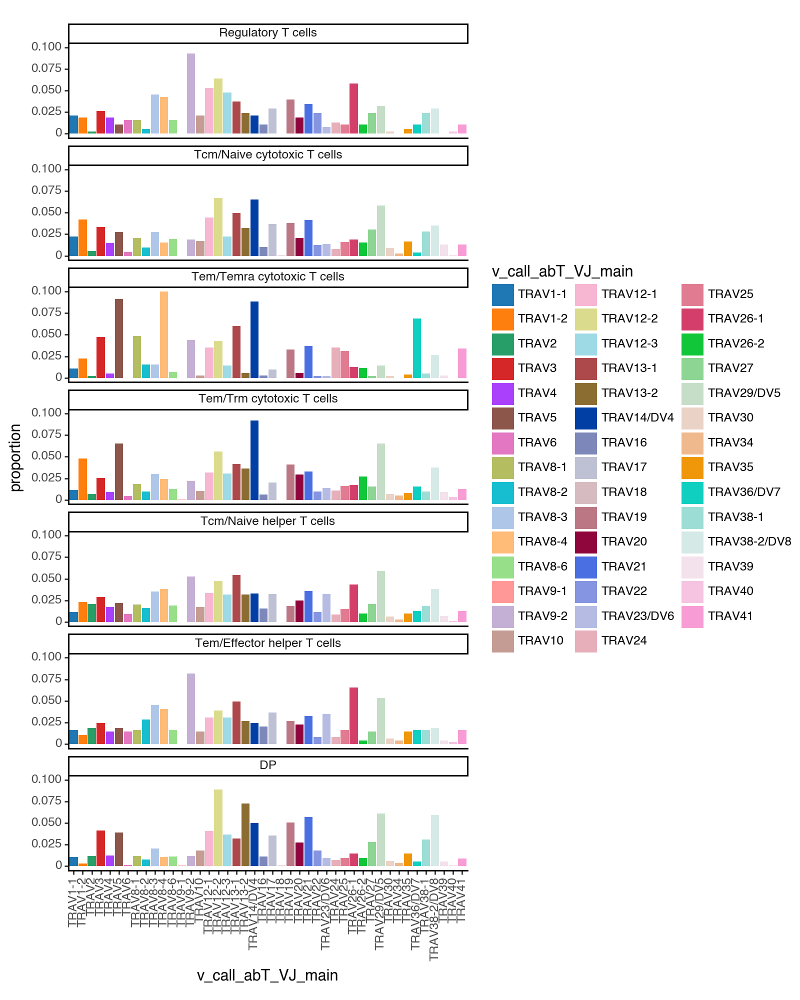

<Figure Size: (800 x 1000)>

In [270]:
# remove MAIT cells
options.figure_size = (8, 10)
(
    ggplot(
        working_df[working_df.celltypist_annotation != "MAIT cells"],
        aes(x="v_call_abT_VJ_main", y="proportion", fill="v_call_abT_VJ_main"),
    )
    + geom_bar(stat="identity")
    + facet_wrap("~celltypist_annotation", ncol=1)
    + scale_fill_manual(values=col_palette)
    + theme_classic()
    + theme(axis_text_x=element_text(angle=90))
)

#### J gene (alpha chain)

In [271]:
# this dataset has both expanded + non-expanded
working_df = pd.DataFrame(adatax_single.obs.groupby("celltypist_annotation")["j_call_abT_VJ_main"].value_counts())
working_df.columns =["counts"]
working_df.reset_index(inplace = True)
working_df

,celltypist_annotation,j_call_abT_VJ_main,counts
0,DP,TRAJ20,296
1,DP,TRAJ40,130
2,DP,TRAJ21,124
3,DP,TRAJ52,98
4,DP,TRAJ43,96
...,...,...,...
419,Tem/Trm cytotoxic T cells,TRAJ7,8
420,Tem/Trm cytotoxic T cells,TRAJ56,8
421,Tem/Trm cytotoxic T cells,TRAJ46,2
422,Tem/Trm cytotoxic T cells,TRAJ25,0


In [272]:
# get total cell counts
total_count_dict = {}
for x in working_df.celltypist_annotation.unique():
    tmp = working_df[working_df["celltypist_annotation"] == x]
    total_count_dict[x] = tmp["counts"].sum()
total_count_dict

{'DP': 2933,
 'MAIT cells': 956,
 'Regulatory T cells': 376,
 'Tcm/Naive cytotoxic T cells': 3504,
 'Tcm/Naive helper T cells': 13167,
 'Tem/Effector helper T cells': 490,
 'Tem/Temra cytotoxic T cells': 1030,
 'Tem/Trm cytotoxic T cells': 1620}

In [273]:
# work out proportion
working_df["proportion"] = 0
# normalise to total
for i, row in working_df.iterrows():
    try:
        working_df.at[i, "proportion"] = row["counts"] / total_count_dict[row["celltypist_annotation"]]
    except:
        pass

In [274]:
working_df

,celltypist_annotation,j_call_abT_VJ_main,counts,proportion
0,DP,TRAJ20,296,0.100921
1,DP,TRAJ40,130,0.044323
2,DP,TRAJ21,124,0.042278
3,DP,TRAJ52,98,0.033413
4,DP,TRAJ43,96,0.032731
...,...,...,...,...
419,Tem/Trm cytotoxic T cells,TRAJ7,8,0.004938
420,Tem/Trm cytotoxic T cells,TRAJ56,8,0.004938
421,Tem/Trm cytotoxic T cells,TRAJ46,2,0.001235
422,Tem/Trm cytotoxic T cells,TRAJ25,0,0.000000


In [275]:
#reorder
working_df["celltypist_annotation"] = working_df[
    "celltypist_annotation"
].cat.reorder_categories(
    [
        "MAIT cells",
        "Regulatory T cells",
        "Tcm/Naive cytotoxic T cells",
        "Tem/Temra cytotoxic T cells",
        "Tem/Trm cytotoxic T cells",
        "Tcm/Naive helper T cells",
        "Tem/Effector helper T cells",
        "DP",
    ]
)

In [276]:
from scanpy.plotting.palettes import default_20, default_28

col_palette = default_20 + default_28
col_palette

['#1f77b4',
 '#ff7f0e',
 '#279e68',
 '#d62728',
 '#aa40fc',
 '#8c564b',
 '#e377c2',
 '#b5bd61',
 '#17becf',
 '#aec7e8',
 '#ffbb78',
 '#98df8a',
 '#ff9896',
 '#c5b0d5',
 '#c49c94',
 '#f7b6d2',
 '#dbdb8d',
 '#9edae5',
 '#ad494a',
 '#8c6d31',
 '#023fa5',
 '#7d87b9',
 '#bec1d4',
 '#d6bcc0',
 '#bb7784',
 '#8e063b',
 '#4a6fe3',
 '#8595e1',
 '#b5bbe3',
 '#e6afb9',
 '#e07b91',
 '#d33f6a',
 '#11c638',
 '#8dd593',
 '#c6dec7',
 '#ead3c6',
 '#f0b98d',
 '#ef9708',
 '#0fcfc0',
 '#9cded6',
 '#d5eae7',
 '#f3e1eb',
 '#f6c4e1',
 '#f79cd4',
 '#7f7f7f',
 '#c7c7c7',
 '#1CE6FF',
 '#336600']

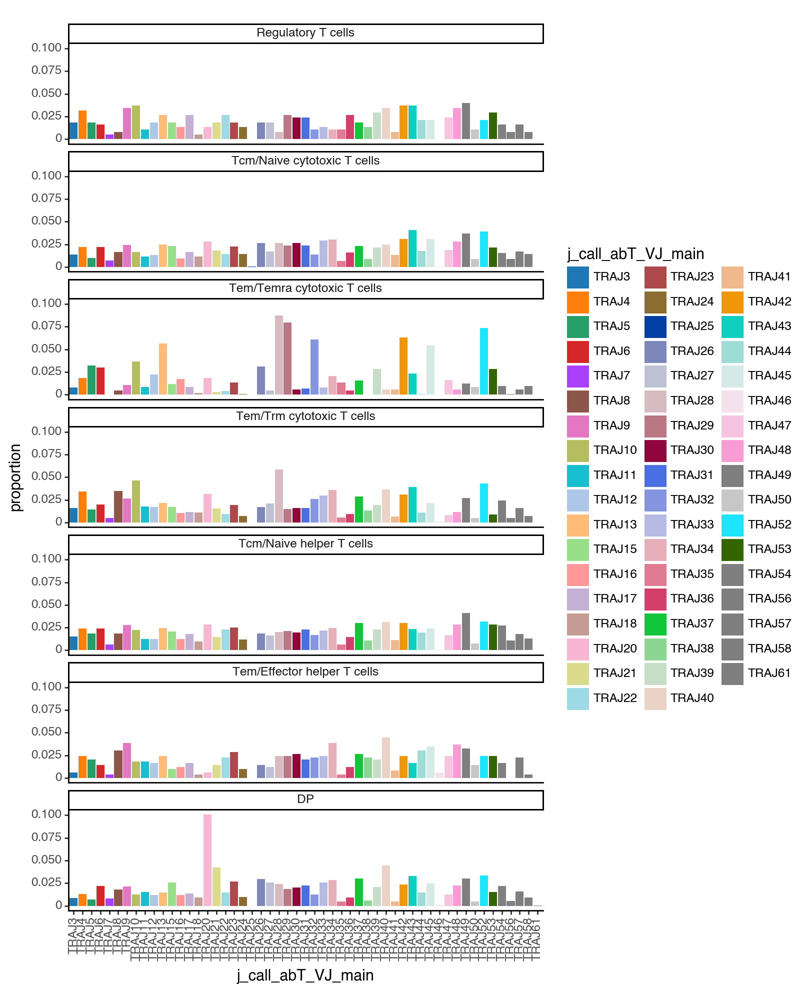

<Figure Size: (800 x 1000)>

In [277]:
# remove MAIT cells
options.figure_size = (8, 10)
(
    ggplot(
        working_df[working_df.celltypist_annotation != "MAIT cells"],
        aes(x="j_call_abT_VJ_main", y="proportion", fill="j_call_abT_VJ_main"),
    )
    + geom_bar(stat="identity")
    + facet_wrap("~celltypist_annotation", ncol=1)
    + scale_fill_manual(values=col_palette)
    + theme_classic()
    + theme(axis_text_x=element_text(angle=90))
)

## Filtering for anything with chains>2

In [113]:
adatax_single2 = adatax_single[adatax_single.obs['clone_id_size_max_3'].isin (['1','2'])]
adatax_single2

View of AnnData object with n_obs × n_vars = 21223 × 2285
    obs: 'sample', 'sort_type', 'donor', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'scrublet_score', 'n_genes', 'gmm_pct_count_clusters_keep', 'is_doublet', 'filter_rna', 'batch', 'CD4/CD8_geneset', 'leiden', 'celltypist_majority_voting', 'celltypist_annotation', 'has_contig', 'filter_contig_quality', 'filter_contig_VDJ', 'filter_contig_VJ', 'contig_QC_pass', 'filter_contig', 'clone_id', 'clone_id_by_size', 'locus_VDJ', 'locus_VJ', 'productive_VDJ', 'productive_VJ', 'v_call_VDJ', 'd_call_VDJ', 'j_call_VDJ', 'v_call_VJ', 'j_call_VJ', 'c_call_VDJ', 'c_call_VJ', 'junction_VDJ', 'junction_VJ', 'junction_aa_VDJ', 'junction_aa_VJ', 'v_call_abT_VDJ', 'd_call_abT_VDJ', 'j_call_abT_VDJ', 'v_call_abT_VJ', 'j_call_abT_VJ', 'c_call_abT_VDJ', 'c_call_abT_VJ', 'productive_abT_VDJ', 'productive_abT_VJ', 'duplicate_count_abT_VDJ', 'duplicate_count_abT_VJ', 'v_call_VDJ_main', 'v_call_VJ_main', 'd_call_VDJ_main', 'j

findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: 

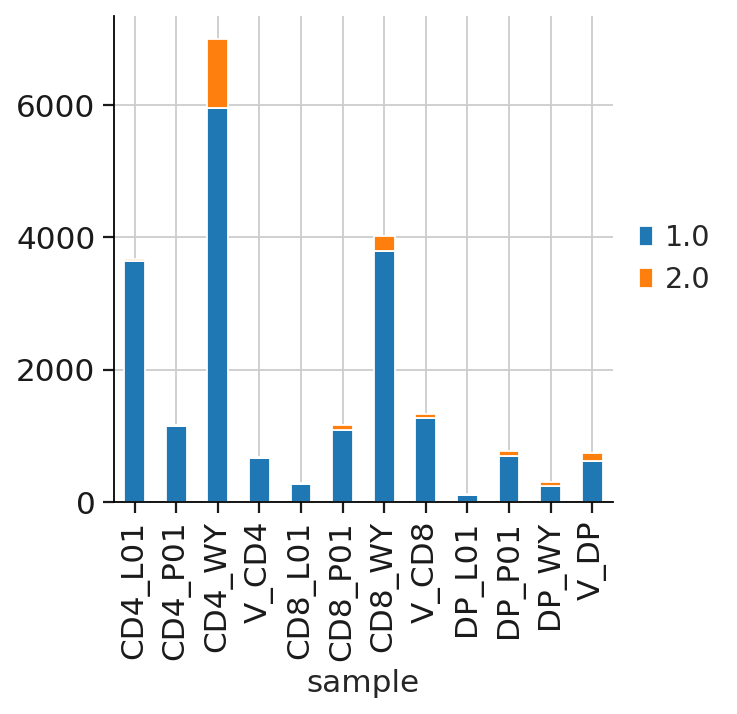

In [114]:
pd.crosstab(
    adatax_single2.obs["sample"],
    adatax_single2.obs["clone_id_size"],
).plot.bar(stacked=True)
plt.legend(bbox_to_anchor=(1, 0.5), loc="center left", frameon=False)

findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: 

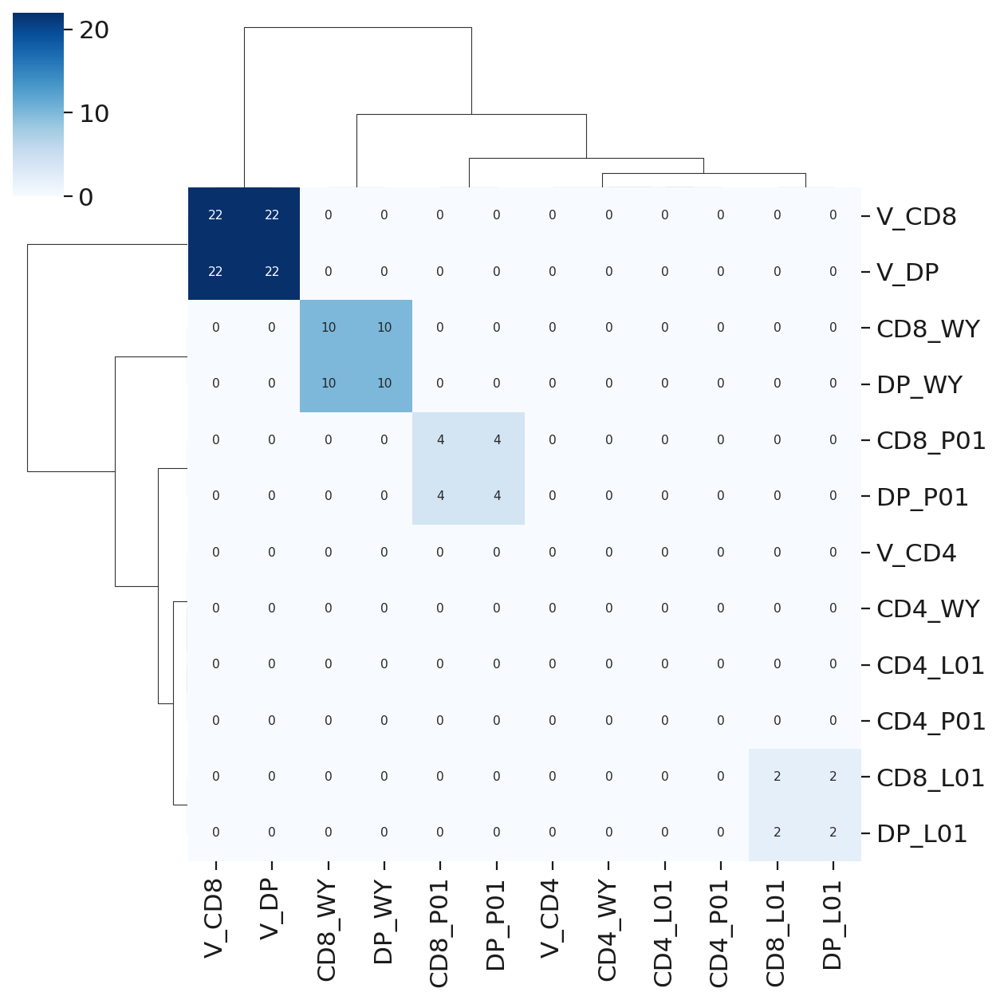

In [116]:
adatax_single2.obs["sample"] = adatax_single2.obs["sample"].cat.reorder_categories(["CD4_L01", "CD4_P01", "CD4_WY", "V_CD4","CD8_L01", "CD8_P01", "CD8_WY", "V_CD8","DP_L01", "DP_P01", "DP_WY", "V_DP",])
ddl.tl.clone_overlap(
    adatax_single2, groupby="sample", weighted_overlap=True
)

ddl.pl.clone_overlap(
    adatax_single2,
    groupby="sample",
    #colorby="celltypist_annotation",
    weighted_overlap=True,
    as_heatmap=True,
    # seaborn clustermap kwargs
    cmap="Blues",
    annot=True,
    figsize=(8, 8),
    annot_kws={"size": 7},
)

findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: 

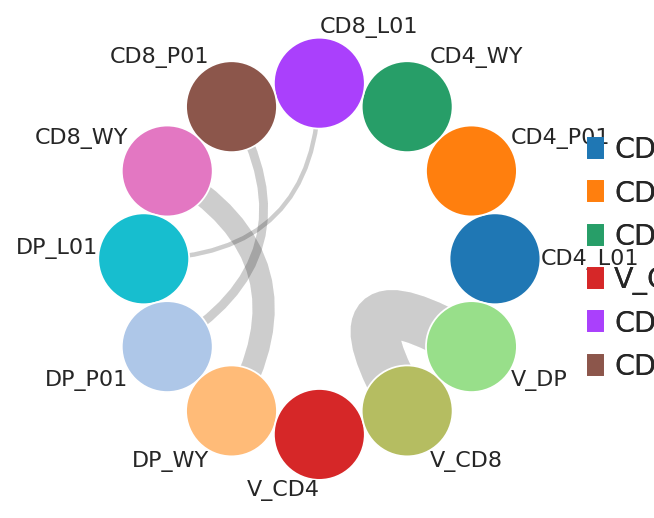

In [117]:
ddl.tl.clone_overlap(
    adatax_single2, groupby="sample", weighted_overlap=True
)

ddl.pl.clone_overlap(
    adatax_single2, groupby="sample", colorby="sample", weighted_overlap=True
)

findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: 

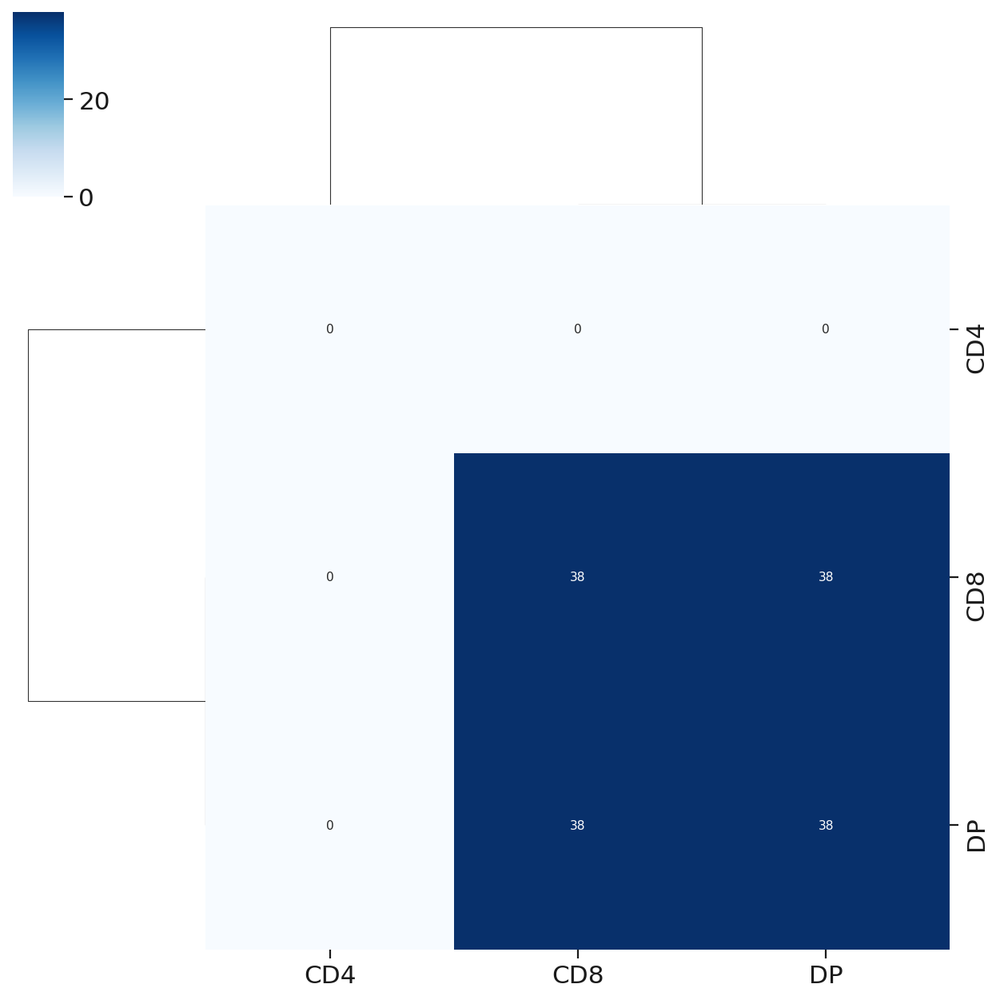

In [121]:
ddl.tl.clone_overlap(
    adatax_single2, groupby="sort_type", weighted_overlap=True
)

ddl.pl.clone_overlap(
    adatax_single2,
    groupby="sort_type",
    #colorby="celltypist_annotation",
    weighted_overlap=True,
    as_heatmap=True,
    # seaborn clustermap kwargs
    cmap="Blues",
    annot=True,
    figsize=(8, 8),
    annot_kws={"size": 7},
)

findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: 

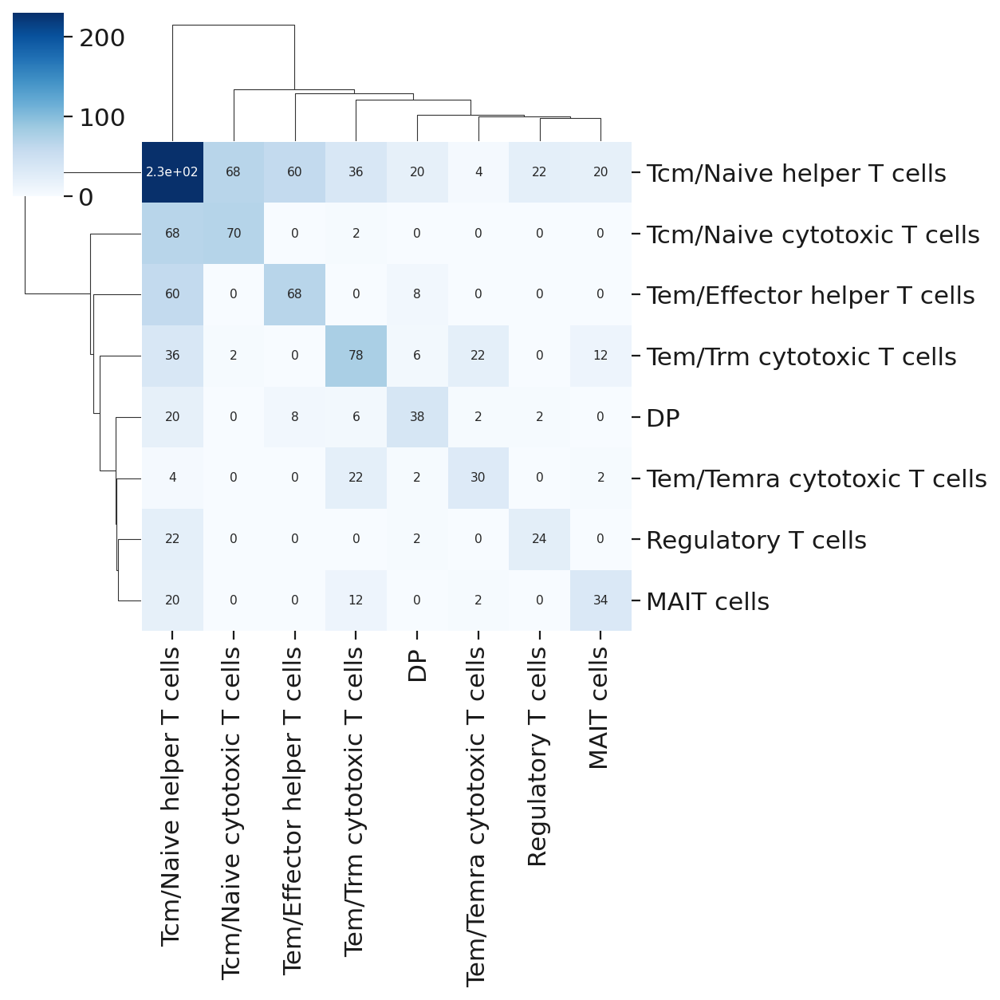

In [122]:
ddl.tl.clone_overlap(
    adatax_single2, groupby="celltypist_annotation", weighted_overlap=True
)

ddl.pl.clone_overlap(
    adatax_single2,
    groupby="celltypist_annotation",
    #colorby="celltypist_annotation",
    weighted_overlap=True,
    as_heatmap=True,
    # seaborn clustermap kwargs
    cmap="Blues",
    annot=True,
    figsize=(8, 8),
    annot_kws={"size": 7},
)

findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: 

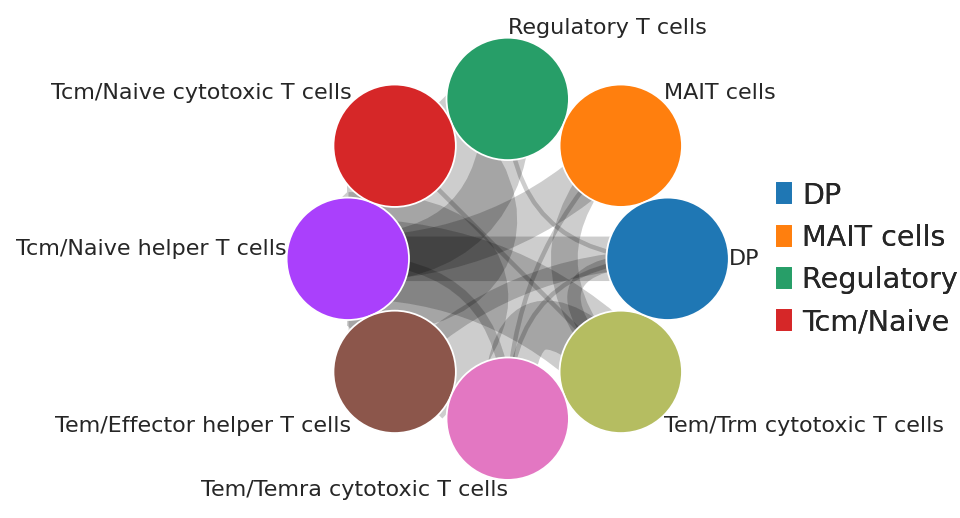

In [123]:
ddl.tl.clone_overlap(
    adatax_single2, groupby="celltypist_annotation", weighted_overlap=True
)

ddl.pl.clone_overlap(
    adatax_single2, groupby="celltypist_annotation", colorby="celltypist_annotation", weighted_overlap=True
)

### This looks better --- DP cells are MOST related to CD4s!

In [124]:
adatax_single2 = ddl.tl.setup_vdj_pseudobulk(adatax_single2)

In [125]:
sc.pp.neighbors(adatax_single2, use_rep="X_umap", n_neighbors=50)
milo.make_nhoods(adatax_single2)
sc.tl.umap(adatax_single2)

In [126]:
pb_adatax_single2 = ddl.tl.vdj_pseudobulk(
    adatax_single2, pbs=adatax_single2.obsm["nhoods"], obs_to_take="celltypist_annotation"
)

In [127]:
sc.tl.pca(pb_adatax_single2)

findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: 

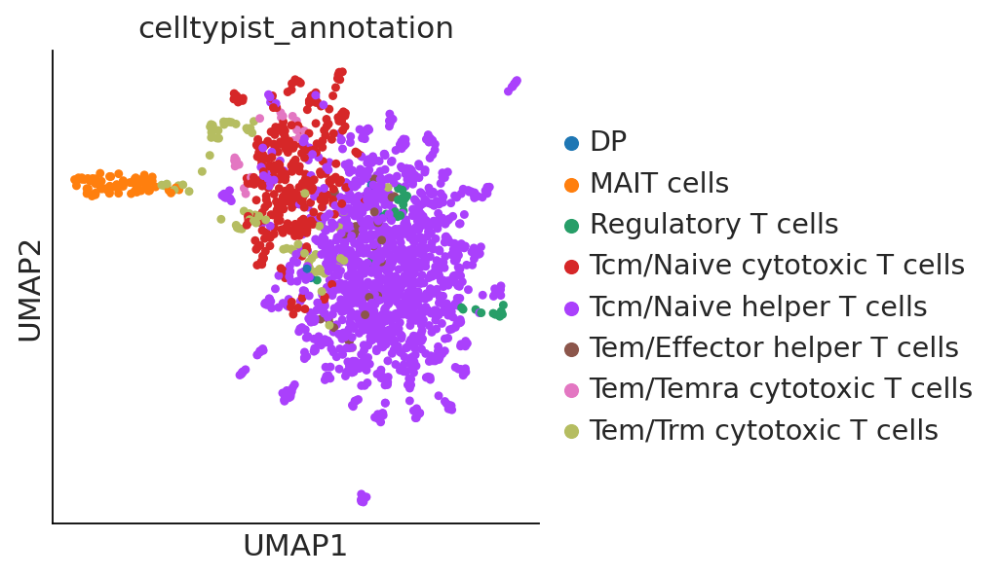

In [128]:
sc.pp.neighbors(pb_adatax_single2)
sc.tl.umap(pb_adatax_single2)
sc.pl.umap(pb_adatax_single2, color="celltypist_annotation")

findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: 

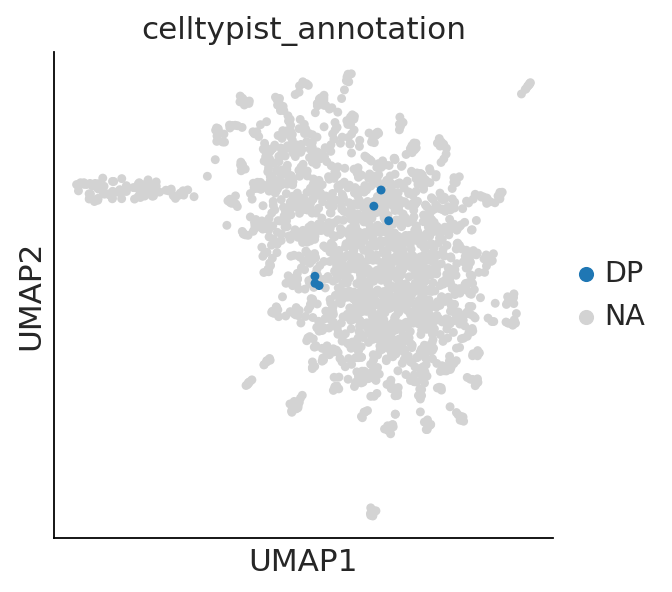

In [129]:
sc.pl.umap(pb_adatax_single2, color="celltypist_annotation", groups = ['DP'])